<a name="intro"></a>
# An **interpretable KAN Regressor**
Predict the per-bin expected probability distribution of photon counts, combining temporal information with satellite info/metadata (e.g., coordinates, altitudes, position), verifying whether the predicted distribution aligns with the theoretical or expected probability distribution.

## **Importing** libraries

In [ ]:
import sys
from google.colab import drive

drive.mount('/content/drive', force_remount=True)
sys.path.append('/content/drive/MyDrive/Colab Notebooks/Internship + Thesis')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import sys
import math
import importlib
import viz_utils

from scipy.signal import find_peaks
from statsmodels.tsa.stattools import acf
from viz_utils import *

In [ ]:
importlib.reload(viz_utils)

<module 'viz_utils' from '/content/drive/MyDrive/Colab Notebooks/Internship + Thesis/viz_utils.py'>

## **Inspecting** the data
Let's import our orientation dataframe, that will mainly contain satellite metadata.

In [ ]:
# Loading dataset and printing shape
satellite_data_original = pd.read_excel('/content/drive/MyDrive/Colab Notebooks/Internship + Thesis/data/satellite_data_mod.xlsx')
print(f"Satellite dataset shape: {satellite_data_original.shape}")

Satellite dataset shape: (5761, 9)


In [ ]:
satellite_data_original.head()

,TypeOrientationsGalactic,timestamp,x_lat,x_lon,z_lat,z_lon(galactic),altitude(km),Earth_lat,Earth_lon
0,OG,1.835487e+09,59.274529,22.415898,-30.725471,22.415898,530.222097,-0.000190,27.047042
1,OG,1.835487e+09,58.504010,22.732337,-31.495990,22.732337,530.219997,-0.000184,27.927215
2,OG,1.835487e+09,57.732736,23.048787,-32.267264,23.048787,530.216960,-0.000177,28.807377
3,OG,1.835487e+09,56.960731,23.365378,-33.039269,23.365378,530.212986,-0.000171,29.687529
4,OG,1.835487e+09,56.188017,23.682244,-33.811983,23.682244,530.208077,-0.000165,30.567670


In [ ]:
satellite_data_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5761 entries, 0 to 5760
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   TypeOrientationsGalactic  5761 non-null   object 
 1   timestamp                 5761 non-null   float64
 2   x_lat                     5761 non-null   float64
 3   x_lon                     5761 non-null   float64
 4   z_lat                     5761 non-null   float64
 5   z_lon(galactic)           5761 non-null   float64
 6   altitude(km)              5761 non-null   float64
 7   Earth_lat                 5761 non-null   float64
 8   Earth_lon                 5761 non-null   float64
dtypes: float64(8), object(1)
memory usage: 405.2+ KB


We can drop the Type of Orientations Galactic column, since it does not provide useful information.

In [ ]:
satellite_data_original = satellite_data_original.drop(columns=['TypeOrientationsGalactic'])
satellite_data_original.rename(columns={'z_lon(galactic)':'z_lon'}, inplace=True)
input_features = satellite_data_original.columns.drop(['timestamp'])
print(f"Input features: {input_features}")

Input features: Index(['x_lat', 'x_lon', 'z_lat', 'z_lon', 'altitude(km)', 'Earth_lat',
       'Earth_lon'],
      dtype='object')


In [ ]:
# overall description
satellite_data_original.describe()

,timestamp,x_lat,x_lon,z_lat,z_lon,altitude(km),Earth_lat,Earth_lon
count,5.761000e+03,5761.000000,5761.000000,5761.000000,5761.000000,5761.000000,5761.000000,5761.000000
mean,1.835530e+09,54.089440,122.407505,-0.245103,157.370185,526.798419,-0.000162,179.255362
std,2.494803e+04,22.704842,75.078192,42.488139,103.711938,2.445737,0.000121,104.154585
min,1.835487e+09,5.251886,8.181763,-84.744034,0.005977,523.323590,-0.000412,0.003675
25%,1.835509e+09,41.281750,53.891935,-34.585383,50.056662,524.359281,-0.000256,88.627557
50%,1.835530e+09,55.819180,121.732866,-0.369437,179.006845,526.830513,-0.000167,178.995223
75%,1.835552e+09,71.944084,188.336870,33.814511,230.402957,529.248357,-0.000080,269.486623
max,1.835574e+09,89.995229,237.654764,84.748114,359.910660,530.223516,0.000122,359.949445


> We spot that `z_lon` and `Earth_lon` are **periodic** variables, because they range in the interval `[0, 360]`.

Visualizing columns

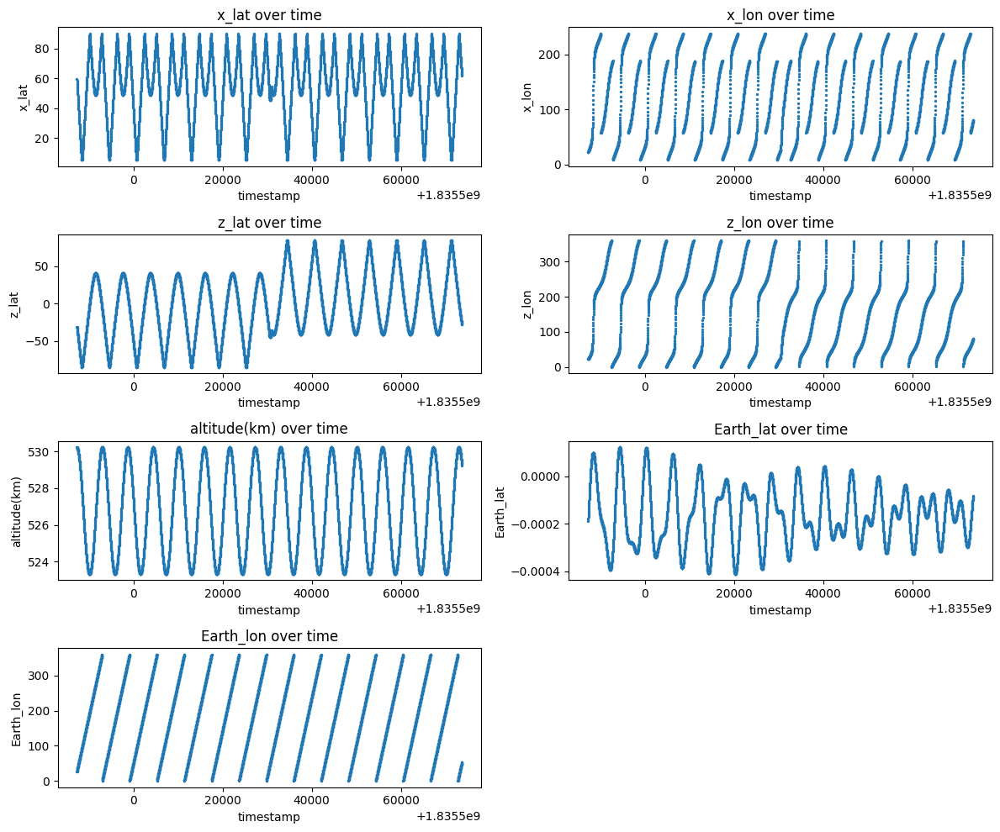

In [ ]:
viz_df_cols(satellite_data_original, cols_to_plot=input_features)

> We can easily spot how all of the feature columns show some kind of obscillatory pattern, due to the satellite **orbit motion**, that repeats itself every *N* timestamps.

#### Feature explanation

The columns of the orientation dataframe constitute the input features of our regressor. It is therefore useful to clarify their physical meaning. The x and z coordinates describe the orientation (attitude) of the spacecraft, i.e., the pointing directions of two of its body axes. The +X axis is a lateral axis defined by the mechanical structure of the spacecraft, while the +Z axis corresponds to the main primary pointing direction of the satellite (the boresight).

- **x_lat / x_lon:** latitude and longitude of the spacecraft’s +X axis direction, expressed in an Earth-centered celestial reference frame.
- **z_lat / z_lon:** latitude and longitude of the spacecraft’s +Z axis, i.e., the main pointing direction (boresight) projected in the same reference frame.
- **altitude**: the orbital altitude (in km) of the satellite above Earth’s surface.
- **Earth_lat / Earth_lon**: geographic latitude and longitude of the satellite’s sub-satellite point, i.e., the point on Earth directly underneath the spacecraft at each instant. These coordinates describe the satellite’s position along its orbit, independent of its pointing direction.


Loading other data

In [ ]:
# Loading time and rate arrays for different time res.
time_array_15s = np.load('/content/drive/MyDrive/Colab Notebooks/Internship + Thesis/data/time_array.npy')
total_counts_15s = np.load('/content/drive/MyDrive/Colab Notebooks/Internship + Thesis/data/total_counts.npy')
total_rates_15s = np.load('/content/drive/MyDrive/Colab Notebooks/Internship + Thesis/data/total_rates.npy')

time_array_50ms = np.load('/content/drive/MyDrive/Colab Notebooks/Internship + Thesis/data/total_time_50ms.npy')
total_counts_50ms = np.load('/content/drive/MyDrive/Colab Notebooks/Internship + Thesis/data/total_counts_50ms.npy')
total_rates_50ms = np.load('/content/drive/MyDrive/Colab Notebooks/Internship + Thesis/data/total_rates_50ms.npy')

time_array_1s = np.load('/content/drive/MyDrive/Colab Notebooks/Internship + Thesis/data/total_time_1s.npy')
total_counts_1s = np.load('/content/drive/MyDrive/Colab Notebooks/Internship + Thesis/data/total_counts_1s.npy')
total_rates_1s = np.load('/content/drive/MyDrive/Colab Notebooks/Internship + Thesis/data/total_rates_1s.npy')

Here, `total_rates` contains the rates for each of the 6 detectors with 15s bins, while `time_array` contains the time associated with the rates

The *i-th* element of the rate array is aligned with the *i-th* element of the time array.

In [ ]:
print(f"15s arrays:\nCount rates shape: {total_rates_15s.shape}") #contains the GRB rates for each of the 6 detectors with 15s bins
print(f"Counts shape: {time_array_15s.shape}") #contains the GRB counts for each of the 6 detectors
print(f"Timesteps array shape: {time_array_15s.shape}") #contains the time associated with the rates

print(f"\n50ms arrays:\nCount rates shape: {total_rates_50ms.shape}") #contains the GRB rates for each of the 6 detectors with 50ms bins
print(f"Counts shape: {time_array_50ms.shape}")
print(f"Timesteps array shape: {time_array_50ms.shape}")

print(f"\n1s arrays:\nCount rates shape: {total_rates_1s.shape}") #contains the GRB rates for each of the 6 detectors with 1s bins
print(f"Counts shape: {time_array_1s.shape}")
print(f"Timesteps array shape: {time_array_1s.shape}")

15s arrays:
Count rates shape: (5761, 6, 1)
Counts shape: (5761,)
Timesteps array shape: (5761,)

50ms arrays:
Count rates shape: (1728001, 6, 1)
Counts shape: (1728001,)
Timesteps array shape: (1728001,)

1s arrays:
Count rates shape: (86401, 6, 1)
Counts shape: (86401,)
Timesteps array shape: (86401,)


In [ ]:
print("Counts | Bin 0\n\nNum det.    50ms    1s     15s")
for d in range(len(total_counts_50ms[0])):
    print(f"Detector {d+1}: {total_counts_50ms[0][d][0]:.1f}", end="")
    if d < len(total_counts_1s[0]):
        print(f", {total_counts_1s[0][d][0]:.1f}", end="")
    if d < len(total_counts_15s[0]):
        print(f", {total_counts_15s[0][d][0]:.1f}", end="")
    print()

Counts | Bin 0

Num det.    50ms    1s     15s
Detector 1: 73.0, 1073.0, 15920.0
Detector 2: 56.0, 1047.0, 15580.0
Detector 3: 60.0, 885.0, 13208.0
Detector 4: 45.0, 895.0, 13924.0
Detector 5: 48.0, 863.0, 12682.0
Detector 6: 36.0, 850.0, 12681.0


In [ ]:
print("Rates | Bin 0\n\nNum det.     50ms     1s     15s")
for d in range(len(total_rates_50ms[0])):
    print(f"Detector {d+1}: {total_rates_50ms[0][d][0]:.1f}", end="")
    if d < len(total_rates_1s[0]):
        print(f", {total_rates_1s[0][d][0]:.1f}", end="")
    if d < len(total_rates_15s[0]):
        print(f", {total_rates_15s[0][d][0]:.1f}", end="")
    print()

Rates | Bin 0

Num det.     50ms     1s     15s
Detector 1: 1460.0, 1073.0, 1061.3
Detector 2: 1120.0, 1047.0, 1038.7
Detector 3: 1200.0, 885.0, 880.5
Detector 4: 900.0, 895.0, 928.3
Detector 5: 960.0, 863.0, 845.5
Detector 6: 720.0, 850.0, 845.4


### Updating orientation dataframe
Adding a count rates column for each detector, aligning the timestamps between arrays.


In [ ]:
input_features = ["x_lat", "x_lon", "z_lat", "z_lon", "altitude(km)",	"Earth_lat", "Earth_lon"]
target_features = [f"counts_det_{i+1}" for i in range(6)]
n_detectors = len(total_counts_15s[0])
target_count_str = "counts_det_"
det_names = {
    "det_1":"bgo_z1",
    "det_2":"bgo_z0",
    "det_3":"bgo_x1",
    "det_4":"bgo_x0",
    "det_5":"bgo_y1",
    "det_6":"bgo_y0",
}

##### **Interpolation**
Interpolates feature values sampled every 15 s to a finer time resolution
(e.g. 1 s or 50 ms) using linear interpolation, and combines them with
detector count data already at the target resolution.

In [ ]:
def interpolate_values(df, time_array_15s, time_array, total_counts,
                       n_detectors, input_features):

    # Ensure sorted input to avoid np.interp inconsistencies
    sort_idx = np.argsort(time_array_15s)
    time_array_15s = np.asarray(time_array_15s)[sort_idx]
    df = df.iloc[sort_idx]

    # Initialize matrix for interpolated features
    feature_matrix = np.zeros((len(time_array), len(input_features)))

    # Linear interpolation for each feature
    for j, feature in enumerate(input_features):
        feature_matrix[:, j] = np.interp(
            x=time_array,
            xp=time_array_15s,
            fp=df[feature].values
        )

    # Ensure total_counts shape is (len(time_array), n_detectors)
    counts_matrix = np.squeeze(np.asarray(total_counts))
    if counts_matrix.shape != (len(time_array), n_detectors):
        raise ValueError(f"Counts shape {counts_matrix.shape} does not match expected ({len(time_array)}, {n_detectors})")

    # Assemble new dataframe
    new_df = pd.DataFrame(feature_matrix, columns=input_features)
    new_df["timestamp"] = time_array
    for i in range(n_detectors):
        new_df[f"{target_count_str}{i+1}"] = counts_matrix[:, i]

    # Reorder columns
    cols = ["timestamp"] + input_features + [f"{target_count_str}{i+1}" for i in range(n_detectors)]
    new_df = new_df[cols]

    return new_df


###### Handling 50ms arrays

In [ ]:
num_samples_50ms = len(time_array_50ms)
num_samples_15s = len(time_array_15s)
ms_15s = 15000 #15s in ms

# Sanity check
sec_per_day_50ms = num_samples_50ms * 50 / 1000
sec_per_day_15s = num_samples_15s * 15
print(f"Number of seconds per day (≈ {24*3600}): {sec_per_day_50ms:.2f}, {sec_per_day_15s:.2f}")

# Num. samples per 15s bin
print(f"Number of samples of 50ms per 15s bin: {int(ms_15s / 50)}")

# Sanity check:
# - the 300th elem. in the 50ms array is the 2nd in the 15s arrays
print(f"\n50ms[300]:\t\t\t {[f'{ts:.2f}' for ts in time_array_50ms[300:301]]}")
print(f"15s[:2]:\t{[f'{ts:.2f}' for ts in time_array_15s[:2]]}")
print(f"df(15s)[:2]:\t{[f'{ts:.2f}' for ts in satellite_data_original['timestamp'][:2]]}")

Number of seconds per day (≈ 86400): 86400.05, 86415.00
Number of samples of 50ms per 15s bin: 300

50ms[300]:			 ['1835487315.00']
15s[:2]:	['1835487300.00', '1835487315.00']
df(15s)[:2]:	['1835487300.00', '1835487315.00']


In [ ]:
satellite_data_50ms = interpolate_values(satellite_data_original, time_array_15s, time_array_50ms, total_counts_50ms, n_detectors, input_features)
satellite_data_50ms.head()


,timestamp,x_lat,x_lon,z_lat,z_lon,altitude(km),Earth_lat,Earth_lon,counts_det_1,counts_det_2,counts_det_3,counts_det_4,counts_det_5,counts_det_6
0,1.835487e+09,59.274529,22.415898,-30.725471,22.415898,530.222097,-0.00019,27.047042,73.0,56.0,60.0,45.0,48.0,36.0
1,1.835487e+09,59.271960,22.416953,-30.728040,22.416953,530.222090,-0.00019,27.049976,46.0,46.0,35.0,38.0,44.0,35.0
2,1.835487e+09,59.269392,22.418007,-30.730608,22.418007,530.222083,-0.00019,27.052910,67.0,52.0,44.0,52.0,37.0,42.0
3,1.835487e+09,59.266823,22.419062,-30.733177,22.419062,530.222076,-0.00019,27.055844,57.0,64.0,41.0,35.0,45.0,45.0
4,1.835487e+09,59.264255,22.420117,-30.735745,22.420117,530.222069,-0.00019,27.058778,52.0,51.0,43.0,35.0,27.0,46.0


In [ ]:
satellite_data_50ms.describe()

,timestamp,x_lat,x_lon,z_lat,z_lon,altitude(km),Earth_lat,Earth_lon,counts_det_1,counts_det_2,counts_det_3,counts_det_4,counts_det_5,counts_det_6
count,1.728001e+06,1.728001e+06,1.728001e+06,1.728001e+06,1.728001e+06,1.728001e+06,1.728001e+06,1.728001e+06,1.728001e+06,1.728001e+06,1.728001e+06,1.728001e+06,1.728001e+06,1.728001e+06
mean,1.835529e+09,5.408868e+01,1.224129e+02,-2.396624e-01,1.573817e+02,5.267980e+02,-1.624500e-04,1.792732e+02,4.717812e+01,4.738083e+01,4.064697e+01,4.033663e+01,3.809277e+01,3.807127e+01
std,1.396558e+06,2.270324e+01,7.489372e+01,4.248533e+01,1.034507e+02,2.445443e+00,1.213644e-04,1.038914e+02,2.409276e+01,2.416696e+01,2.043952e+01,2.032455e+01,1.933539e+01,1.929239e+01
min,0.000000e+00,5.251946e+00,8.182491e+00,-8.474401e+01,7.264301e-03,5.233236e+02,-4.115388e-04,6.474447e-03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.835509e+09,4.126174e+01,5.418970e+01,-3.457646e+01,5.023575e+01,5.243493e+02,-2.561740e-04,8.879162e+01,4.200000e+01,4.200000e+01,3.700000e+01,3.700000e+01,3.400000e+01,3.400000e+01
50%,1.835530e+09,5.580259e+01,1.218358e+02,-3.871281e-01,1.790630e+02,5.268165e+02,-1.665476e-04,1.790661e+02,5.300000e+01,5.400000e+01,4.600000e+01,4.600000e+01,4.300000e+01,4.300000e+01
75%,1.835552e+09,7.196190e+01,1.880923e+02,3.382137e+01,2.303388e+02,5.292581e+02,-8.018704e-05,2.693134e+02,6.300000e+01,6.300000e+01,5.400000e+01,5.300000e+01,5.000000e+01,5.000000e+01
max,1.835574e+09,8.999418e+01,2.376544e+02,8.474805e+01,3.599095e+02,5.302235e+02,1.222969e-04,3.599474e+02,2.490000e+02,2.970000e+02,1.970000e+02,3.000000e+02,1.540000e+02,2.220000e+02


###### Handling 1s arrays

In [ ]:
satellite_data_1s = interpolate_values(satellite_data_original, time_array_15s, time_array_1s, total_counts_1s, n_detectors, input_features)
display(satellite_data_1s.head(16))

,timestamp,x_lat,x_lon,z_lat,z_lon,altitude(km),Earth_lat,Earth_lon,counts_det_1,counts_det_2,counts_det_3,counts_det_4,counts_det_5,counts_det_6
0,1.835487e+09,59.274529,22.415898,-30.725471,22.415898,530.222097,-0.000190,27.047042,1073.0,1047.0,885.0,895.0,863.0,850.0
1,1.835487e+09,59.223161,22.436994,-30.776839,22.436994,530.221957,-0.000189,27.105720,1089.0,992.0,853.0,920.0,830.0,879.0
2,1.835487e+09,59.171793,22.458090,-30.828207,22.458090,530.221817,-0.000189,27.164398,990.0,953.0,864.0,890.0,814.0,762.0
3,1.835487e+09,59.120425,22.479186,-30.879575,22.479186,530.221677,-0.000189,27.223077,1038.0,991.0,856.0,912.0,875.0,886.0
4,1.835487e+09,59.069057,22.500282,-30.930943,22.500282,530.221537,-0.000188,27.281755,1044.0,1032.0,855.0,926.0,818.0,753.0
5,1.835487e+09,59.017689,22.521378,-30.982311,22.521378,530.221397,-0.000188,27.340433,1135.0,1131.0,877.0,943.0,872.0,878.0
6,1.835487e+09,58.966321,22.542474,-31.033679,22.542474,530.221257,-0.000187,27.399111,1180.0,1080.0,893.0,926.0,892.0,859.0
7,1.835487e+09,58.914953,22.563570,-31.085047,22.563570,530.221117,-0.000187,27.457789,1111.0,1121.0,922.0,936.0,871.0,880.0
8,1.835487e+09,58.863585,22.584666,-31.136415,22.584666,530.220977,-0.000186,27.516468,1117.0,991.0,908.0,1020.0,889.0,871.0
9,1.835487e+09,58.812217,22.605761,-31.187783,22.605761,530.220837,-0.000186,27.575146,1044.0,1003.0,845.0,924.0,782.0,836.0


In [ ]:
satellite_data_1s.describe()

,timestamp,x_lat,x_lon,z_lat,z_lon,altitude(km),Earth_lat,Earth_lon,counts_det_1,counts_det_2,counts_det_3,counts_det_4,counts_det_5,counts_det_6
count,8.640100e+04,86401.000000,86401.000000,86401.000000,86401.000000,86401.000000,86401.000000,86401.000000,8.640100e+04,8.640100e+04,8.640100e+04,8.640100e+04,8.640100e+04,8.640100e+04
mean,1.835509e+09,54.088712,122.411692,-0.240052,157.380037,526.798057,-0.000162,179.271493,4.343241e+04,4.343647e+04,4.330179e+04,4.329559e+04,4.325071e+04,4.325028e+04
std,6.244615e+06,22.703232,74.895551,42.485461,103.453087,2.445474,0.000121,103.893812,1.248919e+07,1.248919e+07,1.248919e+07,1.248919e+07,1.248919e+07,1.248919e+07
min,0.000000e+00,5.251886,8.181763,-84.744034,0.005977,523.323590,-0.000412,0.003675,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.835509e+09,41.265460,54.211159,-34.573289,50.217457,524.349356,-0.000256,88.798722,1.061000e+03,1.067000e+03,9.170000e+02,9.040000e+02,8.530000e+02,8.630000e+02
50%,1.835530e+09,55.804173,121.831672,-0.382567,179.058158,526.816489,-0.000167,179.053808,1.126000e+03,1.130000e+03,9.690000e+02,9.620000e+02,9.070000e+02,9.090000e+02
75%,1.835552e+09,71.962546,188.121202,33.817832,230.345839,529.258083,-0.000080,269.301354,1.173000e+03,1.177000e+03,1.010000e+03,1.005000e+03,9.490000e+02,9.440000e+02
max,1.835574e+09,89.995229,237.654764,84.748114,359.910660,530.223516,0.000122,359.949445,3.671080e+09,3.671080e+09,3.671080e+09,3.671080e+09,3.671080e+09,3.671080e+09


##### Handling 15s arrays
— Here we just need to match timestamps between the `time_array` and the `timestamp` column.

In [ ]:
satellite_data_15s = satellite_data_original.copy()

# Round timestamps once to avoid repeating
rounded_sat_ts = satellite_data_original["timestamp"].round(1)
rounded_time_array = np.round(time_array_15s, 1)

for ts_idx, ts in enumerate(satellite_data_original["timestamp"]):
  matches = np.where(rounded_time_array == ts)[0]
  if len(matches) > 0:
      match_idx = matches[0]  # take the first match if multiple
      counts_array = total_counts_15s[match_idx]
      for n_det, rate in enumerate(counts_array):
        satellite_data_15s.loc[ts_idx, f"{target_count_str}{n_det+1}"] = float(rate[0])
  else: print(f"no match at idx: {ts_idx}\ntimestep: {ts}\ntime_array: {rounded_time_array[ts_idx]}, {time_array_15s[ts_idx]}")

no match at idx: 5760
timestep: 1835573700.0
time_array: 1835562644.5, 1835562644.466872


In [ ]:
display(satellite_data_15s.head())

,timestamp,x_lat,x_lon,z_lat,z_lon,altitude(km),Earth_lat,Earth_lon,counts_det_1,counts_det_2,counts_det_3,counts_det_4,counts_det_5,counts_det_6
0,1.835487e+09,59.274529,22.415898,-30.725471,22.415898,530.222097,-0.000190,27.047042,15920.0,15580.0,13208.0,13924.0,12682.0,12681.0
1,1.835487e+09,58.504010,22.732337,-31.495990,22.732337,530.219997,-0.000184,27.927215,16095.0,15944.0,13289.0,13902.0,12710.0,13043.0
2,1.835487e+09,57.732736,23.048787,-32.267264,23.048787,530.216960,-0.000177,28.807377,16320.0,15984.0,13539.0,14179.0,12743.0,12953.0
3,1.835487e+09,56.960731,23.365378,-33.039269,23.365378,530.212986,-0.000171,29.687529,16142.0,15960.0,13290.0,13876.0,12627.0,13019.0
4,1.835487e+09,56.188017,23.682244,-33.811983,23.682244,530.208077,-0.000165,30.567670,16208.0,16133.0,13639.0,14420.0,13062.0,13089.0


We spotted a *non-matching* timestep pair. Let's inspect in detail:

In [ ]:
for t in time_array_15s[-3:]:
  print(t)
print()
for cr in total_rates_15s[-2:]:
  print(cr.T)

1835573670.0001693
1835573685.0001693
1835562644.466872

[[1164.26666667 1197.33333333 1023.13333333  978.66666667  970.2
   927.93333333]]
[[8.56583771e+08 8.56583787e+08 8.56583793e+08 8.56583827e+08
  8.56583847e+08 8.56583860e+08]]


In [ ]:
for t in time_array_50ms[-2:]:
  print(t)
print()
for cr in total_rates_50ms[-2:]:
  print(cr.T)

1835573699.8677719
0.0

[[1280.  900.  680.  940. 1080.  740.]]
[[0. 0. 0. 0. 0. 0.]]


We can easily spot that the last count rates are on truly different power of 10. Moreover, since the previous values are correct, and only the last one is wrong, we can assume it to be simply an error. We can proceed to delete the last row then.

In [ ]:
df_names = ["15s", "1s", "50ms"]
satellite_data_dict = {
    "15s": satellite_data_15s,
    "1s": satellite_data_1s,
    "50ms": satellite_data_50ms
}

satellite_data_dict_raw = {
    "15s": satellite_data_15s,
    "1s": satellite_data_1s,
    "50ms": satellite_data_50ms
}

for df_name in df_names:
  # Access the dataframe from the dictionary
  df = satellite_data_dict[df_name]
  null_idx = len(df) - 1
  satellite_data_dict[df_name] = df.drop(null_idx)
  print(f"Shape of satellite_data_{df_name} after dropping last row:\t{satellite_data_dict[df_name].shape}")

# Update the original dataframes with the modified ones
satellite_data_15s = satellite_data_dict["15s"]
satellite_data_1s = satellite_data_dict["1s"]
satellite_data_50ms = satellite_data_dict["50ms"]

Shape of satellite_data_15s after dropping last row:	(5760, 14)
Shape of satellite_data_1s after dropping last row:	(86400, 14)
Shape of satellite_data_50ms after dropping last row:	(1728000, 14)


### Feature transformation

We have seen that our features show periodic patterns, hence we try to apply periodic functions on them like `sin` and `cos`, relatively to the

In [ ]:
def encode_angular_features(
    df,
    lon_cols=None,   # longitude → sin+cos (full angle)
    lat_cols=None,   # latitude  → sin
    drop_original=True,
    degrees=True
):
    """
    Encode angular features using sine/cosine representation.

    Parameters
    ----------
    df : pd.DataFrame
    lon_cols : list[str]
        Columns representing circular angles (e.g. longitude, azimuth).
    lat_cols : list[str]
        Columns representing bounded angles (e.g. latitude, elevation).
    drop_original : bool
        Whether to drop original columns after encoding.
    degrees : bool
        If True, input angles are in degrees and will be converted to radians.

    Returns
    -------
    df_enc : pd.DataFrame
    """
    df_enc = df.copy()

    lon_cols = lon_cols or []
    lat_cols = lat_cols or []

    for col in lon_cols:
        theta = df_enc[col].values
        if degrees:
            theta = np.deg2rad(theta)

        df_enc[f"{col}_sin"] = np.sin(theta)
        df_enc[f"{col}_cos"] = np.cos(theta)

    for col in lat_cols:
        theta = df_enc[col].values
        if degrees:
            theta = np.deg2rad(theta)

        df_enc[f"{col}_sin"] = np.sin(theta)

    if drop_original:
        df_enc = df_enc.drop(columns=lon_cols + lat_cols)

    return df_enc

In [ ]:
lon_cols = ["Earth_lon", "z_lon", "x_lon"]
lat_cols = ["Earth_lat", "z_lat", "x_lat"]

satellite_data_15s_ang = encode_angular_features(
    satellite_data_15s,
    lon_cols=lon_cols,
    lat_cols=lat_cols
)

satellite_data_1s_ang = encode_angular_features(
    satellite_data_1s,
    lon_cols=lon_cols,
    lat_cols=lat_cols
)

satellite_data_50ms_ang = encode_angular_features(
    satellite_data_50ms,
    lon_cols=lon_cols,
    lat_cols=lat_cols
)

# define input features
input_features_ang = satellite_data_15s_ang.columns.drop(['timestamp']+[f"{target_count_str}{i+1}" for i in range(6)])

# order cols
cols = list(["timestamp"]) + list(input_features_ang) + list(target_features)
satellite_data_50ms_ang = satellite_data_50ms_ang[cols]
satellite_data_1s_ang   = satellite_data_1s_ang[cols]
satellite_data_15s_ang  = satellite_data_15s_ang[cols]

In [ ]:
satellite_data_15s_ang.head()

,timestamp,altitude(km),Earth_lon_sin,Earth_lon_cos,z_lon_sin,z_lon_cos,x_lon_sin,x_lon_cos,Earth_lat_sin,z_lat_sin,x_lat_sin,counts_det_1,counts_det_2,counts_det_3,counts_det_4,counts_det_5,counts_det_6
0,1.835487e+09,530.222097,0.454722,0.890633,0.381327,0.924440,0.381327,0.924440,-0.000003,-0.510925,0.859625,15920.0,15580.0,13208.0,13924.0,12682.0,12681.0
1,1.835487e+09,530.219997,0.468350,0.883543,0.386427,0.922320,0.386427,0.922320,-0.000003,-0.522439,0.852677,16095.0,15944.0,13289.0,13902.0,12710.0,13043.0
2,1.835487e+09,530.216960,0.481867,0.876245,0.391515,0.920172,0.391515,0.920172,-0.000003,-0.533869,0.845567,16320.0,15984.0,13539.0,14179.0,12743.0,12953.0
3,1.835487e+09,530.212986,0.495270,0.868739,0.396593,0.917994,0.396593,0.917994,-0.000003,-0.545214,0.838297,16142.0,15960.0,13290.0,13876.0,12627.0,13019.0
4,1.835487e+09,530.208077,0.508556,0.861029,0.401664,0.915787,0.401664,0.915787,-0.000003,-0.556469,0.830868,16208.0,16133.0,13639.0,14420.0,13062.0,13089.0


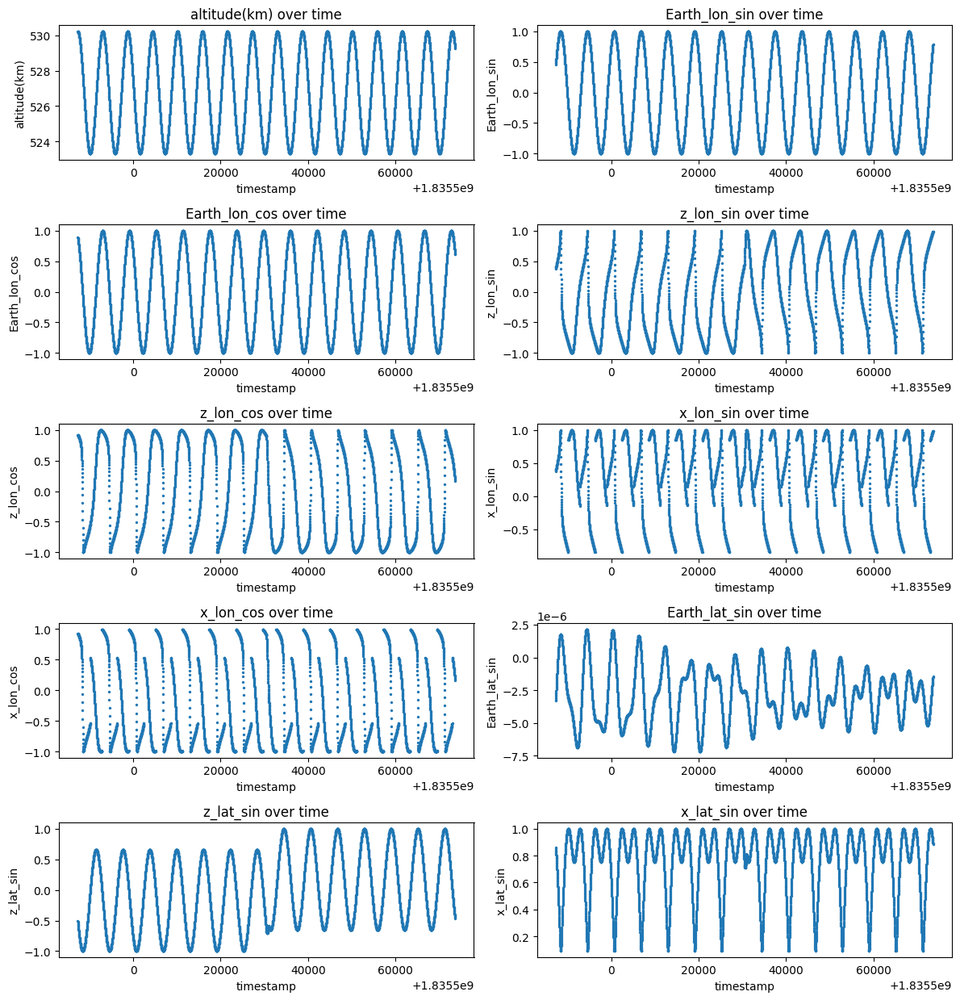

In [ ]:
viz_df_cols(satellite_data_15s_ang, n_rows=5, n_cols=2, cols_to_plot=input_features_ang)

> As we can see, now variables like `Earth_lon_sin/cos` show regular periodicity, a complete range [0, 1]

### Timestamps date

In [ ]:
satellite_data_original["timestamp"][0]

np.float64(1835487300.0)

In [ ]:
# Define desired time res. step
dt = 1  # seconds
n_rows = len(satellite_data_1s_ang)
# Build new timestamps starting at 13:00:00
start_time = pd.Timestamp("2025-01-01 00:00:00") # we choose this date
new_timestamps = start_time + pd.to_timedelta(np.arange(n_rows) * dt, unit="s")
# Assign back
satellite_data_1s_ang["timestamp"] = new_timestamps

# Define desired time res. step
dt = 15  # seconds
n_rows = len(satellite_data_15s_ang)
# Build new timestamps starting at 13:00:00
start_time = pd.Timestamp("2025-01-01 00:00:00") # we choose this date
new_timestamps = start_time + pd.to_timedelta(np.arange(n_rows) * dt, unit="s")
# Assign back
satellite_data_15s_ang["timestamp"] = new_timestamps

# Define desired time res. step
dt = 0.05  # seconds
n_rows = len(satellite_data_50ms_ang)
# Build new timestamps starting at 13:00:00
start_time = pd.Timestamp("2025-01-01 00:00:00") # we choose this date
new_timestamps = start_time + pd.to_timedelta(np.arange(n_rows) * dt, unit="s")
# Assign back
satellite_data_50ms_ang["timestamp"] = new_timestamps

### Visualizing a lightcurve

In [ ]:
def viz_lightcurve_all_dets(satellite_df, time_res, interval=(0, 150)):
    start, end = interval

    det_cols = [c for c in satellite_df.columns if c.startswith(target_count_str)]
    n_dets = len(det_cols)

    det_names = [
        "bgo_z1",
        "bgo_z0",
        "bgo_x1",
        "bgo_x0",
        "bgo_y1",
        "bgo_y0",
    ]

    assert n_dets == len(det_names), \
        f"Expected {len(det_names)} detectors, got {n_dets}"

    n_cols = 2
    n_rows = math.ceil(n_dets / n_cols)

    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(14, 3 * n_rows),
        sharex=True
    )
    axes = axes.flatten()

    t = satellite_df["timestamp"][start:end]

    for i, (col, det_name) in enumerate(zip(det_cols, det_names)):
        axes[i].step(t, satellite_df[col][start:end])
        axes[i].set_title(det_name)
        axes[i].tick_params(axis="x", labelsize=8)
        axes[i].set_ylabel("Photon counts")
        axes[i].grid(alpha=0.3)

    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    axes[-1].set_xlabel("Time")
    fig.suptitle(f"{time_res} binned light curves", fontsize=14)
    plt.tight_layout()
    plt.show()


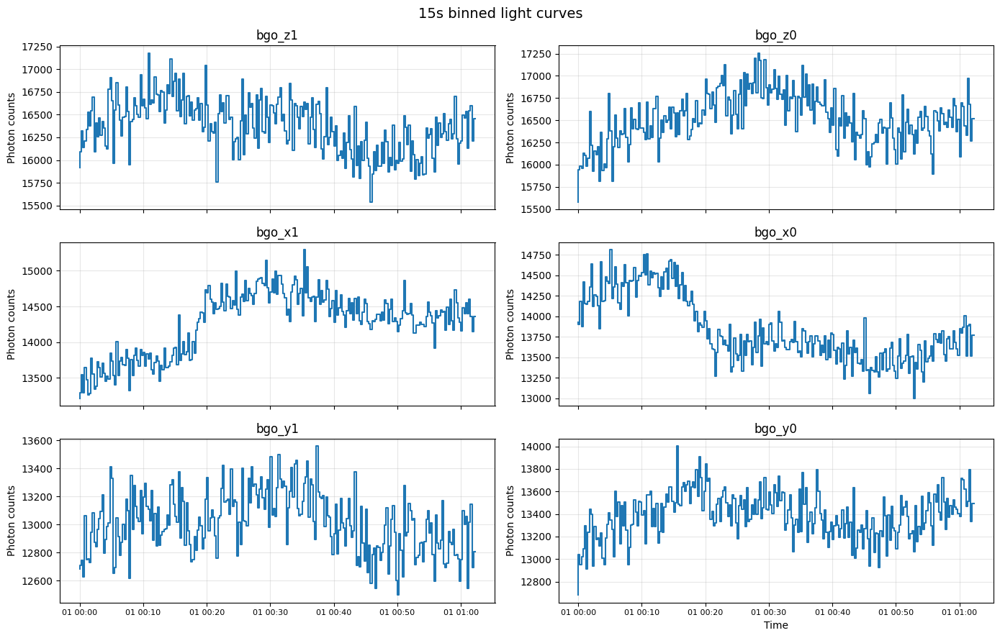

In [ ]:
viz_lightcurve_all_dets(satellite_data_15s_ang, "15s", interval=(0, 250))

<a name="countrates"></a>
### Visualizing count rates
Let's plot the count rates for each detector:

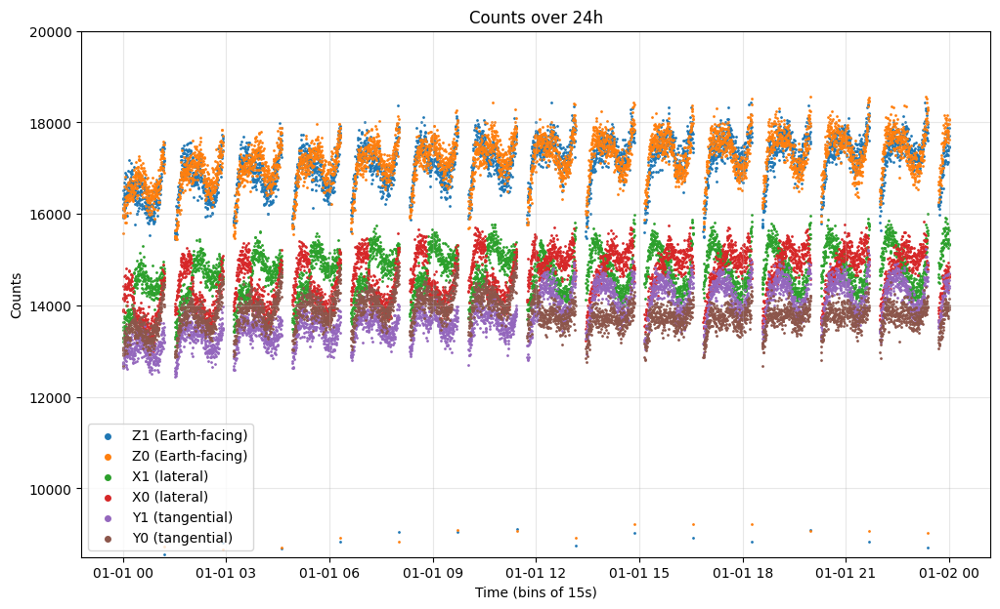

In [ ]:
viz_countrates(
    satellite_data_15s_ang,
    total_counts_15s,
    time_res=15,
    count_str="counts_det_",
    title="Counts over 24h",
    y_zoom=(8500, 20000)   # zoom sui conteggi “normali”
)


<a name="countrate_hm"></a>
##### Count rates **heatmap**
Let's visualize from a different *p.o.v.* how count rates vary over time for each detector.

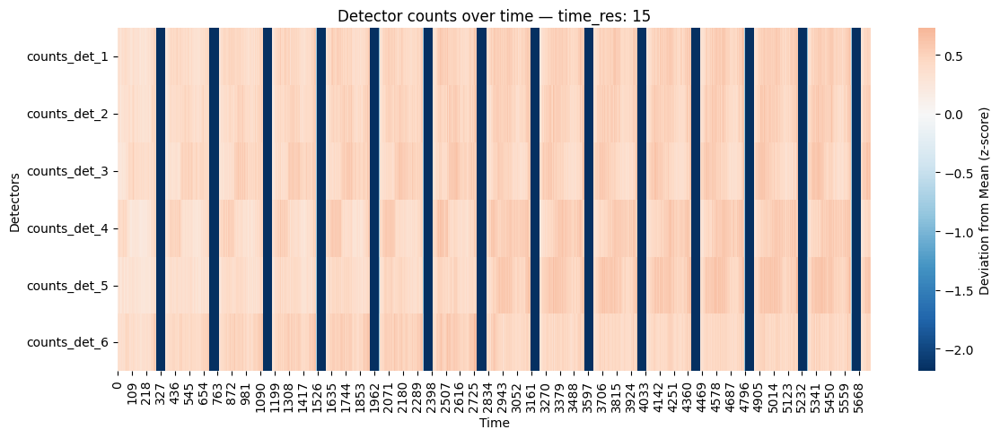

In [ ]:
viz_df_heatmap(satellite_data_15s,  target_count_str, time_res = "15")

> As we can see, the blanks between count rates in the previous plot correspond to values well below the mean, the **zeros**. Here, we can observe that the early values are slightly below the mean, while the subsequent ones are mostly above it.


> Why are the initial count rates lower than average? In the next section, we’ll find out.

<a name="zeropercissue"></a>
##### **Issue**: zero values percentage

> There are many zeros in our count rate columns. This can be also seen in the heatmap above. They are identical across all detectors, which explains some of the observed periodicity.

In [ ]:
zero_count_df_15s = (satellite_data_15s[[f"{target_count_str}{i+1}" for i in range(6)]] == 0).sum()
print(f"Percentage of zeros in each column: {zero_count_df_15s.iloc[0] / satellite_data_15s.shape[0]*100:.1f}%")

Percentage of zeros in each column: 17.1%


In [ ]:
zero_count_df_50ms = (satellite_data_50ms[[f"{target_count_str}{i+1}" for i in range(6)]] == 0).sum()
print(f"Percentage of zeros in each column: {zero_count_df_50ms.iloc[0] / satellite_data_50ms.shape[0]*100:.1f}%")

Percentage of zeros in each column: 17.3%


In [ ]:
zero_count_df_1s = (satellite_data_1s[[f"{target_count_str}{i+1}" for i in range(6)]] == 0).sum()
print(f"Percentage of zeros in each column: {zero_count_df_1s.iloc[0] / satellite_data_1s.shape[0]*100:.1f}%")

Percentage of zeros in each column: 17.3%


> Indeed, they account for approximately **17%** of each series—a non-negligible proportion.

### A series of **clarifications**

#### 1) Stabilization time
We will only consider data from the second half of the day, starting from the **13th hour**. This is because during the first 12 hours the satellite is still activating, and its emission has not yet reached full intensity.

This behavior can also be observed in the previous [plot](#countrate_hm), where the count rates appear to stabilize around the 13th hour.

Finally, we will convert the timestamp column into a DateTime object to better reflect this temporal structure.

In [ ]:
# Selecting the second half of the df
def splitting_data(satellite_df, time_res):
  rocking_time_idx = int(len(satellite_df) / 2)
  satellite_data = satellite_df[rocking_time_idx:].copy().reset_index(drop=True)
  return satellite_data, rocking_time_idx

In [ ]:
satellite_data_50ms_split, _ = splitting_data(satellite_data_50ms_ang, 0.05)
satellite_data_1s_split, _ = splitting_data(satellite_data_1s_ang, 1)
satellite_data_15s_split, rocking_time_idx = splitting_data(satellite_data_15s_ang, 15)
print(f"Shapes after splitting: {satellite_data_50ms_split.shape}, {satellite_data_1s_split.shape}, {satellite_data_15s_split.shape}")

satellite_data_50ms_split_raw, _ = splitting_data(satellite_data_50ms, 0.05)
satellite_data_1s_split_raw, _ = splitting_data(satellite_data_1s, 1)
satellite_data_15s_split_raw, rocking_time_idx = splitting_data(satellite_data_15s, 15)
print(f"Shapes after splitting: {satellite_data_50ms_split_raw.shape}, {satellite_data_1s_split_raw.shape}, {satellite_data_15s_split_raw.shape}")

Shapes after splitting: (864000, 17), (43200, 17), (2880, 17)
Shapes after splitting: (864000, 14), (43200, 14), (2880, 14)


In [ ]:
display(satellite_data_15s_split.head())

,timestamp,altitude(km),Earth_lon_sin,Earth_lon_cos,z_lon_sin,z_lon_cos,x_lon_sin,x_lon_cos,Earth_lat_sin,z_lat_sin,x_lat_sin,counts_det_1,counts_det_2,counts_det_3,counts_det_4,counts_det_5,counts_det_6
0,2025-01-01 12:00:00,523.598404,0.644155,0.764895,0.458714,0.888584,0.458714,0.888584,-0.000003,-0.671728,0.740798,18009.0,17741.0,14901.0,15124.0,14051.0,14364.0
1,2025-01-01 12:00:15,523.621089,0.655818,0.754919,0.494431,0.869217,0.494431,0.869217,-0.000003,-0.677178,0.735819,17777.0,17368.0,14634.0,15499.0,13952.0,14417.0
2,2025-01-01 12:00:30,523.644631,0.667326,0.744766,0.529122,0.848546,0.529122,0.848546,-0.000003,-0.682074,0.731283,17456.0,17150.0,14744.0,15008.0,14243.0,14327.0
3,2025-01-01 12:00:45,523.669025,0.678678,0.734436,0.562746,0.826630,0.562746,0.826630,-0.000003,-0.686424,0.727201,17316.0,17371.0,14418.0,15152.0,14024.0,13988.0
4,2025-01-01 12:01:00,523.694262,0.689869,0.723934,0.595265,0.803530,0.595265,0.803530,-0.000003,-0.690238,0.723583,17474.0,17347.0,15021.0,15068.0,13649.0,14220.0


###### Inspecting (again) feature distribution

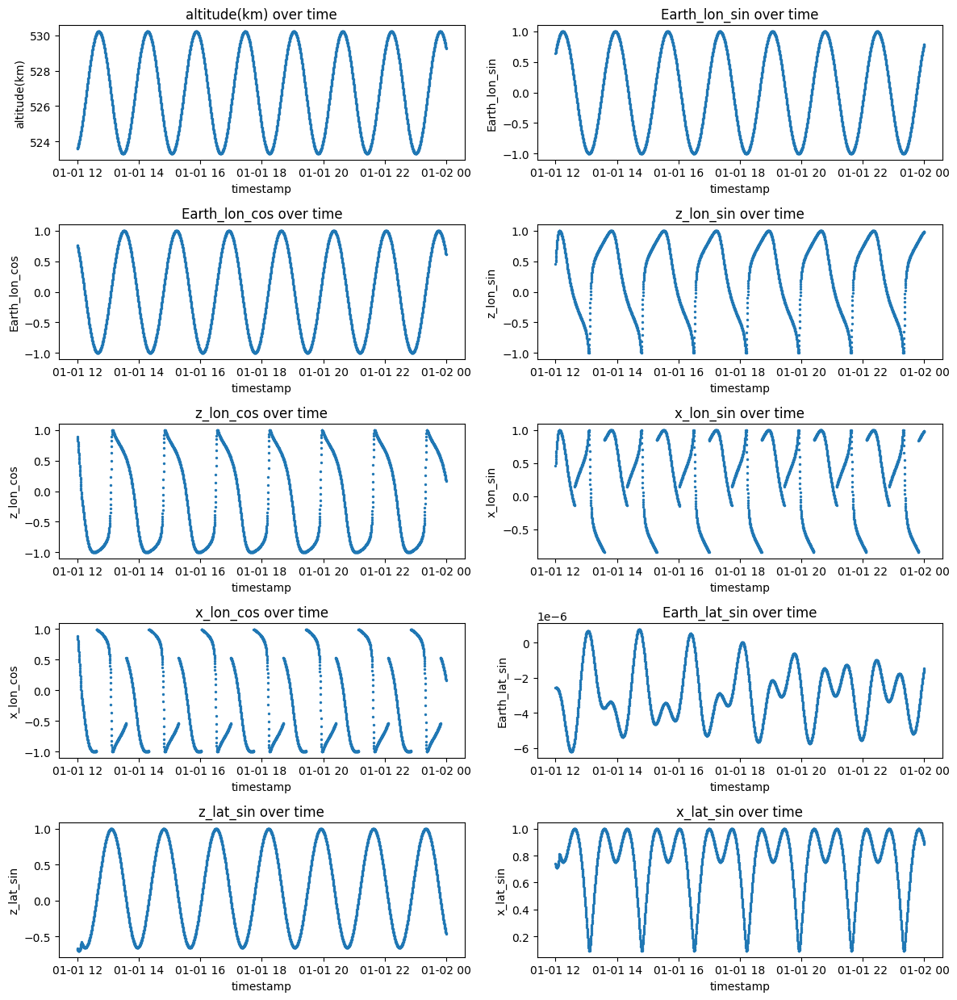

In [ ]:
'''# Get the list of columns to plot
cols_to_plot = satellite_data_original.columns.drop(['timestamp'])
n_cols_to_plot = len(cols_to_plot)
ncols = 2
nrows = 4

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, nrows * 2.5)) # Adjust figure height based on nrows

for i, feature_col in enumerate(cols_to_plot):
  row, col = divmod(i, ncols)  # Compute subplot position
  satellite_data_15s_split.plot.scatter(
        x='timestamp', y=feature_col, s=2, title=f'{feature_col} over time', ax=ax[row, col]
    )

# Hide any unused subplots
for i in range(n_cols_to_plot, nrows * ncols):
    row, col = divmod(i, ncols)
    fig.delaxes(ax[row, col])

plt.tight_layout()
plt.show()'''

viz_df_cols(satellite_data_15s_split, n_rows=5, n_cols=2, cols_to_plot=input_features_ang)

#### 2) Handling zero values

As spotted [before](#zeropercissue), the dataframe is plenty of zeros. But why is that?


<a name="saa"></a>
###### The South Atlantic Anomaly
> "The South Atlantic Anomaly (SAA) is an area where Earth's inner Van Allen radiation belt comes closest to Earth's surface, dipping down to an altitude of 200 kilometres (120 mi). This leads to an increased flux of energetic particles in this region and exposes orbiting satellites (including the ISS) to higher-than-usual levels of ionizing radiation."
>
> — [Wikipedia](https://en.wikipedia.org/wiki/South_Atlantic_Anomaly)

This means that the satellite is **off** while it transits the SAA. Indeed, the satellite gathers zero count rates in those temporal windows.

Because of that, we can safely delete those rows which contain zero values in their count rates columns.

In [ ]:
def remove_zeros(satellite_df):
  zeros_mask = (satellite_df[[f"{target_count_str}{i+1}" for i in range(6)]] == 0).any(axis=1)
  satellite_data_nozeros = satellite_df[~zeros_mask].copy()
  print(f"Number of rows deleted: {satellite_df[zeros_mask].shape[0]}")
  return satellite_data_nozeros

In [ ]:
satellite_data_50ms_nozeros = remove_zeros(satellite_data_50ms_split)
satellite_data_1s_nozeros = remove_zeros(satellite_data_1s_split)
satellite_data_15s_nozeros = remove_zeros(satellite_data_15s_split)

print()

satellite_data_50ms_nozeros_raw = remove_zeros(satellite_data_50ms_split_raw)
satellite_data_1s_nozeros_raw = remove_zeros(satellite_data_1s_split_raw)
satellite_data_15s_nozeros_raw = remove_zeros(satellite_data_15s_split_raw)

Number of rows deleted: 148495
Number of rows deleted: 7418
Number of rows deleted: 488

Number of rows deleted: 148495
Number of rows deleted: 7418
Number of rows deleted: 488


### **Statistical** analysis
A more insightful analysis of our orientation dataframe.

In [ ]:
from statsmodels.tsa.stattools import acf
from sklearn.decomposition import PCA
from scipy import stats

Creating a sub-dataframe with only satellite input features:

In [ ]:
satellite_data_input = satellite_data_15s_nozeros.copy().drop(columns=["timestamp"] + [f"{target_count_str}{i+1}" for i in range(6)])
display(satellite_data_input.head())

,altitude(km),Earth_lon_sin,Earth_lon_cos,z_lon_sin,z_lon_cos,x_lon_sin,x_lon_cos,Earth_lat_sin,z_lat_sin,x_lat_sin
0,523.598404,0.644155,0.764895,0.458714,0.888584,0.458714,0.888584,-0.000003,-0.671728,0.740798
1,523.621089,0.655818,0.754919,0.494431,0.869217,0.494431,0.869217,-0.000003,-0.677178,0.735819
2,523.644631,0.667326,0.744766,0.529122,0.848546,0.529122,0.848546,-0.000003,-0.682074,0.731283
3,523.669025,0.678678,0.734436,0.562746,0.826630,0.562746,0.826630,-0.000003,-0.686424,0.727201
4,523.694262,0.689869,0.723934,0.595265,0.803530,0.595265,0.803530,-0.000003,-0.690238,0.723583


In [ ]:
satellite_data_15s_nozeros.drop(["timestamp"], axis=1).describe()

,altitude(km),Earth_lon_sin,Earth_lon_cos,z_lon_sin,z_lon_cos,x_lon_sin,x_lon_cos,Earth_lat_sin,z_lat_sin,x_lat_sin,counts_det_1,counts_det_2,counts_det_3,counts_det_4,counts_det_5,counts_det_6
count,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2.392000e+03,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000
mean,527.187677,0.144790,-0.130237,0.225990,-0.377894,0.427887,-0.029080,-2.819881e-06,0.042626,0.784032,17278.978679,17326.298913,14793.005853,14824.805602,14164.948997,13700.938127
std,2.413470,0.689648,0.697755,0.631011,0.638973,0.515853,0.741825,1.643788e-06,0.566670,0.250043,810.486079,796.737244,712.401270,730.637875,660.960298,581.091523
min,523.323631,-0.999999,-1.000000,-0.999993,-1.000000,-0.844840,-1.000000,-6.206793e-06,-0.702409,0.091534,7766.000000,8033.000000,7155.000000,6731.000000,6613.000000,6429.000000
25%,524.849799,-0.468808,-0.792158,-0.349415,-0.937785,0.194055,-0.735967,-3.958783e-06,-0.494894,0.756313,17137.000000,17064.000000,14471.750000,14657.000000,13942.000000,13612.000000
50%,527.527643,0.272023,-0.256736,0.252999,-0.708002,0.504296,-0.015777,-2.936808e-06,-0.054725,0.864583,17391.000000,17430.500000,14801.500000,14951.000000,14242.500000,13757.000000
75%,529.569354,0.792596,0.534762,0.853125,0.265276,0.880380,0.779418,-1.708869e-06,0.522697,0.965635,17612.000000,17684.000000,15193.500000,15164.000000,14485.000000,13892.000000
max,530.223516,1.000000,1.000000,1.000000,0.999997,1.000000,0.989822,7.423588e-07,0.995802,1.000000,18446.000000,18573.000000,16009.000000,15838.000000,15234.000000,14506.000000


##### Inspecting again feature distribution

> Now we have a clearer and smoother visualization of the input feature distribution, after the data preprocessing.

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


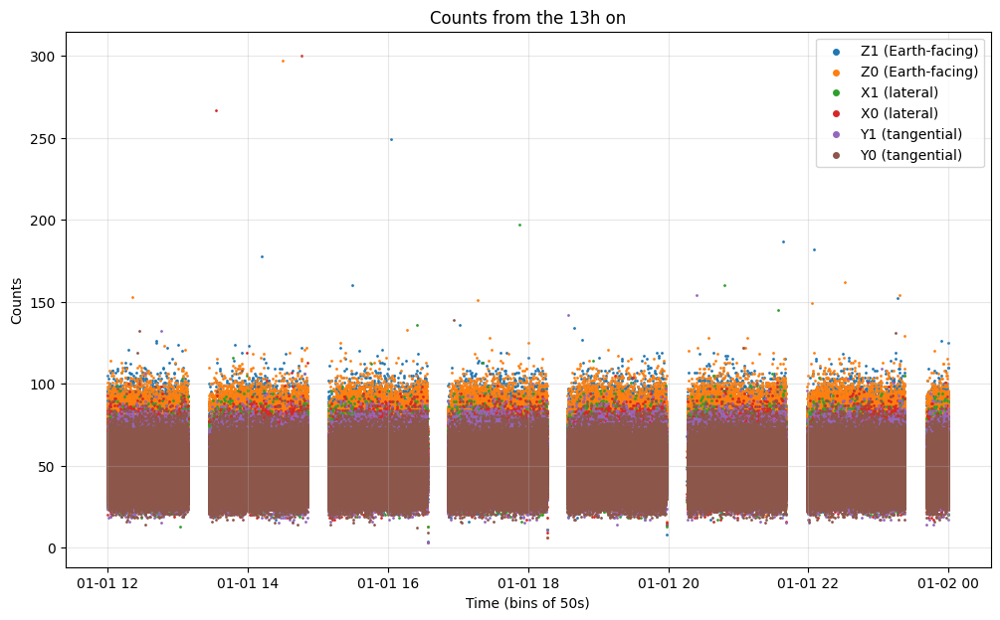

In [ ]:
viz_countrates(satellite_data_50ms_nozeros, total_counts_50ms,
               time_res="50", title="Counts from the 13h on",
               count_str=target_count_str, y_zoom=None)

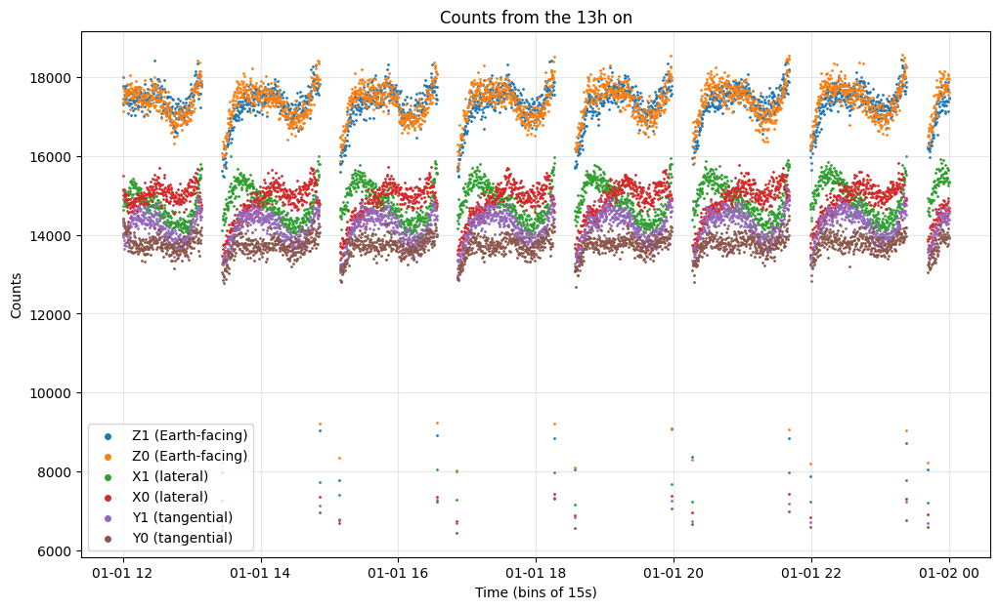

In [ ]:
viz_countrates(satellite_data_15s_nozeros, total_counts_15s,
               time_res="15", title="Counts from the 13h on",
               count_str=target_count_str, y_zoom=None)

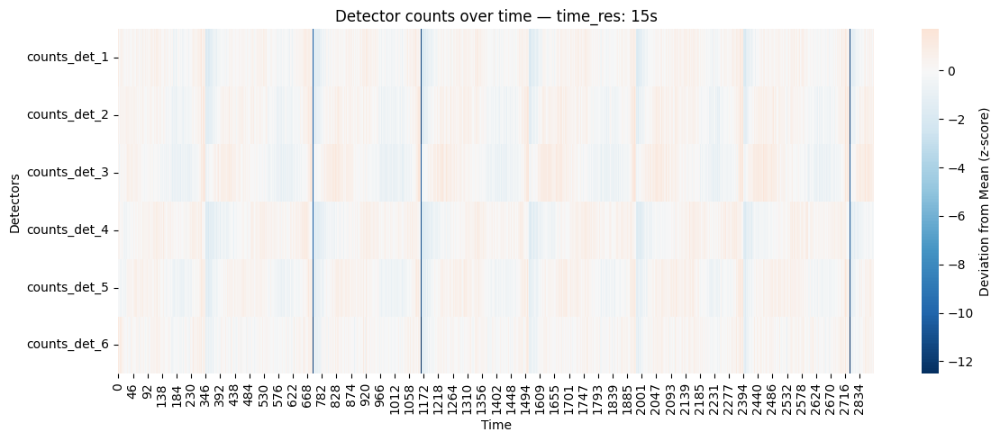

In [ ]:
viz_df_heatmap(satellite_data_15s_nozeros, target_count_str, time_res="15s")

#### Histograms
To check outliers and data skewness.

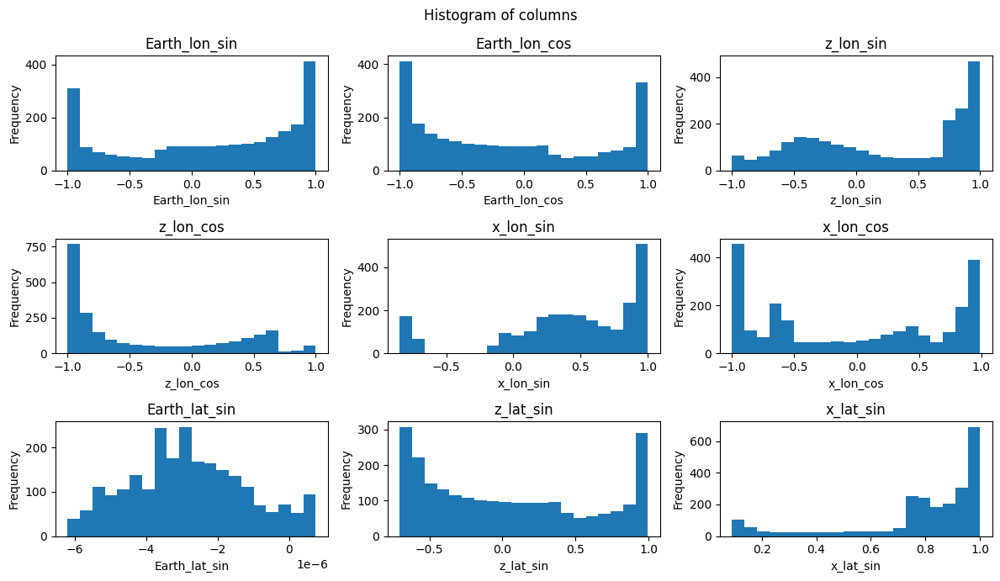

In [ ]:
viz_histograms(satellite_data_15s_nozeros[input_features_ang])

#### Boxplots
To check outliers, medians, etc.

Let's plot the input features boxplots:

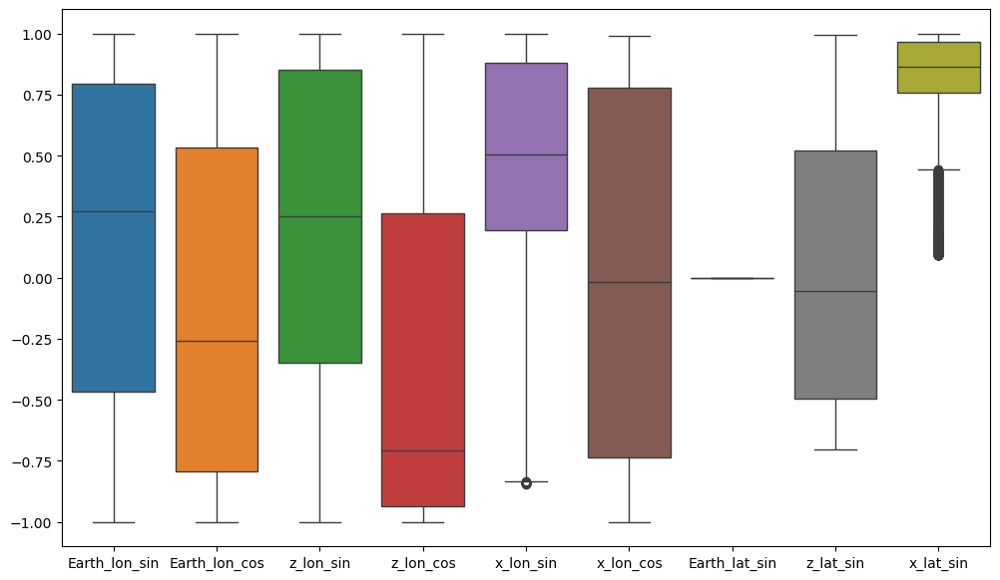

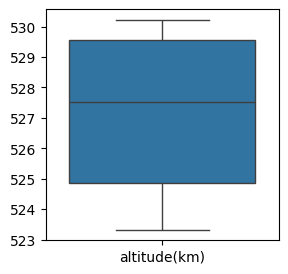

In [ ]:
plt.figure(figsize=(12, 7))
sns.boxplot(data=satellite_data_15s_nozeros[input_features_ang].drop(columns=["altitude(km)"]))
plt.show()

plt.figure(figsize=(3, 3))
sns.boxplot(data=satellite_data_15s_nozeros[["altitude(km)"]])
plt.show()

Now the count rates ones:

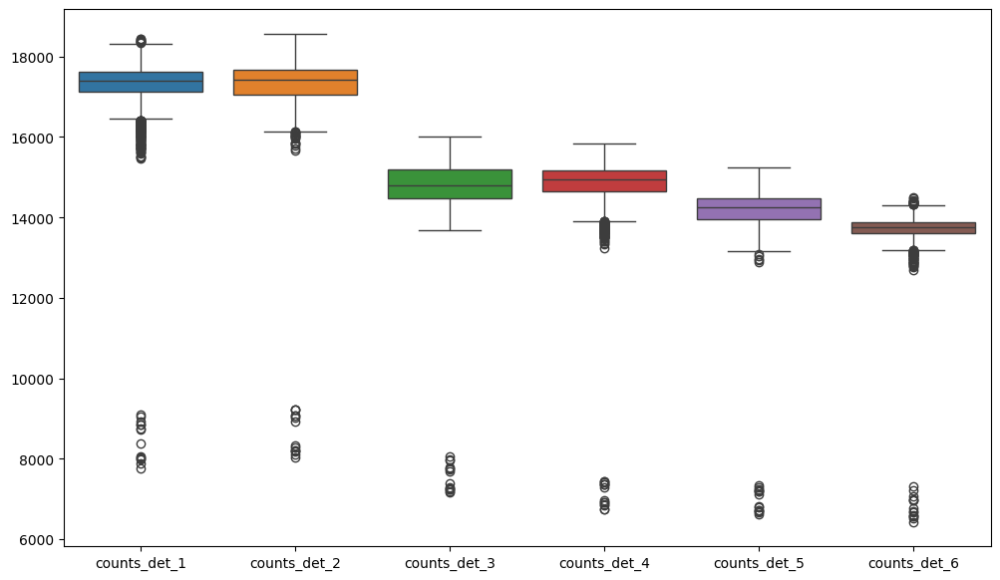

In [ ]:
plt.figure(figsize=(12, 7))
sns.boxplot(data=satellite_data_15s_nozeros[target_features])
plt.show()

> We notice a lot of **outliers** for our data! We decide to **remove** them because our aim is to just **fit the background**.
>
> Our data are strongly *left-skewed*.

##### Removing outliers
We will try to use three different types of methods: a Interquartile Range (or **IQR**) method, because our data are skewed (there is a long tail on the left), one that relies on the Median Absolute Deviation (MAD) and another one that just tries to remove tails relying on small quantiles.

In [ ]:
threshold_dict = {"15s": 0.4,
                  "1s" : 0.2,
                  "50ms": 0.8}

satellite_nozeros_dict = {
    "15s": satellite_data_15s_nozeros,
    "1s": satellite_data_1s_nozeros,
    "50ms": satellite_data_50ms_nozeros
}

satellite_nozeros_dict_raw = {
    "15s": satellite_data_15s_nozeros_raw,
    "1s": satellite_data_1s_nozeros_raw,
    "50ms": satellite_data_50ms_nozeros_raw
}

In [ ]:
def remove_outliers_quantiles(df):
  num_cols = df.select_dtypes(include=np.number).columns
  lower = df[num_cols].quantile(0.004)
  upper = df[num_cols].quantile(0.999)
  mask = ((df[num_cols] >= lower) & (df[num_cols] <= upper)).all(axis=1)
  df_filtered = df[mask]
  return df_filtered

In [ ]:
# Q tail filtering — removing the 0.5% of the distribution at its tails
satellite_data_15s_filter_q = remove_outliers_quantiles(satellite_data_15s_nozeros)
satellite_data_1s_filter_q = remove_outliers_quantiles(satellite_data_1s_nozeros)
satellite_data_50ms_filter_q = remove_outliers_quantiles(satellite_data_50ms_nozeros)
print(f"Q-tail — 15s, 1s, 50ms\nNumber of rows deleted: {satellite_data_15s_nozeros.shape[0] - satellite_data_15s_filter_q.shape[0]}")
print(f"Number of rows deleted: {satellite_data_1s_nozeros.shape[0] - satellite_data_1s_filter_q.shape[0]}")
print(f"Number of rows deleted: {satellite_data_50ms_nozeros.shape[0] - satellite_data_50ms_filter_q.shape[0]}")

satellite_data_15s_filter_q_raw = remove_outliers_quantiles(satellite_data_15s_nozeros_raw)
satellite_data_1s_filter_q_raw = remove_outliers_quantiles(satellite_data_1s_nozeros_raw)
satellite_data_50ms_filter_q_raw = remove_outliers_quantiles(satellite_data_50ms_nozeros_raw)


Q-tail — 15s, 1s, 50ms
Number of rows deleted: 140
Number of rows deleted: 2334
Number of rows deleted: 47279


In [ ]:
# Update the original dataframes with the modified ones
satellite_data_dict["15s"] = satellite_data_15s_filter_q
satellite_data_dict["1s"] = satellite_data_1s_filter_q
satellite_data_dict["50ms"] = satellite_data_50ms_filter_q

satellite_data_dict_raw["15s"] = satellite_data_15s_filter_q_raw
satellite_data_dict_raw["1s"] = satellite_data_1s_filter_q_raw
satellite_data_dict_raw["50ms"] = satellite_data_50ms_filter_q_raw

In [ ]:
satellite_data_dict_raw["15s"].head()

,timestamp,x_lat,x_lon,z_lat,z_lon,altitude(km),Earth_lat,Earth_lon,counts_det_1,counts_det_2,counts_det_3,counts_det_4,counts_det_5,counts_det_6
16,1.835531e+09,45.903161,62.854858,-44.096839,62.854858,524.060254,-0.000150,54.173245,17812.0,17836.0,14781.0,14884.0,13963.0,14210.0
17,1.835531e+09,46.129703,64.956479,-43.870297,64.956479,524.095763,-0.000151,55.052798,17368.0,17571.0,14800.0,14562.0,13866.0,13890.0
18,1.835531e+09,46.396840,67.043948,-43.603160,67.043948,524.132001,-0.000152,55.932365,17661.0,17643.0,14910.0,15010.0,14257.0,14085.0
19,1.835531e+09,46.704572,69.117265,-43.295428,69.117265,524.168957,-0.000152,56.811948,17605.0,17718.0,15102.0,14907.0,14131.0,14172.0
20,1.835531e+09,47.052899,71.176429,-42.947101,71.176429,524.206621,-0.000153,57.691545,17099.0,17528.0,15056.0,14335.0,13990.0,13601.0


In [ ]:
# Compare mean differences between original and filtered datasets
def comparing_means(df_dict_original, df_dict_filtered):
    for df_name in df_dict_original.keys():
        df_original = df_dict_original[df_name]
        df_filtered = df_dict_filtered[df_name]
        rates = df_original[target_features]  # detector columns

        pct_diffs = []  # store % difference per detector

        for det_r in rates:
            mean_orig = df_original[det_r].mean()
            mean_filt = df_filtered[det_r].mean()
            diff_pct = (mean_filt - mean_orig) / mean_orig * 100
            pct_diffs.append(diff_pct)

        avg_diff = np.mean(pct_diffs)
        print(f"Avg mean across detectors ({df_name}): {avg_diff:.3f}%")

# Run comparation
comparing_means(
    df_dict_original=satellite_nozeros_dict,
    df_dict_filtered=satellite_data_dict
)

Avg mean across detectors (15s): 0.234%
Avg mean across detectors (1s): 0.087%
Avg mean across detectors (50ms): 0.268%


In [ ]:
'''# Plot histograms
nrows = 3
ncols = 2
j = 0

for key in satellite_nozeros_dict.keys():
    df_nozeros = satellite_nozeros_dict[key]
    df_filtered = satellite_data_dict[key]

    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 7))
    fig.suptitle(f"Histogram of count rates — {key}", fontsize=14)

    # Columns to plot (same for all resolutions)
    cols_to_plot = df_nozeros.columns[8:]
    j += 1

    for i, col in enumerate(cols_to_plot):
        row, c = divmod(i, ncols)
        sns.histplot(df_nozeros[col], bins=50, kde=True, label='original', color='gray', ax=ax[row, c])
        sns.histplot(df_filtered[col], bins=50//j, kde=True, label='filtered', color='green', ax=ax[row, c])
        ax[row, c].set_title(col)
        ax[row, c].legend()

    plt.tight_layout()
    plt.show()'''


'# Plot histograms\nnrows = 3\nncols = 2\nj = 0\n\nfor key in satellite_nozeros_dict.keys():\n    df_nozeros = satellite_nozeros_dict[key]\n    df_filtered = satellite_data_dict[key]\n\n    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 7))\n    fig.suptitle(f"Histogram of count rates — {key}", fontsize=14)\n\n    # Columns to plot (same for all resolutions)\n    cols_to_plot = df_nozeros.columns[8:]\n    j += 1\n\n    for i, col in enumerate(cols_to_plot):\n        row, c = divmod(i, ncols)\n        sns.histplot(df_nozeros[col], bins=50, kde=True, label=\'original\', color=\'gray\', ax=ax[row, c])\n        sns.histplot(df_filtered[col], bins=50//j, kde=True, label=\'filtered\', color=\'green\', ax=ax[row, c])\n        ax[row, c].set_title(col)\n        ax[row, c].legend()\n\n    plt.tight_layout()\n    plt.show()'

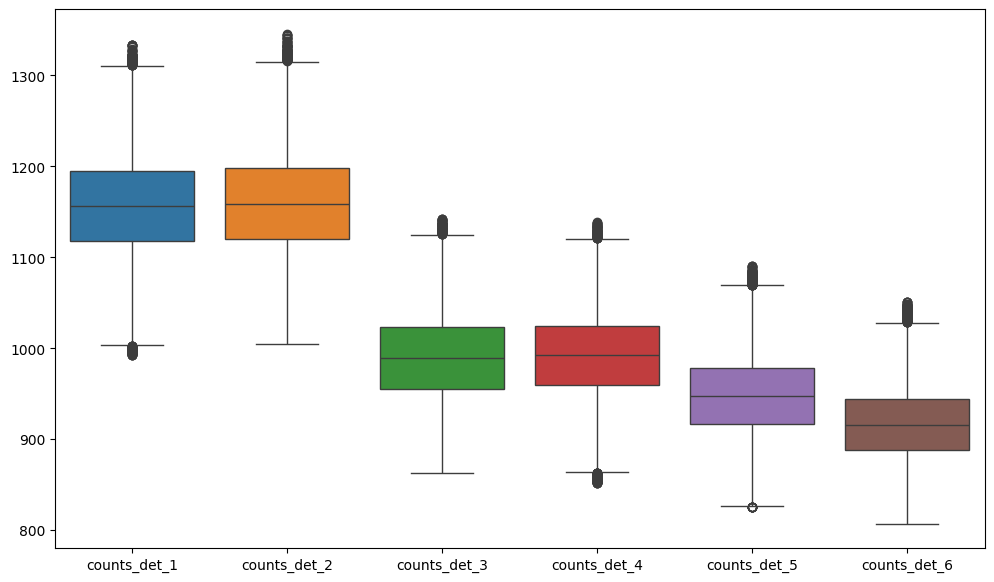

In [ ]:
plt.figure(figsize=(12, 7))
sns.boxplot(data=satellite_data_dict["1s"][target_features])
plt.show()

#### KDE plots
To see the shape of the underlying distributions. We will first inspect the ones of the satellite features, for each time-resolution dataframe.

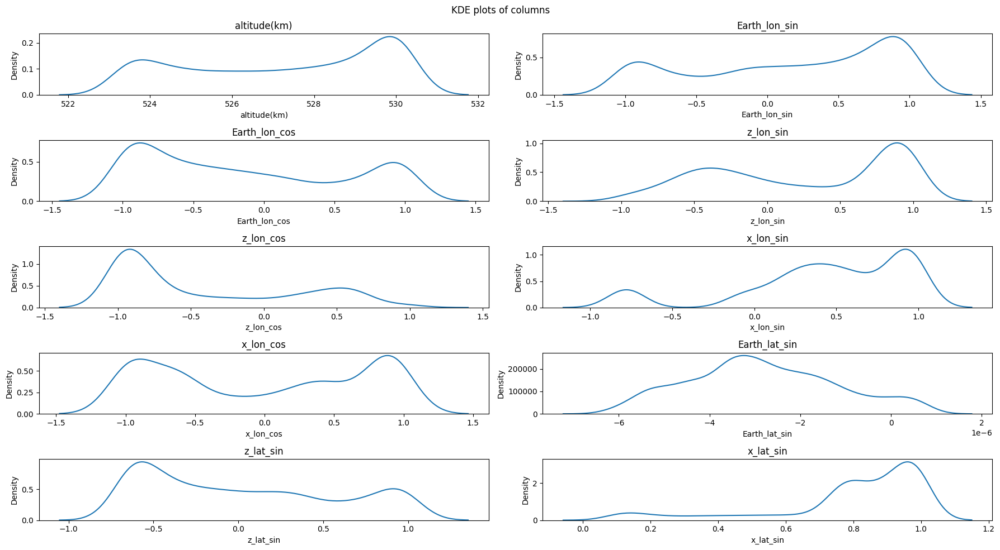

In [ ]:
viz_kdes(satellite_data_dict["15s"],
         cols_to_plot=input_features_ang,
         n_rows=5, n_cols=2)

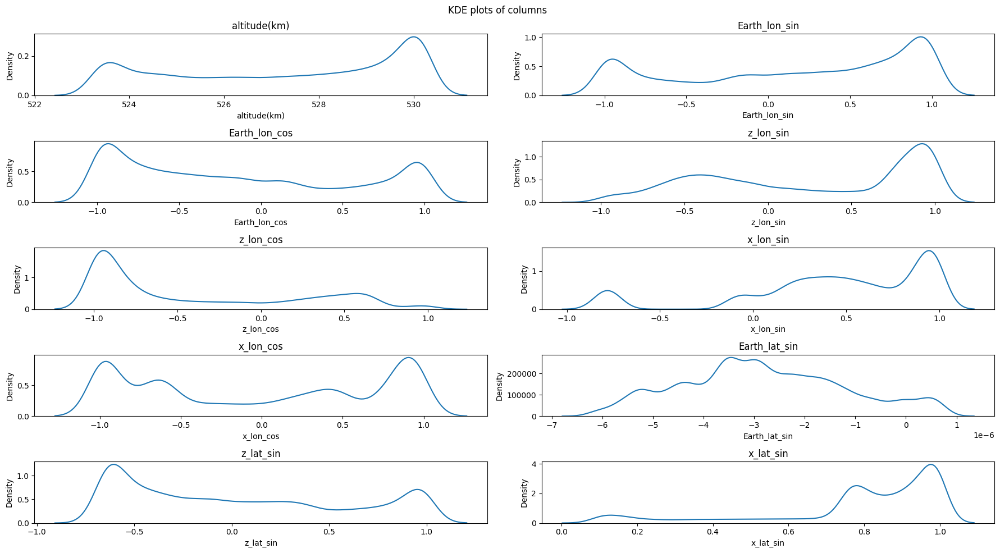

In [ ]:
viz_kdes(satellite_data_dict["1s"],
         cols_to_plot=input_features_ang,
         n_rows=5, n_cols=2)

<a name="countrate_distrib"></a>
#### Count rate **distribution**

Which is the probability distribution of our count rates?

> **Note**: we are referring to the ***per-bin*** distribution, not to the one for a time series!
>> This is because our ultimate [goal](#intro) is to predict the per-bin distribution of count rates and to check whether it matches with the true count rate dsitribution.

Theoretically, the underlying process of a counting experiment is a **Poisson**, because we count independent events over a fixed time interval.
Indeed, my physical model is:

$$C_t \sim P(\lambda_t)$$

where:

*   $C_t$ is the observed count in the 15s bin at time $t$
*   $\lambda_t$ is the expected number of photons in that bin
*   $\lambda_t$ depends on the inpute features (orbit, position, etc)

But, how can we infer the mean of a Poisson from only one draw? We cannot, and in reality, we are actually  predicting λ as a deterministic function of the system state. Namely, we just want to earn a mapping from features to expected counts. We predict the parameter (λ) that defines what the Poisson distribution would be if we were to sample from it.

$$P(C_t∣x_t​)=Poisson(f_θ​(x_t​))$$

For exploratory purposes, we will also inspect the count rates timeseries probability distribution twice:

1.   First, we will analyze them choosing a representative window that is the closest to the orbital mean count;

2.   Second, we will split our timeseries into ***windows*** of **500** **seconds**, in order to **avoid** the aforementioned **orbital trends**. This would be our distribution under interest because we want a **stationary** count rate that doesn't fluctuates due to factors like radiation belts (like [SAA](#saa)), Earth occultation, etc.

##### 1) Best window

In [ ]:
def choose_best_window(window_bins, satellite_data,
                           det_prefix=target_count_str,
                           n_dets=n_detectors):

    # Stack all detectors in [time, det]
    counts = np.stack([
        satellite_data[f"{det_prefix}{i+1}"].values
        for i in range(n_dets)
    ], axis=1)

    T = len(counts)
    best_start = 0
    min_score = np.inf

    for i in range(T - window_bins + 1):
        window = counts[i:i+window_bins, :]   # shape: (window_bins, n_dets)

        # mean and var per detector in this window
        mean_d = window.mean(axis=0)
        var_d  = window.var(axis=0)

        # avoid division by zero
        mean_d = np.where(mean_d == 0, 1e-9, mean_d)

        # dispersion index per detector
        phi_det = var_d / mean_d

        # window score = average phi across detectors
        score = np.mean(phi_det)

        if score < min_score:
            min_score = score
            best_start = i

    best_window = counts[best_start:best_start+window_bins, :]
    return best_start, best_window

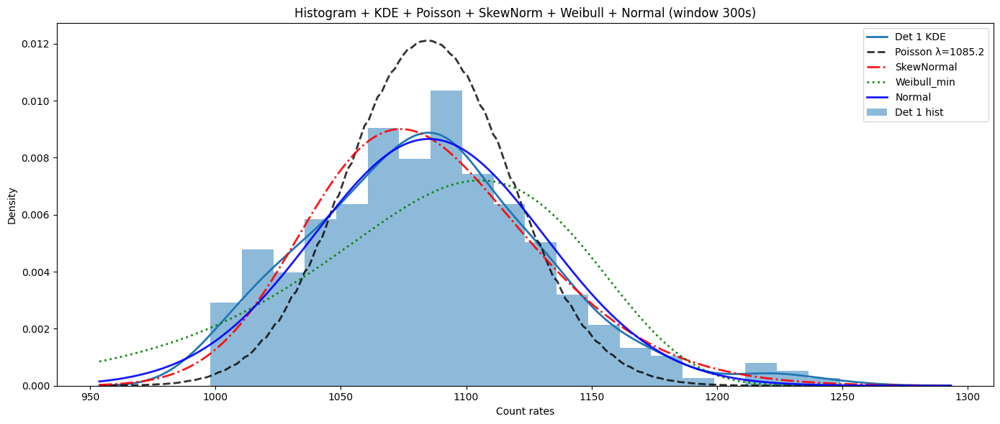

In [ ]:
from scipy.stats import poisson, skewnorm, weibull_min, norm

# Find window
bin_sec = 1
window_bins = int(300 / bin_sec)
best_start, best_window = choose_best_window(window_bins, satellite_data_dict["1s"])

plt.figure(figsize=(14, 6))

for i in range(1):   # plot detector 1
    data = best_window[:, i]
    lam = data.mean()

    # --------------------------
    # Histogram (density=True)
    # --------------------------
    ax = sns.histplot(
        data,
        bins=20,
        stat="density",
        kde=False,
        alpha=0.5,
        label=f"Det {i+1} hist",
        edgecolor=None
    )

    # --------------------------
    # KDE
    # --------------------------
    kde = sns.kdeplot(
        data,
        linewidth=2,
        label=f"Det {i+1} KDE"
    )

    # KDE x-grid
    x_kde = kde.get_lines()[-1].get_xdata()

    # --------------------------
    # 1. Poisson density
    # --------------------------
    x_vals = np.round(x_kde).astype(int)
    pmf = poisson.pmf(x_vals, lam)
    pmf_density = pmf / np.trapezoid(pmf, x_kde)

    plt.plot(
        x_kde,
        pmf_density,
        '--',
        linewidth=2,
        alpha=0.8,
        color="black",
        label=f"Poisson λ={lam:.1f}"
    )

    # --------------------------
    # 2. SkewNormal fit
    # --------------------------
    a_hat, loc_hat, scale_hat = skewnorm.fit(data)
    skew_pdf = skewnorm.pdf(x_kde, a=a_hat, loc=loc_hat, scale=scale_hat)

    plt.plot(
        x_kde,
        skew_pdf,
        '-.',
        linewidth=2,
        alpha=0.9,
        color="red",
        label="SkewNormal"
    )

    # --------------------------
    # 3. Weibull_min fit
    # --------------------------
    c_hat, loc_w, scale_w = weibull_min.fit(data, floc=0)
    weib_pdf = weibull_min.pdf(x_kde, c_hat, loc=loc_w, scale=scale_w)

    plt.plot(
        x_kde,
        weib_pdf,
        ':',
        linewidth=2,
        alpha=0.9,
        color="green",
        label="Weibull_min"
    )

    # --------------------------
    # 4. Normal (Gaussian) fit
    # --------------------------
    mu, sigma = data.mean(), data.std()
    norm_pdf = norm.pdf(x_kde, loc=mu, scale=sigma)

    plt.plot(
        x_kde,
        norm_pdf,
        '-',
        linewidth=2,
        alpha=0.9,
        color="blue",
        label="Normal"
    )

plt.xlabel("Count rates")
plt.ylabel("Density")
plt.title(f"Histogram + KDE + Poisson + SkewNorm + Weibull + Normal (window {window_bins}s)")
plt.legend()
plt.tight_layout()
plt.show()


##### 2) Consecutive windows
We will consider just one window per-detector, that will correspond to the same time range. The starting indices would be non-overlapping.

In [ ]:
def windowing_data(time_series, window_size):
    windows = []
    start = 0
    while start < len(time_series):
      windows.append(time_series[start:start+window_size])
      start += window_size
    return windows

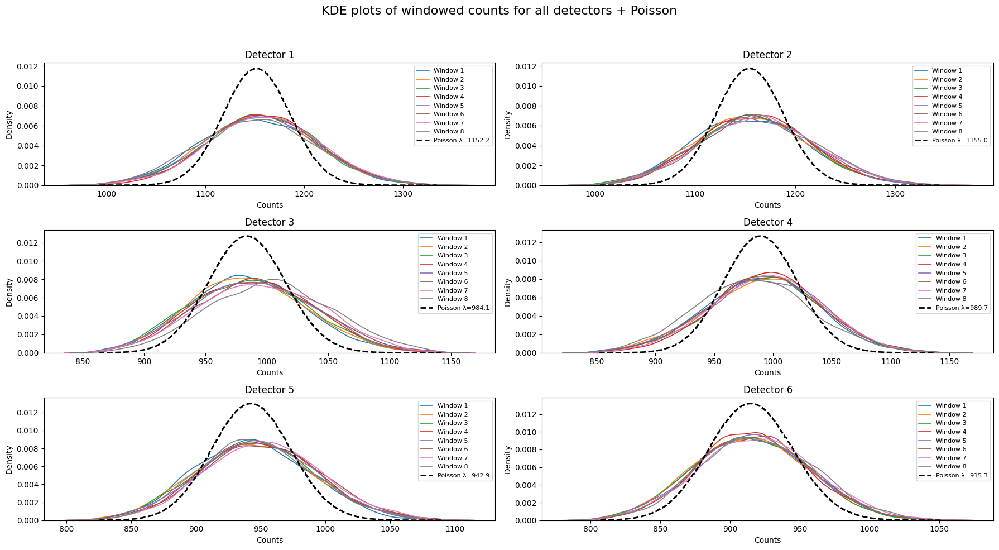

In [ ]:
window_size = 300*15
nrows, ncols = 3, 2
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 10))
fig.suptitle("KDE plots of windowed counts for all detectors + Poisson", fontsize=16)

for i in range(n_detectors):
    # Select counts for detector i
    data = satellite_data_dict["1s"][f"{target_count_str}{i+1}"]
    windows = windowing_data(data, window_size)

    row, col = divmod(i, ncols)
    axes = ax[row, col]

    # -----------------------------
    # KDE plots for all windows
    # -----------------------------
    for j, window in enumerate(windows):
        sns.kdeplot(window, label=f"Window {j+1}", ax=axes, lw=1.2)

    # -----------------------------
    # Add Poisson curve
    # -----------------------------
    # use mean of the first window (or choose any window you like)
    lam = np.mean(windows[0])

    # generate a smooth x-grid covering all KDEs
    x_min = min(w.min() for w in windows)
    x_max = max(w.max() for w in windows)
    x_grid = np.linspace(x_min, x_max, 500)

    # Poisson PMF converted to density
    pmf = poisson.pmf(np.round(x_grid).astype(int), lam)
    pmf_density = pmf / np.trapezoid(pmf, x_grid)   # normalize → same scale as KDE

    axes.plot(
        x_grid, pmf_density,
        '--', lw=2, color='black',
        label=f"Poisson λ={lam:.1f}"
    )

    # -----------------------------
    # Labels
    # -----------------------------
    axes.set_title(f"Detector {i+1}")
    axes.set_xlabel("Counts")
    axes.set_ylabel("Density")
    axes.legend(fontsize=8)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

> As expected, all the detectors share a **similar** distribution. We can find similarities comparing the above distributions with the "naive" count rates shown [here](#countrates).

> Which kind of distribution is this? Which one best fits our data? Let's find out in the following [section](#fit_distrib).

#### Correlation matrices

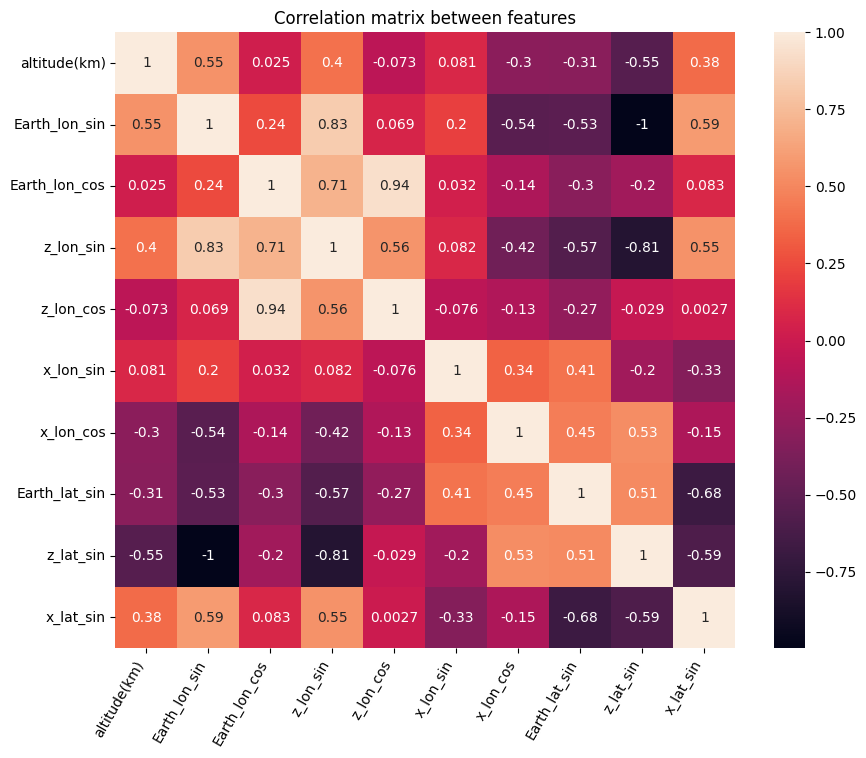

In [ ]:
satellite_data_input = satellite_data_dict["15s"][input_features_ang]

plt.figure(figsize=(10, 8))
sns.heatmap(satellite_data_input.corr(method="pearson"), annot=True)
plt.xticks(rotation=60, ha='right') # Rotate x-ticks by 45 degrees and align to the right
plt.title("Correlation matrix between features")
plt.show()

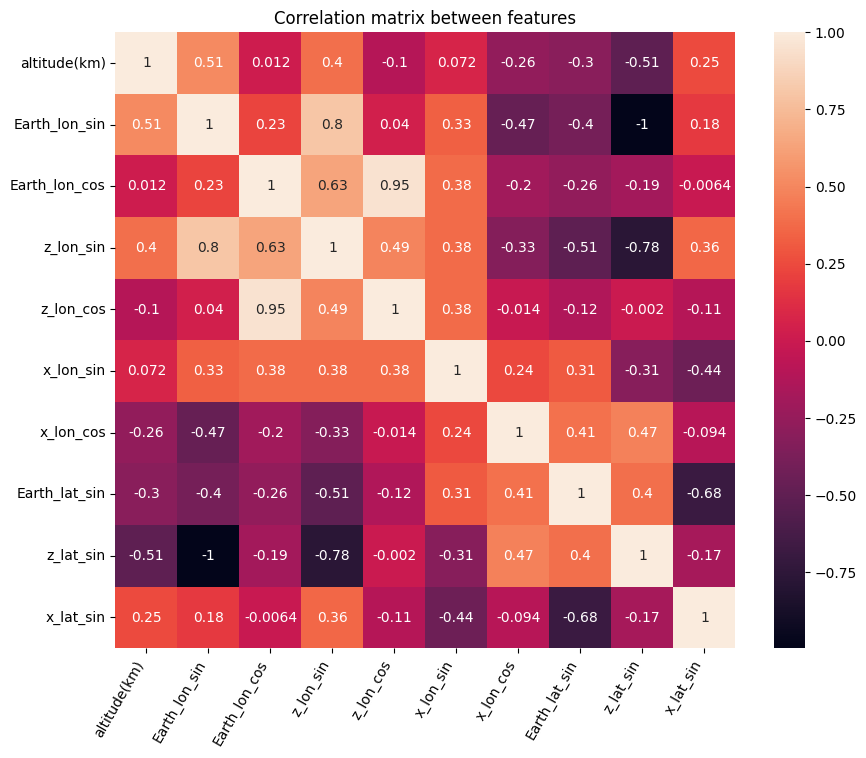

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(satellite_data_input.corr(method="spearman"), annot=True)
plt.xticks(rotation=60, ha='right') # Rotate x-ticks by 45 degrees and align to the right
plt.title("Correlation matrix between features")
plt.show()

Let's plot cross-correlation between detectors' count rates:

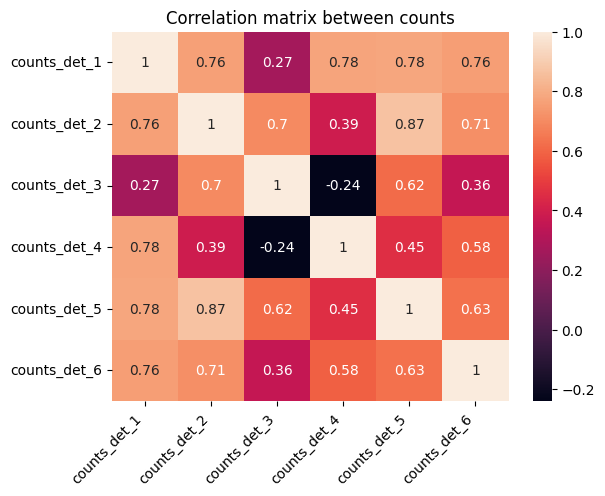

In [ ]:
corr_matrix = satellite_data_dict["15s"][[f"{target_count_str}{i+1}" for i in range(6)]].corr()
sns.heatmap(corr_matrix, annot=True)
plt.xticks(rotation=45, ha='right') # Rotate x-ticks by 45 degrees and align to the right
plt.title("Correlation matrix between counts")
plt.show()

> All detectors are responding almost identically over time. This means that all shows nearly identical temporal patterns. This reflects the identical periodicity showned before.

<a name="corr"></a>
##### Correlation matrix between input features and target features

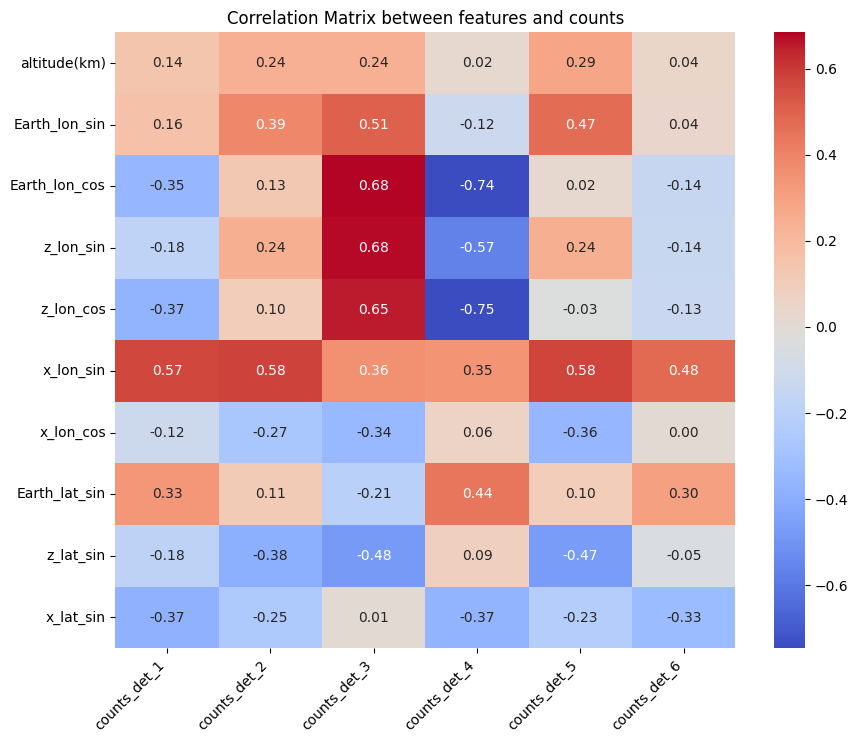

In [ ]:
# Concatenate the scaled input features and the count rates
satellite_data_input = satellite_data_dict["15s"].copy().drop(columns=["timestamp"] + [f"{target_count_str}{i+1}" for i in range(6)])
combined_data = pd.concat([satellite_data_input, satellite_data_dict["15s"][[f"{target_count_str}{i+1}" for i in range(6)]]], axis=1)

# Calculate the correlation matrix of the combined data
correlation_matrix_combined = combined_data.corr()

# Select the correlations between the scaled input features and the count rates
correlation_subset = correlation_matrix_combined.loc[satellite_data_input.columns, [f"{target_count_str}{i+1}" for i in range(6)]]

# Plot the heatmap of the correlation subset
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_subset, annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Correlation Matrix between features and counts")
plt.xticks(rotation=45, ha='right') # Rotate x-ticks by 45 degrees and align to the right
plt.show()

#### Autocorrelation plots
Autocorrelation measures how similar a time series is to a lagged version of itself, that is comparing the current data to previous ones, in the past, at different time steps (lags).

In [ ]:
def plot_autocorrelation(data, value, ax, max_lag=3000):
    # Autocorrelation plot on the given axes
    pd.plotting.autocorrelation_plot(data[value], ax=ax)
    # Customized x limits
    ax.set_xlim(0, max_lag)
    # Rotate x ticks using tick_params
    ax.tick_params(axis='x', rotation=45)
    ax.grid(':')
    ax.set_title(value)


def plot_multi_autocorrelation(data, value_prefix=target_count_str, tick_positions=[10], max_lag=100, figsize=(12, 7)):
    plt.figure(figsize=figsize)
    colors = ["red", "yellow", "green", "orange", "purple", "blue"]
    for i in range(6):
        col = f"{value_prefix}{i+1}"
        if col not in data.columns:
            print(f"⚠️ Column {col} not found, skipping.")
            continue
        pd.plotting.autocorrelation_plot(
            data[col],
            label=f"Detector {i}",
            color=colors[i % len(colors)]
        )
    plt.xlim(0, max_lag)
    plt.xticks(tick_positions, rotation=45)
    plt.title("Autocorrelation of Detector Counts")
    plt.grid(':')
    plt.legend()
    plt.tight_layout()
    plt.show()

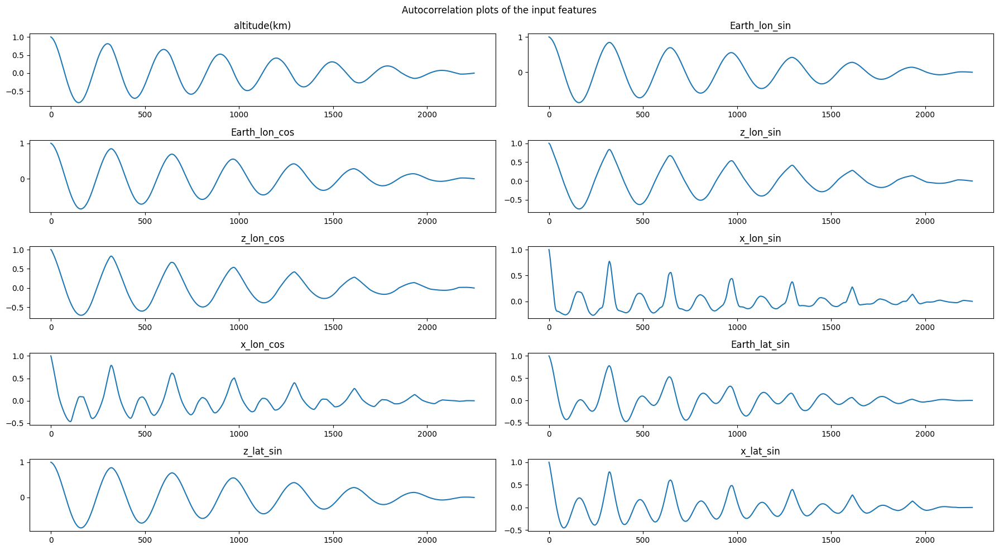

In [ ]:
viz_ac_plots(satellite_data_dict["15s"], cols_to_plot=input_features_ang, n_rows=5, n_cols=2)

In [ ]:
acf_values = acf(satellite_data_original["Earth_lon"], nlags=50000)
peaks, _ = find_peaks(acf_values, height=0.1)  # tune prominence to pick main peaks
lag_peaks = peaks
sample_dt = 15  # seconds per sample

periods_sec = np.diff(lag_peaks) * sample_dt
print("lag peaks:", lag_peaks)
print("periods (s):", periods_sec)
print("mean period (s):", periods_sec.mean())
print("mean period (min):", periods_sec.mean()/60.)
print("mean period (hours):", periods_sec.mean()/60/60.)

lag peaks: [ 409  819 1228 1637 2047 2456 2865 3274 3684 4093 4502 4912]
periods (s): [6150 6135 6135 6150 6135 6135 6135 6150 6135 6135 6150]
mean period (s): 6140.454545454545
mean period (min): 102.34090909090908
mean period (hours): 1.705681818181818


In [ ]:
# We will take det1 as reference detector, but all detectors share the same peaks
n_det = 1
satellite_data = satellite_data_dict["15s"]

acf_values = acf(satellite_data[f"{target_count_str}{n_det}"], nlags=50000)
peaks, _ = find_peaks(acf_values, prominence=0.04)  # tune prominence to pick main peaks
lag_peaks = peaks
sample_dt = 15  # seconds per sample

periods_sec = np.diff(lag_peaks) * sample_dt
print("lag peaks:", lag_peaks)
print("periods (s):", periods_sec)
print("mean period (s):", periods_sec.mean())
print("mean period (min):", periods_sec.mean()/60.)
print("mean period (hours):", periods_sec.mean()/60/60.)

lag peaks: [ 108  215  323  419  529  650  738  879  975 1083 1195 1294 1406 1614
 1721 1933]
periods (s): [1605 1620 1440 1650 1815 1320 2115 1440 1620 1680 1485 1680 3120 1605
 3180]
mean period (s): 1825.0
mean period (min): 30.416666666666668
mean period (hours): 0.5069444444444444


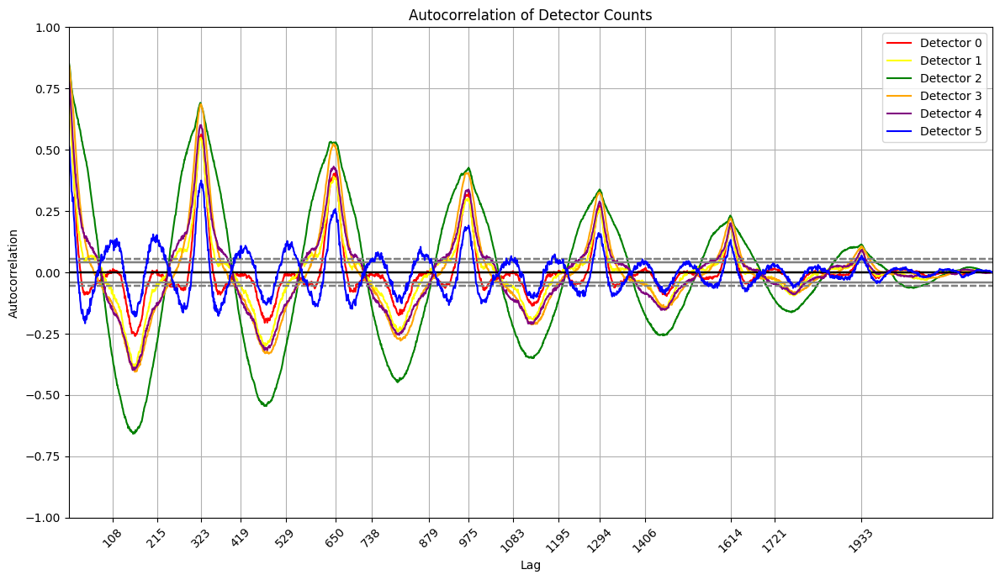

In [ ]:
plot_multi_autocorrelation(satellite_data, value_prefix=target_count_str, tick_positions=lag_peaks, max_lag=len(satellite_data), figsize=(12, 7))

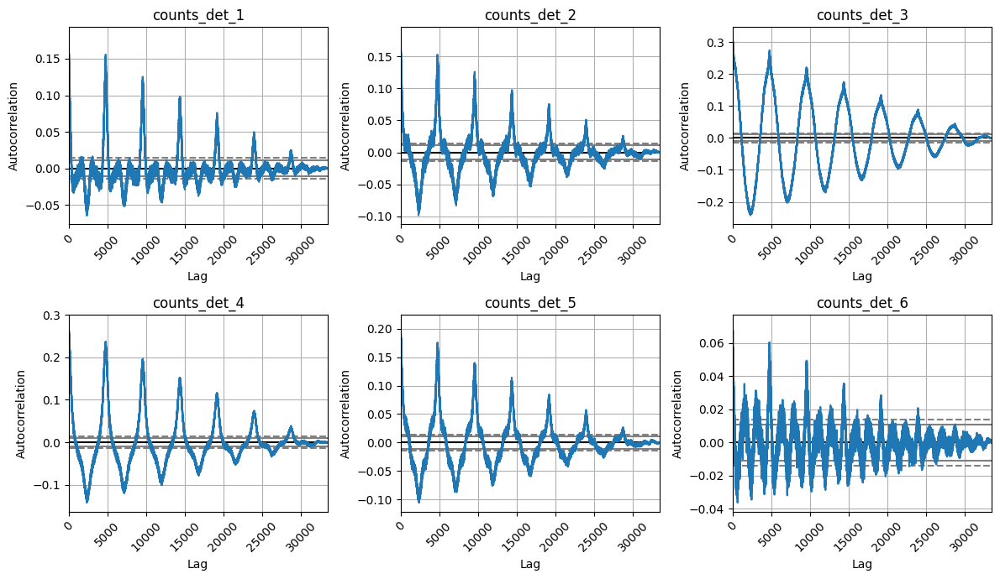

In [ ]:
nrows = 2
ncols = 3
satellite_data = satellite_data_dict["1s"]

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 7))
for i in range(6):
  row, col = divmod(i, ncols)
  plot_autocorrelation(satellite_data, value=f"{target_count_str}{i+1}", ax=ax[row, col], max_lag=len(satellite_data))
plt.tight_layout()
plt.show()

> All the detectors share the same correlation pattern. Indeed, there are peaks that are repeating at regular intervals, which suggest **periodicity**. We can also spot a temporal **decay**: the time series is still repeating, but each repetition is a little less similar to the original one.
>> Each peak happens every *296* lags, **~1.23** hours; negative peaks indicate an inverse relationship
>>> The decaying correlation, both positive and negative, means that the pattern decreases over time. This is due to damping or the fact that noise accumulates over time.

#### PCA analysis
We want to visualize the proportion of variance in the original data that is explained by each principal component. The values are ordered from the first principal component to the last.

In [ ]:
X = satellite_data_dict["15s"][[f"{target_count_str}{i+1}" for i in range(6)]]
pca = PCA()
pca.fit(X)
print(pca.explained_variance_ratio_)

[0.63884323 0.28421621 0.02777875 0.01875741 0.01712557 0.01327883]


> The output indicates that the first principal component explains almost 60%

#### Overdispersion

Detector 1: median φ = 2.211
Detector 2: median φ = 2.229
Detector 3: median φ = 1.622
Detector 4: median φ = 1.625
Detector 5: median φ = 1.664
Detector 6: median φ = 1.661



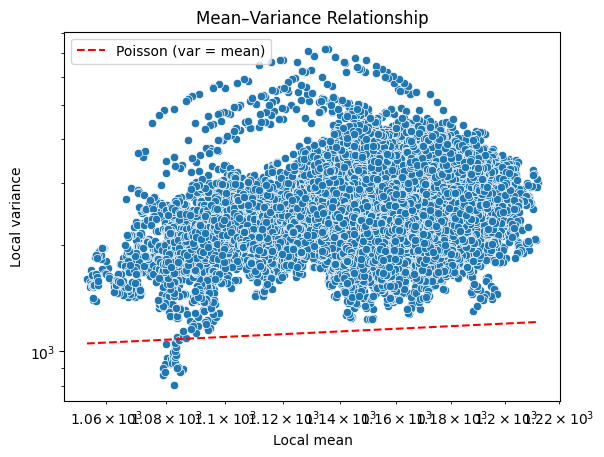

In [ ]:
satellite_data = satellite_data_dict["1s"]
bins = 50
n_det = 1

window_bins = int(150 / 1)  # 33 bins
best_start, best_window = choose_best_window(window_bins, satellite_data_dict["1s"])

for i in range(n_detectors):
    counts = satellite_data[f"{target_count_str}{i+1}"]
    # Rolling mean & variance
    mean_roll = counts.rolling(bins).mean()
    var_roll  = counts.rolling(bins).var()
    # Rolling dispersion index
    phi_roll = var_roll / mean_roll
    phi_det = phi_roll.median()
    print(f"Detector {i+1}: median φ = {phi_det:.3f}")
print()

# Each point is a local window of N bins
# - get local mean/var arrays
counts = satellite_data[f"{target_count_str}{n_det}"]
x = counts.rolling(bins).mean()
y = counts.rolling(bins).var()

# scatter
sns.scatterplot(x=x, y=y)

# diagonal Poisson line: y = x
m, M = np.nanmin(x), np.nanmax(x)
plt.plot([m, M], [m, M], 'r--', label='Poisson (var = mean)')

plt.xlabel("Local mean")
plt.ylabel("Local variance")
plt.title("Mean–Variance Relationship")
plt.xscale("log")
plt.yscale("log")
plt.hexbin(x, y, gridsize=50, cmap='viridis')
plt.legend()
plt.show()

> The observed variance is several times larger than the Poisson expectation, in particular around the average count.
>
> A plain Poisson regression will systematically underestimate uncertainty and produce biased λ estimates.
>
>> Larger windows blend distinct states and inflate variance.

<a name="fit_distrib"></a>
## Fitting Distributions
In order to train our probabilistic regressor, we have to first define the underlying probability distribution of our count rates, the ground truth of our background forecasting process.

As we have seen in the previous [subsection](#countrate_distrib), we will split our data in sequences of **300s** windows, to avoid orbital trends.

Now, we will proceed to try to fit different probability distributions to our data in order to find the one that fits the most.

1. We try to fit the Poisson distribution to each of our window, to see whether it can be a reasonable fit, according to our theoretical assumptions.

2. Then, we will fit several continuous distributions that essentially approximates

In [ ]:
from scipy import stats
'''
candidates = {
    "norm": stats.norm,
    "skew_norm": stats.skewnorm,
    "laplace": stats.laplace,
    "gamma": stats.gamma,
    "lognorm": stats.lognorm,
    "invgauss": stats.invgauss,
    "weibull": stats.weibull_min,
    "gumbel_l": stats.gumbel_l,
    "gev": stats.genextreme
}

bin_sec = 15
window_bins = int(300 / bin_sec)
best_start, best_window = choose_best_window(window_bins, satellite_data_dict["15s"])
w = best_window

for det_idx in range(w.shape[1]): # Iterate through detectors (columns of w)
    print(f"=== Detector {det_idx} ===")
    fits = {}
    detector_data = w[:, det_idx] # Select data for the current detector

    for name, dist in candidates.items():
        try:
            params = dist.fit(detector_data) # Fit to the 1D data
            loglik = np.sum(dist.logpdf(detector_data, *params))
            k = len(params)
            aic = 2 * k - 2 * loglik
            fits[name] = (params, aic)
        except Exception as e:
            print(f"  ⚠️ {name} fit failed on Detector {det_idx}: {e}")
            continue
    if fits:
        best = min(fits, key=lambda k: fits[k][1])
        params = [round(float(x), 1) for x in fits[best][0]]
        print(f"  Detector {det_idx} best = {best:10s} | AIC = {fits[best][1]:.1f} | params = {params}")
    else:
        print(f"  No distributions could be fitted for Detector {det_idx}")

    print()'''

'\ncandidates = {\n    "norm": stats.norm,\n    "skew_norm": stats.skewnorm,\n    "laplace": stats.laplace,\n    "gamma": stats.gamma,\n    "lognorm": stats.lognorm,\n    "invgauss": stats.invgauss,\n    "weibull": stats.weibull_min,\n    "gumbel_l": stats.gumbel_l,\n    "gev": stats.genextreme\n}\n\nbin_sec = 15\nwindow_bins = int(300 / bin_sec)\nbest_start, best_window = choose_best_window(window_bins, satellite_data_dict["15s"])\nw = best_window\n\nfor det_idx in range(w.shape[1]): # Iterate through detectors (columns of w)\n    print(f"=== Detector {det_idx} ===")\n    fits = {}\n    detector_data = w[:, det_idx] # Select data for the current detector\n\n    for name, dist in candidates.items():\n        try:\n            params = dist.fit(detector_data) # Fit to the 1D data\n            loglik = np.sum(dist.logpdf(detector_data, *params))\n            k = len(params)\n            aic = 2 * k - 2 * loglik\n            fits[name] = (params, aic)\n        except Exception as e:\n    

In [ ]:
'''bin_sec = 1
window_bins = int(300 / bin_sec)

# Select only detector columns
detector_cols = [c for c in satellite_data_dict["1s"].columns if "det" in c.lower()]
satellite_data_det = satellite_data_dict["1s"][detector_cols].astype(float)

# Build windows
windows = windowing_data(satellite_data_det, 500*15)

results = []

for win_idx, w in enumerate(windows):
    print(f"\n=== Window {win_idx + 1}/{len(windows)} ===")
    w = w.reset_index(drop=True)

    for det_idx, col in enumerate(w.columns):  # now we have exactly 6 detectors
        fits = {}
        detector_data = w[col].dropna().astype(float).values

        print(f"\n  --- {col} ---")

        if len(detector_data) == 0 or np.all(detector_data == detector_data[0]):
            print("    Skipped (empty or constant data)")
            continue

        for name, dist in candidates.items():
            try:
                params = dist.fit(detector_data)
                loglik = np.sum(dist.logpdf(detector_data, *params))
                k = len(params)
                aic = 2 * k - 2 * loglik
                fits[name] = (params, aic)
            except Exception as e:
                # suppress repetitive errors
                print(f"    ⚠️ {name} fit failed: {e}")
                continue

        if fits:
            best = min(fits, key=lambda k: fits[k][1])
            params = [round(float(x), 2) for x in fits[best][0]]
            print(f"    Best = {best:10s} | AIC = {fits[best][1]:.2f} | params = {params}")
            results.append({
                "window": win_idx,
                "detector": col,
                "best_dist": best,
                "aic": fits[best][1],
                "params": params
            })
        else:
            print(f"    ❌ No distributions could be fitted.")

results_df = pd.DataFrame(results)
print("\nSummary of best fits:")
print(results_df.head())'''

'bin_sec = 1\nwindow_bins = int(300 / bin_sec)\n\n# Select only detector columns\ndetector_cols = [c for c in satellite_data_dict["1s"].columns if "det" in c.lower()]\nsatellite_data_det = satellite_data_dict["1s"][detector_cols].astype(float)\n\n# Build windows\nwindows = windowing_data(satellite_data_det, 500*15)\n\nresults = []\n\nfor win_idx, w in enumerate(windows):\n    print(f"\n=== Window {win_idx + 1}/{len(windows)} ===")\n    w = w.reset_index(drop=True)\n\n    for det_idx, col in enumerate(w.columns):  # now we have exactly 6 detectors\n        fits = {}\n        detector_data = w[col].dropna().astype(float).values\n\n        print(f"\n  --- {col} ---")\n\n        if len(detector_data) == 0 or np.all(detector_data == detector_data[0]):\n            print("    Skipped (empty or constant data)")\n            continue\n\n        for name, dist in candidates.items():\n            try:\n                params = dist.fit(detector_data)\n                loglik = np.sum(dist.logpdf(

In [ ]:
'''# Count rate data
data = best_window[:, 2]

# Fit the skew-normal distribution to the data
params = stats.weibull_min.fit(data)

# Q-Q plot against skew-normal distribution with fitted parameters
stats.probplot(data, dist="weibull_min", sparams=params, plot=plt)
plt.title("Q–Q plot vs skew_norm distribution")
plt.show()'''

'# Count rate data\ndata = best_window[:, 2]\n\n# Fit the skew-normal distribution to the data\nparams = stats.weibull_min.fit(data)\n\n# Q-Q plot against skew-normal distribution with fitted parameters\nstats.probplot(data, dist="weibull_min", sparams=params, plot=plt)\nplt.title("Q–Q plot vs skew_norm distribution")\nplt.show()'

> Although the underlying physical process is expected to follow a Poisson distribution, it doesn't seems to behave like that. We will try to regress to different distributions, and we will see if the model will be able to capture the underlying background signal.

---



## Preparing to Regression
**Recall**: our goal is to predict the per-bin expected probability distribution of photon counts. The input features woud be the satellite metadata and the output would be a background distribution. The ground truths would be the raw count rates in the dataframe.

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from tf_keras.models import Sequential
from tf_keras.layers import Dense, Input, Conv1D, Activation, Dropout, LayerNormalization, Concatenate
from tf_keras.models import Model
import tensorflow_probability as tfp
import tensorflow as tf

tf.random.set_seed(42)
np.random.seed(42)

### Train-Val-Test split

In [ ]:
input_features = input_features_ang
target_features = [f"{target_count_str}{i+1}" for i in range(6)]

# select time res
df_res = "50ms"
satellite_data = satellite_data_dict[df_res]
#satellite_data = satellite_data_dict_raw[df_res]

# --- 1) Define contiguous test size ---
test_fraction = 0.15
viz_fraction = 0.20
n_total = len(satellite_data)
n_contig = int(n_total * test_fraction)
n_contig_viz = int(n_total * viz_fraction)

# --- 2) Extract contiguous test (LAST 10%) ---
X_test_contig = satellite_data[input_features].iloc[-n_contig:]
y_test_contig = satellite_data[target_features].iloc[-n_contig:]

# --- 2) Extract contiguous data for viz 50ms (LAST 15%)
X_test_viz = satellite_data[input_features].iloc[-n_contig_viz:]
y_test_viz = satellite_data[target_features].iloc[-n_contig_viz:]

# --- 3) Remove contiguous block from the dataset ---
X_remaining = satellite_data[input_features].iloc[:-n_contig]
y_remaining = satellite_data[target_features].iloc[:-n_contig]

# --- 4) IID split only on the remaining data ---
X_train, X_test, y_train, y_test = train_test_split(
    X_remaining,
    y_remaining,
    test_size=0.10,
    random_state=42,
    shuffle=True
)
print("X_train", X_train.shape)
print("X_test", X_test.shape)
print("X_test_contig", X_test_contig.shape)
print("y_test_contig", y_test_contig.shape)
print("y_train", y_train.shape)
print("y_test", y_test.shape)

X_train (511193, 10)
X_test (56800, 10)
X_test_contig (100233, 10)
y_test_contig (100233, 6)
y_train (511193, 6)
y_test (56800, 6)


### Normalizing input features
Crucial step in a Machine Learning process. In this case, it is even more important, since the metadata features lie in a excessively big scale (~$1e^{16}$).

In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

## **Probabilistic** Regression baselines

In [ ]:
def nll(y_true, dist):
    return -tf.reduce_mean(dist.log_prob(y_true))

In [ ]:
def custom_mae(y_true, y_pred):
    n_detectors = y_train.shape[1]
    mu = y_pred[:, :n_detectors]
    return tf.reduce_mean(tf.abs(y_true - mu))

In [ ]:
from tensorflow.keras.optimizers import AdamW

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=7e-3,
    decay_steps=200,
    decay_rate=0.95
)
optimizer = AdamW(learning_rate=lr_schedule, weight_decay=1e-4)

##### Deterministic Regressor

In [ ]:
def build_regressor(n_input_features, initial_units = 512,
                    flat = False, num_layers = 3,
                    n_detectors = 6):
  # Input
  input = Input(shape=(n_input_features,))
  x = input

  # Hidden
  hidden_units = []
  for i in range(num_layers):
      if not flat:
          # progressively smaller
          units = initial_units // (2**i)
      else:
          # flat tail logic: last = previous (only if >=3 layers)
          if num_layers >= 3 and i == num_layers - 1 and len(hidden_units) > 0:
              units = hidden_units[-1]  # repeat previous
          else:
              units = initial_units // (2**i)
      hidden_units.append(units)
      x = Dense(units, activation="relu")(x)

  output = Dense(n_detectors, activation = "linear")(x)

  regressor = Model(inputs=input, outputs=output)
  return regressor

#### Poisson Regressor
Let's start with a straightforward **dense** FFN.

In [ ]:
def build_poisson_regressor(n_input_features, initial_units = 512,
                            flat = False, num_layers = 3,
                            rate_guess = 1, mean_count=1000,
                            n_detectors = 6):
  # Input
  input = Input(shape=(n_input_features,))
  x = input

  # Hidden
  hidden_units = []
  for i in range(num_layers):
      if not flat:
          # progressively smaller
          units = initial_units // (2**i)
      else:
          # flat tail logic: last = previous (only if >=3 layers)
          if num_layers >= 3 and i == num_layers - 1 and len(hidden_units) > 0:
              units = hidden_units[-1]  # repeat previous
          else:
              units = initial_units // (2**i)
      hidden_units.append(units)
      x = Dense(units, activation="relu",
          kernel_regularizer=tf.keras.regularizers.l2(1e-2))(x)

  x = Dropout(0.5)(x)

  # Predict distribution parameters
  log_rate = Dense(n_detectors, activation = "linear",
                   bias_initializer=tf.keras.initializers.Constant(np.log(mean_count)))(x)

  # Create a lambda function and model output
  # - t is log_rate
  # - we predict the log of lambda because we want positive values
  # - then we recover back lambda exp. it
  lf = lambda t: tfp.distributions.Poisson(rate = tf.clip_by_value(rate_guess * tf.exp(t), 1e-3, 3e4))
  output = tfp.layers.DistributionLambda(lf)(log_rate) # model output = distribution

  regressor = Model(inputs=input, outputs=output)
  return regressor

#### Weibull Regressor

In [ ]:
def build_weibull_regressor(n_input_features,
                            initial_units=512,
                            flat=False,
                            num_layers=3,
                            mean_rate=1000,     # average rate in your data
                            n_detectors=6):
    """
    Weibull regressor analogous to the Poisson version.
    Predicts shape (k) and scale (lambda) for each detector.
    """

    # Input
    inputs = Input(shape=(n_input_features,))
    x = inputs

    # Hidden layers
    hidden_units = []
    for i in range(num_layers):
        if not flat:
            units = initial_units // (2 ** i)
        else:
            if num_layers >= 3 and i == num_layers - 1 and len(hidden_units) > 0:
                units = hidden_units[-1]
            else:
                units = initial_units // (2 ** i)
        hidden_units.append(units)
        x = Dense(units, activation="relu")(x)

    # Predict log parameters (for positivity)
    log_k = Dense(n_detectors, activation="linear",
                  bias_initializer=tf.keras.initializers.Constant(np.log(2.0)),
                  name="log_k")(x)        # shape (k)
    log_lambda = Dense(n_detectors, activation="linear",
                       bias_initializer=tf.keras.initializers.Constant(np.log(mean_rate)),
                       name="log_lambda")(x)  # scale (lambda)

    # Combine the two outputs
    params = tf.keras.layers.Concatenate(axis=-1)([log_k, log_lambda])

    # Define the distribution
    def make_weibull(t):
        log_k, log_lambda = tf.split(t, num_or_size_splits=2, axis=-1)
        k = tf.nn.softplus(log_k) + 1e-6         # ensure positive
        lam = tf.nn.softplus(log_lambda) + 1e-6  # ensure positive
        lam = tf.clip_by_value(lam, 1e-3, 3e5)   # prevent overflow

        return tfp.distributions.Independent(
            tfp.distributions.Weibull(concentration=k, scale=lam),
            reinterpreted_batch_ndims=1
        )

    output = tfp.layers.DistributionLambda(make_weibull)(params)

    regressor = Model(inputs=inputs, outputs=output)
    return regressor


#### Skew-Normal Regressor

In [ ]:
tfd = tfp.distributions

# Custom class definition
@tf.keras.utils.register_keras_serializable()
class SkewNormal(tfp.distributions.Distribution):
    def __init__(self, loc, scale, skewness, validate_args=False, allow_nan_stats=True, name="SkewNormal"):
        parameters = dict(locals())
        self._loc = tf.convert_to_tensor(loc, dtype=tf.float32)
        self._scale = tf.convert_to_tensor(scale, dtype=tf.float32)
        self._skewness = tf.convert_to_tensor(skewness, dtype=tf.float32)
        self.normal = tfd.Normal(loc=0.0, scale=1.0)  # Standard normal

        super(SkewNormal, self).__init__(
            dtype=tf.float32,
            reparameterization_type=tfd.NOT_REPARAMETERIZED,
            validate_args=validate_args,
            allow_nan_stats=allow_nan_stats,
            parameters=parameters,
            name=name.replace(" ", "_"),
        )

    # Keras serialization requires a get_config method
    def get_config(self):
        return {
            "loc": self._loc.numpy().tolist() if hasattr(self._loc, 'numpy') else self._loc,
            "scale": self._scale.numpy().tolist() if hasattr(self._scale, 'numpy') else self._scale,
            "skewness": self._skewness.numpy().tolist() if hasattr(self._skewness, 'numpy') else self._skewness,
            "validate_args": self.validate_args,
            "allow_nan_stats": self.allow_nan_stats,
            "name": self.name
        }

    @property
    def loc(self):
        return self._loc

    @property
    def scale(self):
        return self._scale

    @property
    def skewness(self):
        return self._skewness

    # Log-probability density function (PDF) of the Skew-Normal distribution.
    def _log_prob(self, value):
        z = (value - self.loc) / self.scale
        normal_log_prob = self.normal.log_prob(z)
        skew_factor = 2 * self.normal.cdf(self.skewness * z)

        # Ensure numerical stability
        skew_factor = tf.clip_by_value(skew_factor, 1e-6, 1.0)  # Avoid log(0)
        return normal_log_prob + tf.math.log(skew_factor) - tf.math.log(self.scale)

    # --- Mean ---
    def _mean(self):
        # δ = α / sqrt(1 + α²)
        delta = self.skewness / tf.sqrt(1.0 + tf.square(self.skewness))
        # E[X] = μ + σ * δ * sqrt(2/π)
        mean = self.loc + self.scale * delta * tf.sqrt(2.0 / tf.constant(3.141592653589793, dtype=tf.float32))
        return mean

    # --- Variance ---
    def _variance(self):
        delta = self.skewness / tf.sqrt(1.0 + tf.square(self.skewness))
        var = self.scale**2 * (1.0 - (2.0 * delta**2) / tf.constant(3.141592653589793, dtype=tf.float32))
        return var

    # --- Sampling (for completeness) ---
    def _sample_n(self, n, seed=None):
        # Sample from standard normal
        u0 = tf.random.normal(shape=(n,) + tf.shape(self.loc), seed=seed)
        v = tf.random.normal(shape=(n,) + tf.shape(self.loc), seed=seed)
        # Apply skew transformation
        delta = self.skewness / tf.sqrt(1.0 + tf.square(self.skewness))
        u1 = delta * tf.abs(u0) + tf.sqrt(1.0 - delta**2) * v
        return self.loc + self.scale * u1

def model_predict_fn(X, det_idx):
  # Predict parameters
  y_pred = model(X)
  n_detectors = y_pred.shape[1] // 3

  mu    = y_pred[:, :n_detectors]
  sigma = tf.nn.softplus(y_pred[:, n_detectors:2*n_detectors]) + 1e-3
  alpha = y_pred[:, 2*n_detectors:]

  # Build distribution
  sn_dist = SkewNormal(loc=mu, scale=sigma, skewness=alpha)

  # Return expected mean for your chosen detector
  return sn_dist.mean().numpy()[:, det_idx - 1]


# Negative Log-Likelihood for the Skew-Normal distribution.
def skew_normal_nll(y_true, y_pred):
    n_detectors = y_true.shape[-1]
    mu = y_pred[:, :n_detectors]
    sigma = y_pred[:, n_detectors:2*n_detectors]
    alpha = y_pred[:, 2*n_detectors:]

    sn = SkewNormal(loc=mu, scale=sigma, skewness=alpha)
    return -tf.reduce_mean(sn.log_prob(y_true))

def build_skewnorm_regressor(n_input_features, initial_units = 512,
                             flat = False, num_layers = 3,
                             n_detectors = 6):
  # Input
  input = Input(shape=(n_input_features,))
  x = input

  # Hidden
  hidden_units = []
  for i in range(num_layers):
      if not flat:
          # progressively smaller
          units = initial_units // (2**i)
      else:
          # flat tail logic: last = previous (only if >=3 layers)
          if num_layers >= 3 and i == num_layers - 1 and len(hidden_units) > 0:
              units = hidden_units[-1]  # repeat previous
          else:
              units = initial_units // (2**i)
      hidden_units.append(units)
      x = Dense(units, activation="relu")(x)

  # Predict distribution parameters
  mu = Dense(n_detectors, activation = "linear")(x)
  sigma = Dense(n_detectors, activation = "softplus")(x)
  alpha = Dense(n_detectors, activation = "linear")(x)

  output = Concatenate(axis=-1)([mu, sigma, alpha])

  regressor = Model(inputs=input, outputs=output)
  return regressor

#### Training

In [ ]:
from tf_keras.callbacks import EarlyStopping

callbacks = [
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
]

n_input_features = X_train_scaled.shape[1]

best_config_per_res = {
    "15s": {"units": 256, "num_hidden": 3, "batch_size": 2, "flat": True},
    "1s": {"units": 256, "num_hidden": 3, "batch_size": 16, "flat": True},
    "50ms": {"units": 128, "num_hidden": 2, "batch_size": 512, "flat": True},
    }


###### GridSearch

In [ ]:
from itertools import product

n_input_features = X_train_scaled.shape[1]
n_detectors = y_train.shape[1]

# Hyperparams
dense_params = {
    "units": [512, 256, 128],
    "num_hidden": [2, 3, 4],
    "batch_size": [4, 8],
    "flat": [True, False]
}

def gridsearch(models, dense_params):
    results_search = []

    for model in models:
        print(f"Training model: {model}")
        param_space = list(product(*dense_params.values()))
        param_keys = list(dense_params.keys())

        for param_tuple in param_space:
            param = {param_keys[i]: param_tuple[i] for i in range(len(param_tuple))}
            print(f"Parameter config: {param}")

            model = build_poisson_regressor(n_input_features=n_input_features,
                                            initial_units=param["units"],
                                            num_layers=param["num_hidden"],
                                            flat=param["flat"],
                                            n_detectors=n_detectors)

            model.compile(optimizer="adam",
                          loss=nll,
                          metrics = [custom_mae])

            history = model.fit(x=X_train_scaled, y=y_train,
                                validation_split=0.10,
                                epochs=200, batch_size=param["batch_size"],
                                callbacks=callbacks, verbose=0)

            val_loss = history.history['val_loss'][-1]
            val_mae = history.history['val_custom_mae'][-1]
            result = {**param, 'model': model, 'val_loss': val_loss,
                      "val_mae": val_mae}
            results_search.append(result)

    return results_search

In [ ]:
def select_best_config(results_search):
  df_results_search = pd.DataFrame(results_search)
  best_config_val_loss = df_results_search.loc[df_results_search['val_loss'].idxmin()]
  return best_config_val_loss

In [ ]:
#results_search = gridsearch(["dense_regressor"], dense_params)
#best_config = select_best_config(results_search)

#print(f"Best configuration:\n {best_config}")

In [ ]:
#best_config = select_best_config(results_search)
#print("Best configuration:")
#display(pd.DataFrame(best_config).drop(["model"]).T)

In [ ]:
#res_gs = pd.DataFrame(results_search)
#res_gs.to_csv("/content/drive/MyDrive/Colab Notebooks/Internship + Thesis/data/res_gs.csv", index=False)

In [ ]:
# for future runs
#best_config = {"units": 64, "num_hidden": 2, "batch_size": 4, "flat": False}

###### Training w best config

In [ ]:
skewnorm_regressor = build_skewnorm_regressor(
                          n_input_features = n_input_features,
                          initial_units = best_config_per_res[df_res]["units"],
                          num_layers = best_config_per_res[df_res]["num_hidden"],
                          n_detectors = n_detectors
                          )

skewnorm_regressor.compile(optimizer = "adam",
                           loss = skew_normal_nll,
                           metrics = [custom_mae])

history_sn = skewnorm_regressor.fit(x = X_train_scaled, y = y_train,
                                    validation_split = 0.15,
                                    epochs = 150, batch_size = best_config_per_res[df_res]["batch_size"],
                                    callbacks=callbacks, verbose=1)

Epoch 1/150
1369/1369 [==============================] - 13s 5ms/step - loss: 8293.9150 - custom_mae: 912.7459 - val_loss: 32.8417 - val_custom_mae: 782.4752
Epoch 2/150
1369/1369 [==============================] - 7s 5ms/step - loss: 19.6941 - custom_mae: 642.2505 - val_loss: 11.4394 - val_custom_mae: 499.0212
Epoch 3/150
1369/1369 [==============================] - 6s 5ms/step - loss: 9.2678 - custom_mae: 386.9447 - val_loss: 7.8329 - val_custom_mae: 300.2938
Epoch 4/150
1369/1369 [==============================] - 7s 5ms/step - loss: 7.2969 - custom_mae: 252.5946 - val_loss: 6.9852 - val_custom_mae: 211.5458
Epoch 5/150
1369/1369 [==============================] - 6s 5ms/step - loss: 6.8717 - custom_mae: 192.4784 - val_loss: 6.7899 - val_custom_mae: 173.3649
Epoch 6/150
1369/1369 [==============================] - 6s 5ms/step - loss: 6.7058 - custom_mae: 154.5782 - val_loss: 6.6403 - val_custom_mae: 135.1646
Epoch 7/150
1369/1369 [==============================] - 6s 5ms/step - loss

In [ ]:
'''poiss_regressor = build_poisson_regressor(n_input_features = n_input_features,
                                          initial_units = best_config["units"],
                                          num_layers = best_config["num_hidden"],
                                          flat = best_config["flat"],
                                          n_detectors = n_detectors)

def quasi_poisson_nll(y_true, dist, phi=2.5):
    return -tf.reduce_mean(dist.log_prob(y_true)) / phi

poiss_regressor.compile(optimizer = "adam",
                        loss = quasi_poisson_nll,
                        metrics = [custom_mae])

history_p = poiss_regressor.fit(x = X_train_scaled, y = y_train,
                                validation_split = 0.10,
                                epochs = 150, batch_size = best_config["batch_size"],
                                callbacks=callbacks, verbose=1)'''

In [ ]:
'''
weibull_regressor = build_weibull_regressor(n_input_features = n_input_features,
                                            initial_units = best_config["units"],
                                            num_layers = best_config["num_hidden"],
                                            flat = best_config["flat"],
                                            n_detectors = n_detectors)

weibull_regressor.compile(optimizer = "adam",
                          loss = nll,
                          metrics = [custom_mae])

history_w = weibull_regressor.fit(x = X_train_scaled, y = y_train,
                                  validation_split = 0.10,
                                  epochs = 150, batch_size = best_config["batch_size"],
                                  callbacks=callbacks, verbose=1)'''

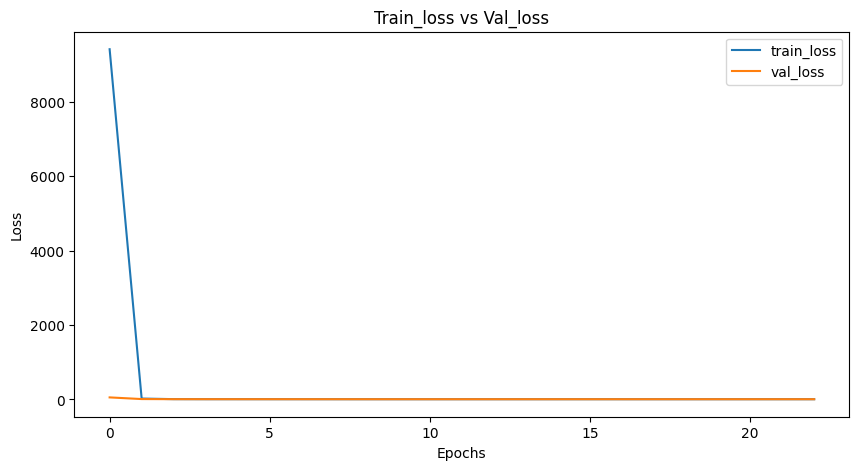

In [ ]:
history = history_sn.history
plt.figure(figsize=(10, 5))

plt.ylim = 20

plt.plot(history['loss'], label="train_loss")
plt.plot(history["val_loss"], label="val_loss")

plt.legend()
plt.title("Train_loss vs Val_loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

##### Evaluation

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [ ]:
# Choose model
model = skewnorm_regressor

# Make predictions
y_pred = model.predict(X_test_scaled)
y_pred = y_pred[:, :n_detectors]

# Number of detectors
n_detectors = y_train.shape[1]

rmse = np.sqrt(np.mean((y_test - y_pred)**2, axis=0))
mae = np.mean(np.abs(y_test - y_pred), axis=0)
r2 = r2_score(y_test, y_pred, multioutput='uniform_average')
perc_error = np.mean(np.abs(y_test - y_pred) / y_test)

print(f"R2 score: {r2}\n")
print(f"MAE per detector:\n{mae}\n")
print(f"RMSE per detector:\n{rmse}\n")
print(f"Percentage error: {perc_error*100:.2f}%")

1775/1775 ━━━━━━━━━━━━━━━━━━━━ 2s 840us/step
R2 score: 0.0036993722897022963

MAE per detector:
counts_det_1    9.126305
counts_det_2    9.107406
counts_det_3    7.139528
counts_det_4    7.218342
counts_det_5    7.137179
counts_det_6    6.981169
dtype: float64

RMSE per detector:
counts_det_1    11.374238
counts_det_2    11.377468
counts_det_3     8.921048
counts_det_4     9.025986
counts_det_5     8.917290
counts_det_6     8.744863
dtype: float64

Percentage error: 15.95%


> Angular feature encoding did not affect predictive accuracy (R², RMSE, MAE unchanged), while slightly reducing log-likelihood, likely due to the removal of spurious local fitting induced by angular wrap-around.

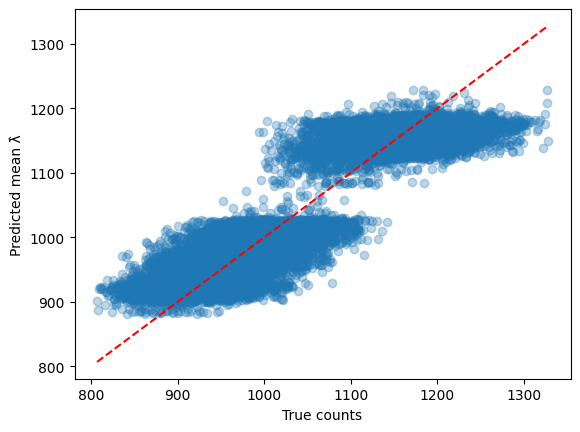

In [ ]:
mu = y_pred.flatten()
y = y_test.values.flatten()
plt.scatter(y, mu, alpha=0.3)
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--')
plt.xlabel("True counts")
plt.ylabel("Predicted mean λ̂")
plt.show()

> The plot above shows how well the predictions are aligned with the true counts, following the ideal red line where the two counts type are equal. In particular, there is also a small spread.

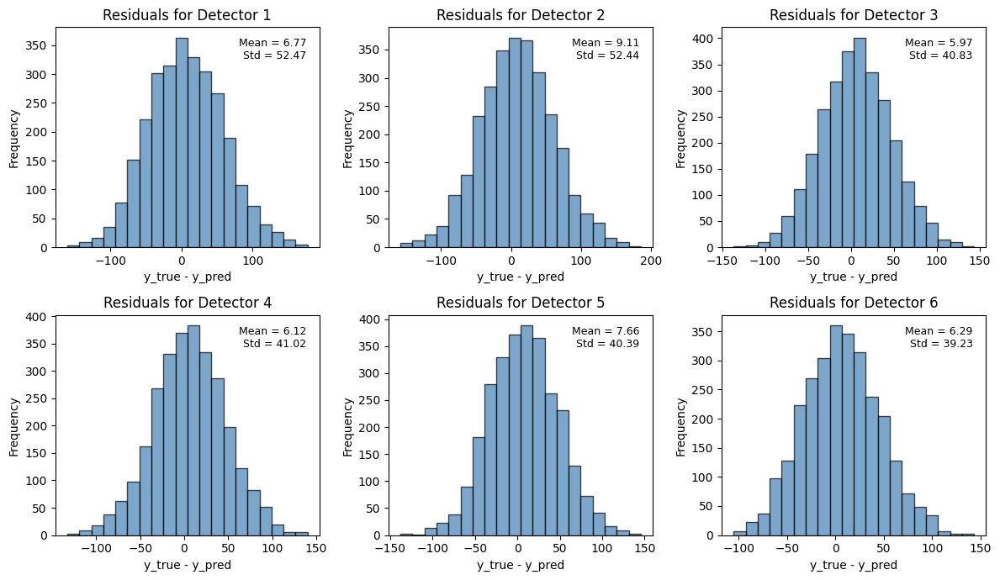

In [ ]:
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(12, 7))
residuals_per_det = []

for i, det_idx in enumerate(range(n_detectors)):
    residuals = y_test[f"{target_count_str}{det_idx+1}"].values - y_pred[:, det_idx]
    residuals_per_det.append(residuals)

    row, col = divmod(det_idx, 3)  # Compute subplot position (2x3 grid)
    ax[row, col].hist(residuals, bins=20, alpha=0.7, color='steelblue', edgecolor='black')
    ax[row, col].set_title(f"Residuals for Detector {det_idx+1}")
    ax[row, col].set_xlabel("y_true - y_pred")
    ax[row, col].set_ylabel("Frequency")

    # Compute stats
    mean_res = np.mean(residuals)
    std_res = np.std(residuals)

    # Add text box with mean and std
    textstr = f"Mean = {mean_res:.2f}\nStd = {std_res:.2f}"
    ax[row, col].text(
        0.95, 0.95, textstr,
        transform=ax[row, col].transAxes,
        fontsize=9,
        verticalalignment='top',
        horizontalalignment='right',
        bbox=dict(facecolor='white', alpha=0.7, edgecolor='none')
    )

plt.tight_layout()
plt.show()


> As we can see, the residuals approximately follow a roughly normal distribution centered around a positive number above 0. This indicates that the model is more than mildly accurate and **unbiased** (it doesn’t systematically over- or under-predict) and that its errors are randomly distributed, as expected for a well-fitted regression model. In other words, the predicted count rates closely match the true ones, with deviations that behave like natural random noise rather than structured bias.

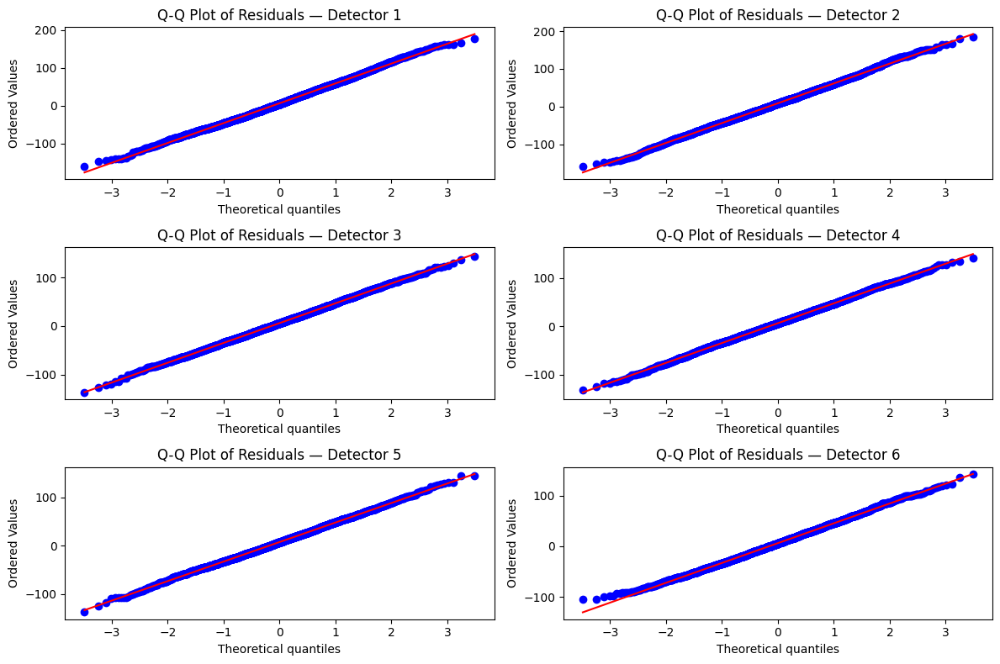

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(12, 8))

for det_idx in range(n_detectors):
  residuals = y_test[f"{target_count_str}{det_idx+1}"].values - y_pred[:, det_idx]
  row, col = divmod(det_idx, 2)
  stats.probplot(residuals, dist="norm", plot = ax[row, col])
  ax[row, col].set_title(f"Q-Q Plot of Residuals — Detector {det_idx+1}")

plt.tight_layout()
plt.show()

> The intuition above is confirmed by the Q-Q plot. All the residuals associated to different detectors approximately follow a normal distribution. This means that the predictions are **not biased**.

###### Plotting a test lightcurve


In [ ]:
bin_duration = 0.05 #s

Weibull / Poisson regressor

In [ ]:
window_size = len(X_test_contig[:2200]) # bins (~150 * 1s = 150s)
det_idx = 1
counts_col = f"{target_count_str}{det_idx}"
distrib = "Poisson"

# Extract contiguous test data
y_full = y_test_contig[counts_col].values
X_full = X_test_contig[input_features]

# Scale using the SAME scaler fitted on training data
X_full_scaled = scaler.transform(X_full)

# Sliding-window evaluation
mae_list, rmse_list = [], []
window_indices = range(0, len(y_full) - window_size + 1, window_size)

for start in window_indices:
    end = start + window_size

    X_window = X_full_scaled[start:end]
    y_window = y_full[start:end]

    # Predict [WRONG!!! >:( ]
    #y_pred_w = model.predict(X_window)
    #y_pred_det = y_pred_w[:, det_idx-1]

    # Predict
    # - mean
    y_pred_dist = model(X_window)
    y_pred_mean = y_pred_dist.mean().numpy()
    y_pred_det = y_pred_mean[:, det_idx-1]
    # - std
    std = y_pred_dist.stddev().numpy()[:, det_idx-1]

    # Metrics
    mae = mean_absolute_error(y_window, y_pred_det)
    rmse = np.sqrt(mean_squared_error(y_window, y_pred_det))
    mae_list.append(mae)
    rmse_list.append(rmse)

    # Plot every N
    N = 1
    if start % (window_size * N) == 0:
      plt.figure(figsize=(15, 4))
      bins = np.arange(start, end) * bin_duration

      # True counts
      plt.step(bins, y_window, where="mid", label="True counts",
              linewidth=1.5, color="steelblue")

      # Predicted counts
      plt.step(bins, y_pred_det, where="mid", label="Predicted mean",
              linewidth=1.8, linestyle="--", color="darkorange")

      # Draw band
      k = 1
      lower = y_pred_det - k * std
      upper = y_pred_det + k * std

      plt.fill_between(
          bins,
          lower,
          upper ,
          color="orange",
          alpha=0.3,
          label=f"±{k}σ predicted uncertainty",
          zorder=3
      )

      # Count how many true points are inside [lower, upper]
      inside = (y_window >= lower) & (y_window <= upper)
      coverage = 100 * np.mean(inside)
      print(f"Fraction of true counts within ±{k}σ band: {coverage:.2f}%")

      # Label
      plt.title(
            f"{distrib} Regressor\n "
            f"Detector {det_idx} — Whole Contiguous Test Window {start // window_size + 1} "
            f"(bins {start}-{end})\n"f"MAE={mae:.2f}, RMSE={rmse:.2f}, "
            f"Coverage={coverage:.1f}%"
        )

      plt.xlabel("Time (bins)")
      plt.ylabel("Counts")
      plt.legend()
      plt.grid(alpha=0.3, linestyle=":")
      plt.tight_layout()
      plt.show()

Plotting for skew norm

In [ ]:
SIGMA_TO_QUANTILES = {
    1: (0.1587, 0.8413),
    2: (0.0228, 0.9772),
    3: (0.00135, 0.99865),
    4: (3.17e-5, 0.9999683),
    5: (2.87e-7, 0.999999713),
}

model = skewnorm_regressor

- 1s

detector: bgo_z1
4830
Fraction of true counts within ±1σ band: 99.86%


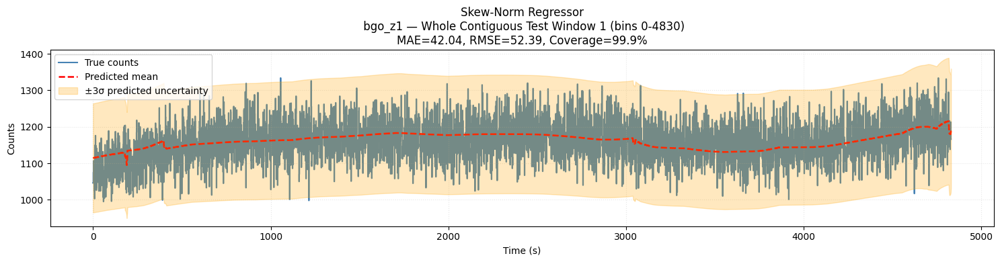

detector: bgo_z0
4830
Fraction of true counts within ±1σ band: 99.69%


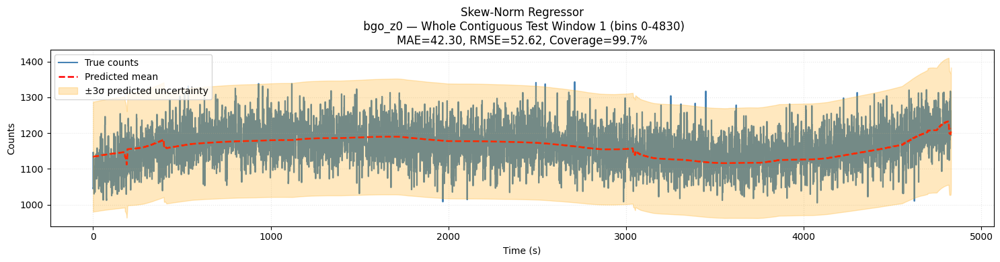

detector: bgo_x1
4830
Fraction of true counts within ±1σ band: 99.92%


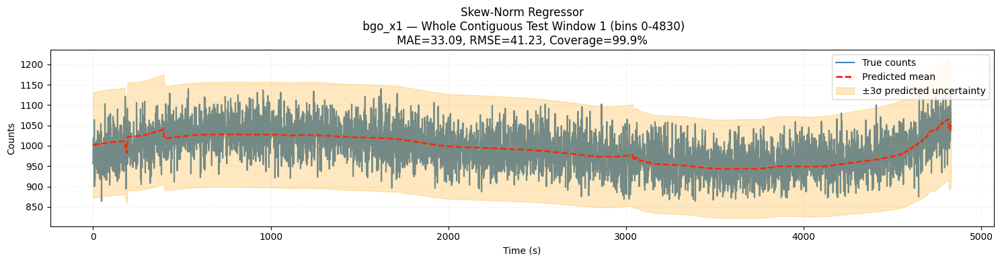

detector: bgo_x0
4830
Fraction of true counts within ±1σ band: 99.86%


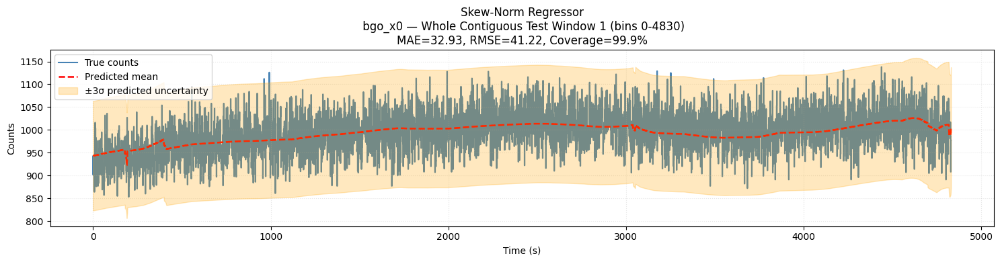

detector: bgo_y1
4830
Fraction of true counts within ±1σ band: 99.92%


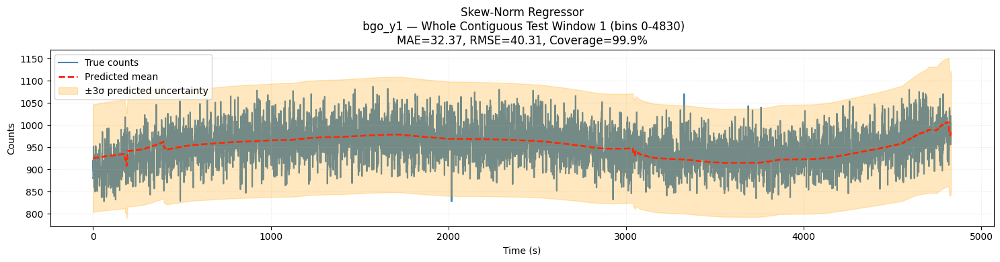

detector: bgo_y0
4830
Fraction of true counts within ±1σ band: 99.94%


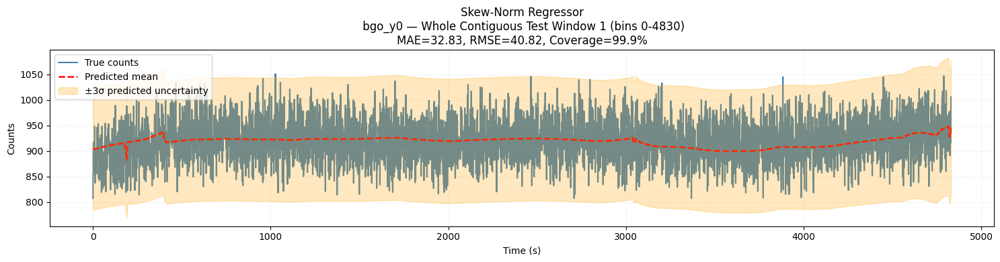

In [ ]:
# select bin duration
bin_duration = 1 #s
start_orbit = 870
end_orbit = 5700

# Select subset
for det_idx in range(1, 7):
  det = det_names[f"det_{det_idx}"]
  print(f"detector: {det}")
  counts_col = f"{target_count_str}{det_idx}"

  # Extract contiguous test data
  y_full = y_test_viz[counts_col].values
  X_full = X_test_viz[input_features]

  # Sampling datapoints
  # [A whole orbit!]
  X_full = X_full[start_orbit:end_orbit]
  y_full = y_full[start_orbit:end_orbit]

  window_size = len(y_full) # all bins
  print(window_size)

  # Scale using the SAME scaler fitted on training data
  X_full_scaled = scaler.transform(X_full)

  # Sliding-window evaluation
  mae_list, rmse_list = [], []
  window_indices = range(0, len(y_full) - window_size + 1, window_size)

  # Looping over windows
  for start in window_indices:
      end = start + window_size
      X_window = X_full_scaled[start:end]
      y_window = y_full[start:end]

      # --- Predict ---
      y_pred_w = model.predict(X_window.astype("float32"), verbose=0)
      n_detectors = y_pred_w.shape[1] // 3

      mu    = y_pred_w[:, :n_detectors]
      sigma = tf.nn.softplus(y_pred_w[:, n_detectors:2*n_detectors]) + 1e-3
      alpha = y_pred_w[:, 2*n_detectors:]

      # --- Build distribution ---
      sn_dist = SkewNormal(loc=mu, scale=sigma, skewness=alpha)
      y_pred_mean = sn_dist.mean()
      y_pred_std  = sn_dist.stddev()

      # Select detector
      y_pred_det = y_pred_mean[:, det_idx - 1]
      y_std_det  = y_pred_std[:, det_idx - 1]

      # --- Metrics ---
      mae  = mean_absolute_error(np.asarray(y_window, dtype=np.float32),
                            np.asarray(y_pred_det, dtype=np.float32))
      rmse = np.sqrt(mean_squared_error(np.asarray(y_window, dtype=np.float32),
                                    np.asarray(y_pred_det, dtype=np.float32)))
      mae_list.append(mae)
      rmse_list.append(rmse)

      # --- Plot (every N windows) ---
      N = 1
      if start % (window_size * N) == 0:
          plt.figure(figsize=(15, 4))
          bins = np.arange(start, end) * bin_duration

          # True vs predicted
          plt.step(bins, y_window, where="mid",
                  label="True counts", linewidth=1.5, color="steelblue",zorder=1)
          plt.step(bins, y_pred_det, where="mid",
                  label="Predicted mean", linewidth=1.8,
                  linestyle="--", color="red", zorder=2)

          # --- Uncertainty band using quantiles ---
          # Equivalent to “~kσ” but adapted to SkewNormal
          k = 3
          k_quantiles = SIGMA_TO_QUANTILES[k]
          q_low  = k_quantiles[0]
          q_high = k_quantiles[1]

          # select dsitrib params
          mu_det    = mu[:, det_idx - 1]
          sigma_det = sigma[:, det_idx - 1]
          alpha_det = alpha[:, det_idx - 1]

          # Compute quantile band per sample
          lower = skewnorm.ppf(q_low,  a=alpha_det, loc=mu_det, scale=sigma_det)
          upper = skewnorm.ppf(q_high, a=alpha_det, loc=mu_det, scale=sigma_det)

          plt.fill_between(
              bins, lower, upper,
              color="orange", alpha=0.25,
              label=f"±{k}σ predicted uncertainty", zorder=3
          )

          # --- Coverage (fraction of true points within band) ---
          inside = (y_window >= lower) & (y_window <= upper)
          coverage = 100 * np.mean(inside)
          print(f"Fraction of true counts within ±{1}σ band: {coverage:.2f}%")

          # --- Labels ---
          plt.title(
              "Skew-Norm Regressor\n "
              f"{det} — Whole Contiguous Test Window {start // window_size + 1} "
              f"(bins {start}-{end})\n"f"MAE={mae:.2f}, RMSE={rmse:.2f}, "
              f"Coverage={coverage:.1f}%"
          )
          plt.xlabel("Time (s)")
          plt.ylabel("Counts")
          plt.legend()
          plt.grid(alpha=0.3, linestyle=":")
          plt.tight_layout()
          plt.show()

-  50ms subsampling data

detector: bgo_x1
92195
Fraction of true counts within ±1σ band: 99.65%


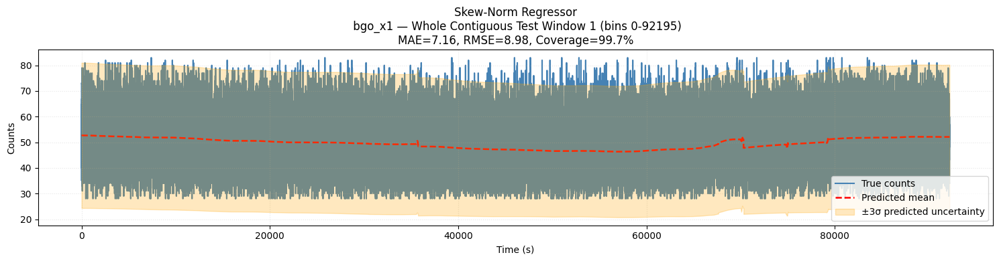

In [ ]:
# Select subset
bin_duration = 1
det_idx = 3 # bgo x0
det = det_names[f"det_{det_idx}"]
print(f"detector: {det}")
counts_col = f"{target_count_str}{det_idx}"
start_orbit = 829*50
end_orbit = 5611*50

# Extract contiguous test data
y_full = y_test_viz[counts_col].values
X_full = X_test_viz[input_features]

# Sampling datapoints
X_full = X_full[start_orbit:end_orbit]
y_full = y_full[start_orbit:end_orbit]

window_size = len(y_full) # all bin
print(window_size)

# Scale using the SAME scaler fitted on training data
X_full_scaled = scaler.transform(X_full)

# Sliding-window evaluation
mae_list, rmse_list = [], []
window_indices = range(0, len(y_full) - window_size + 1, window_size)

# Looping over windows
for start in window_indices:
    end = start + window_size
    X_window = X_full_scaled[start:end]
    y_window = y_full[start:end]

    # --- Predict ---
    y_pred_w = model.predict(X_window.astype("float32"), verbose=0)
    n_detectors = y_pred_w.shape[1] // 3

    mu    = y_pred_w[:, :n_detectors]
    sigma = tf.nn.softplus(y_pred_w[:, n_detectors:2*n_detectors]) + 1e-3
    alpha = y_pred_w[:, 2*n_detectors:]

    # --- Build distribution ---
    sn_dist = SkewNormal(loc=mu, scale=sigma, skewness=alpha)
    y_pred_mean = sn_dist.mean()
    y_pred_std  = sn_dist.stddev()

    # Select detector
    y_pred_det = y_pred_mean[:, det_idx - 1]
    y_std_det  = y_pred_std[:, det_idx - 1]

    # --- Metrics ---
    mae  = mean_absolute_error(np.asarray(y_window, dtype=np.float32),
                           np.asarray(y_pred_det, dtype=np.float32))
    rmse = np.sqrt(mean_squared_error(np.asarray(y_window, dtype=np.float32),
                                  np.asarray(y_pred_det, dtype=np.float32)))
    mae_list.append(mae)
    rmse_list.append(rmse)

    # --- Plot (every N windows) ---
    N = 1
    if start % (window_size * N) == 0:
        plt.figure(figsize=(15, 4))
        bins = np.arange(start, end) * bin_duration

        # True vs predicted
        plt.step(bins, y_window, where="mid",
                 label="True counts", linewidth=1.5, color="steelblue",zorder=1)
        plt.step(bins, y_pred_det, where="mid",
                 label="Predicted mean", linewidth=1.8,
                 linestyle="--", color="red", zorder=2)

        # --- Uncertainty band using quantiles ---
        # Equivalent to “~kσ” but adapted to SkewNormal
        k = 3
        k_quantiles = SIGMA_TO_QUANTILES[k]
        q_low  = k_quantiles[0]
        q_high = k_quantiles[1]

        # select dsitrib params
        mu_det    = mu[:, det_idx - 1]
        sigma_det = sigma[:, det_idx - 1]
        alpha_det = alpha[:, det_idx - 1]

        # Compute quantile band per sample
        lower = skewnorm.ppf(q_low,  a=alpha_det, loc=mu_det, scale=sigma_det)
        upper = skewnorm.ppf(q_high, a=alpha_det, loc=mu_det, scale=sigma_det)

        plt.fill_between(
            bins, lower, upper,
            color="orange", alpha=0.25,
            label=f"±{k}σ predicted uncertainty", zorder=3
        )

        # --- Coverage (fraction of true points within band) ---
        inside = (y_window >= lower) & (y_window <= upper)
        coverage = 100 * np.mean(inside)
        print(f"Fraction of true counts within ±{1}σ band: {coverage:.2f}%")

        # --- Labels ---
        plt.title(
            "Skew-Norm Regressor\n "
            f"{det} — Whole Contiguous Test Window {start // window_size + 1} "
            f"(bins {start}-{end})\n"f"MAE={mae:.2f}, RMSE={rmse:.2f}, "
            f"Coverage={coverage:.1f}%"
        )
        plt.xlabel("Time (s)")
        plt.ylabel("Counts")
        plt.legend()
        plt.grid(alpha=0.3, linestyle=":")
        plt.tight_layout()
        plt.show()

> The model seems to follow the true count trend, and also being quite accurate.

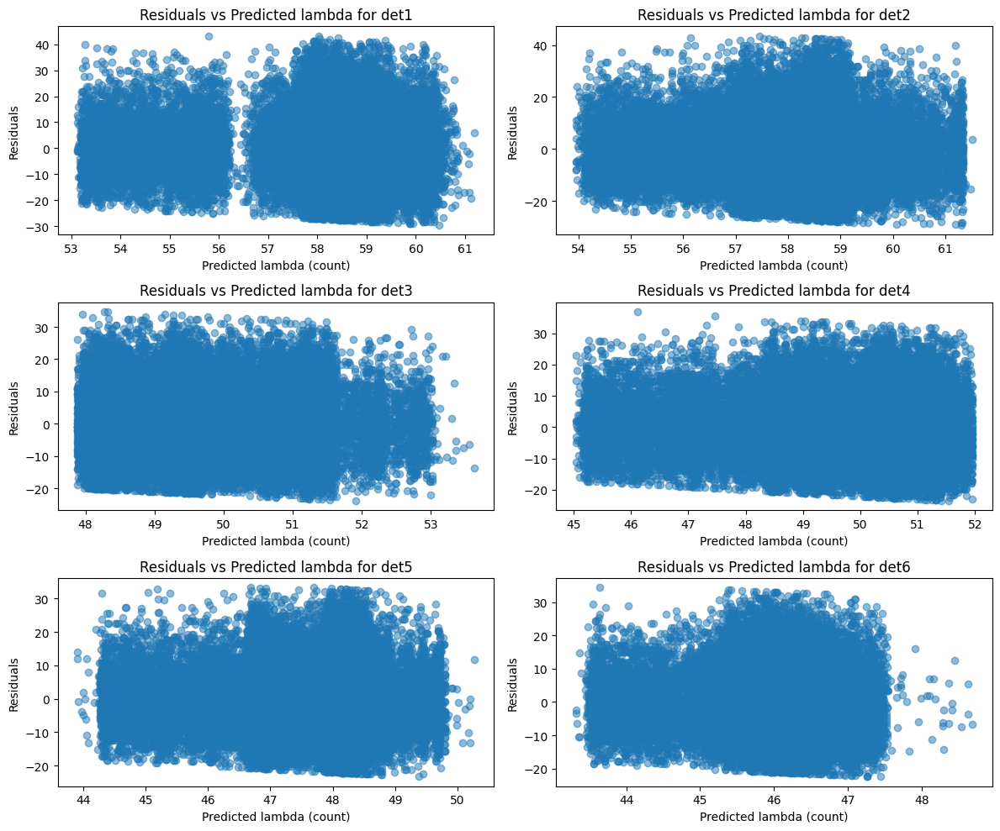

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(12, 10))

for det_idx in range(n_detectors):
  residuals = y_test[f"{target_count_str}{det_idx+1}"].values - y_pred[:, det_idx]
  row, col = divmod(det_idx, 2)
  ax[row, col].scatter(y_pred[:, det_idx], residuals, alpha=0.5)
  ax[row, col].set_xlabel("Predicted lambda (count)")
  ax[row, col].set_ylabel("Residuals")
  ax[row, col].set_title(f"Residuals vs Predicted lambda for det{det_idx+1}")

plt.tight_layout()
plt.show()

> Here we are visualizing how variance changes as $λ$ varies, in particular at the **tails**. Indeed, we have extra variance both at low and high counts. That means the real data are slightly overdispersed, and the Poisson assumption (variance = mean) doesn’t hold perfectly across all ranges.

(60141, 6)


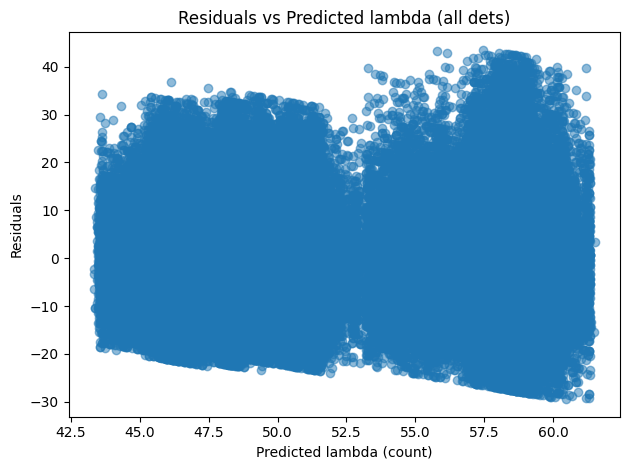

In [ ]:
residuals = y_test - y_pred
print(residuals.shape)
plt.scatter(y_pred, residuals, alpha=0.5)
plt.xlabel("Predicted lambda (count)")
plt.ylabel("Residuals")
plt.title(f"Residuals vs Predicted lambda (all dets)")

plt.tight_layout()
plt.show()

> The two clusters that depend on the different count rates distribution of the first two detectors are clearly visible

###### Checking the overdispersion degree

In [ ]:
def check_dispersion(y_true, y_pred):
    """Return simple variance-to-mean and Pearson dispersion."""
    resid = y_true - y_pred
    var_obs = np.var(resid, ddof=1)
    mean_pred = np.mean(y_pred)
    phi_varmean = var_obs / mean_pred  # variance-to-mean ratio
    pearson_phi = np.mean((resid**2) / (y_pred + 1e-8))  # Pearson dispersion
    return phi_varmean, pearson_phi

for det in range(n_detectors):
    y_t = y_test[f"{target_count_str}{det+1}"].values
    y_p = y_pred[:, det]
    phi_vm, phi_p = check_dispersion(y_t, y_p)
    print(f"Detector {det+1}: Var/Mean = {phi_vm:.3f}, Pearson φ = {phi_p:.3f}")

Detector 1: Var/Mean = 2.222, Pearson φ = 2.222
Detector 2: Var/Mean = 2.217, Pearson φ = 2.217
Detector 3: Var/Mean = 1.616, Pearson φ = 1.616
Detector 4: Var/Mean = 1.616, Pearson φ = 1.616
Detector 5: Var/Mean = 1.660, Pearson φ = 1.660
Detector 6: Var/Mean = 1.659, Pearson φ = 1.659


> Extra variance (Var/Mean > 2) is likely due to missing explanatory variables or temporal dependence, not from the underlying distribution. NB, LogNormal, etc. don’t help — they assume that extra variance is random, not due to missing structure.

> It seems that each detector shows clear overdispersion. This means that our Poisson regressor underestimates uncertainty (variance), namely the predicted counts vary 2-3x more than a pure Poisson process predicts.
>
> The model fits the mean trend well, but can’t explain the extra stochastic variability between orbits or detectors.

##### Saving / loading model

In [ ]:
# saving
skewnorm_regressor.save('/content/drive/MyDrive/Colab Notebooks/Internship + Thesis/models/skn_1s.h5')

/usr/local/lib/python3.12/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from tensorflow.keras.models import load_model

# loading
skewnorm_regressor = load_model('/content/drive/MyDrive/Colab Notebooks/Internship + Thesis/models/skn_50ms_ang.h5', compile=False)

In [ ]:
skewnorm_regressor.compile(optimizer = "adam",
                           loss = skew_normal_nll,
                           metrics = [custom_mae])

### **SHAP**: Interpretability
SHAP is a method that explains how individual predictions are made by a machine learning model. SHAP explains how individual predictions are arrived at in terms of contributions from each of the model's input variables. This is a highly intuitive approach that produces simple but informative outputs.

1 | **Baseline computation**:
SHAP first establishes a reference prediction — the expected model output over a representative set of background (usually training) samples. Formally, the baseline value is defined as the expectation of the model output under the background data distribution:

$$\phi_0 = 𝔼_{x\sim p(x)}[f(x)]$$

Since the true underlying distribution $p(x)$ is unknown, this expectation is estimated via *Monte Carlo sampling* from the available background dataset:

$$\phi_0 = \dfrac{1}{N} \sum\limits_{x \in \text{background}} f(x)$$


Conceptually, it represents what the model would predict if we had no information about the *specific* input sample.
In practice, this is equivalent to marginalizing over all possible feature values — an average prediction when all features are “unknown”.

2 | **Test prediction**:
For each test sample $x_{test}$ compute $f(x_{test})$. This reflects the prediction the model makes when it has access to this sample’s actual feature values:

$$f(x_{test}) = \phi_0 + \sum\limits_{i}  \phi_i$$

3 |  **Shapley values**:
SHAP decomposes the difference between the sample’s prediction and the baseline:

$$f(x_{test}) - \phi_0 = \sum\limits_{i} \phi_i$$

Each feature $\phi_i$ quantifies **how much feature** $i$ contributed to shifting the prediction away from the baseline — positively or negatively.
In other words, Shapley values explain *why* the model’s prediction for a specific sample differs from what it would predict in general.



In [ ]:
import shap

In [ ]:
# Contiguous data to consider orbital data
feature_names = list(input_features)  # original feature names
X_test_viz_scaled = scaler.transform(X_test_viz)
X_test_viz_scaled_array = np.asarray(X_test_viz_scaled, dtype=np.float32)

We will interpret the Shapley values for each detector. Now, we analyze the first one.

#### Local interpretability
Explaining predictions for individual instances of the data is referred to as *local* *interpretability*.

In [ ]:
idx_sample = 1

In [ ]:
model = skewnorm_regressor
det_idx = 1
background = shap.sample(X_train_scaled, 100)

def f(X):
    X = np.asarray(X, dtype=np.float32)
    # Keras Functional often expects a list of inputs
    return model_predict_fn(X=[X], det_idx=det_idx)

explainer_det1 = shap.KernelExplainer(f, background)

In [ ]:
# Rnd data
feature_names = list(input_features)  # original feature names
X_test_20k = np.asarray(X_test_scaled[:20000], dtype=np.float32)
shap_values_det1 = explainer_det1.shap_values(X_test_20k)

  0%|          | 0/60141 [00:00<?, ?it/s]

KeyboardInterrupt: 

##### Waterfall and force plots
The waterfall structure emphasises the additive nature of positive and negative contributors, and how they build on the base value to yield the model's prediction, $f(x)$.

In [ ]:
shap.plots.waterfall(shap_values_det1[idx_sample])

> If we don't have access to any input feature, the predictions is supposed to be *~ 1152* (the population average).
>
> Our current prediction is way lower than the population average (the baseline), and the Shapley values of each features tells us that the `z_lat` and `x_lon` features are the one that are the most impactful.

In [ ]:
shap.initjs()
shap.plots.force(shap_values_det1[idx_sample])

> This is a more compact plot of the waterfall plot, delivering the same info.

#### Global interpretability
The goal of global interpretation methods is to describe the expected behaviour of a machine learning model with respect to the whole distribution of values for its input variables. With SHAP, this is achieved by aggregating the SHAP values for individual instances across the entire population.

<a name="barplot_sk"></a>
##### Bar plot
It examines the mean absolute SHAP value for each feature across all of the data. This quantifies, on average, the magnitude (positive or negative) of each feature's contribution towards the predicted background count rate. It basically rank features by their importance. Indeed, Mean absolute SHAP values are essentially a drop-in replacement for more traditional *feature importance*.



In [ ]:
shap.plots.bar(shap_values_det1)

> The most influential variables, as also evident from the SHAP summary plot, are `z_lat` and `z_lon`, which exhibit the largest average SHAP magnitudes, indicating that they have the strongest impact on the predicted count rates. This means that the model relies heavily on the satellite’s galactic orientation to estimate the background photon rate. In contrast, `altitude` shows comparatively small SHAP values, suggesting that it contributes little to the model’s predictions.
>
> Moreover, these results are also coherent with the theory, in particular for detector 1, the bottom one.

##### General force plot

In [ ]:
shap.initjs()
shap.plots.force(shap_values_det1[-100:])

> The plot above shows the force plots for multiple test samples:
> - *x-axis:* the test sample
> - *y-axis:* the corresponding force plot
>
> Here there aren't clusters of samples that behave very differently among them, because they approximately follow the same behavior.

##### Beeswarm plot
Beeswarm plots are a more complex and information-rich display of SHAP values that reveal not just the relative importance of features, but their actual relationships with the predicted outcome.

In [ ]:
shap.plots.beeswarm(shap_values_det1[-500:])

> There is a negative correlation between `z_lat` and its shapely values; instead there is a more smoother and clear positive one for `z_lon`.

##### Dependence scatter plots
To truly understand the relationship between a feature's values and the model's predicted outcomes, its necessary to examine dependence plots.

In such a plot, every instance appears as a point. These points are presented as a scatterplot of a variable's SHAP values versus the variables underlying raw values.

In [ ]:
plt.figure(figsize=(10,7))
shap.plots.scatter(shap_values_det1[:, "z_lon"], color=shap_values_det1[:, "Earth_lon"], ax=plt.gca())

> There is a clear **positive** relationship between `z_lon` and its SHAP values: higher values of `z_lon` lead to increasingly positive contributions to the predicted background, while lower values lead to negative contributions. The point where SHAP values cross zero (roughly at `z_lon` ≈ 0.4) indicates the threshold at which the feature shifts from decreasing the prediction to increasing it.
>
> The dependence plot is colored by the feature that interacts most strongly with `z_lon`, identified as `Earth_lon`. The color pattern shows that `Earth_lon` **modulates** the effect of `z_lon`: when `Earth_lon` is close to 0, the SHAP values of `z_lon` tend to be small or positive, whereas for Earth longitudes farther from 0 the influence becomes strongly positive or strongly negative. This demonstrates a clear interaction between the two features.

In [ ]:
plt.figure(figsize=(10,7))
shap.plots.scatter(shap_values_det1[:, 'z_lat'], color=shap_values_det1[:, "x_lat"], ax=plt.gca())

> In this dependence plot we observe a behaviour similar to the one seen for `z_lon`, but with an overall **negative** relationship between `z_lat` and its SHAP values. As `z_lat` increases, the SHAP contribution initially decreases, reaching a strong negative minimum, and then slowly rises again at higher values — producing the characteristic “golf-club” shape.
>
> The color scale indicates the feature that interacts most strongly with `z_lat`, identified here as `x_lat`. The transition in colour shows that the effect of `z_lat` depends on the value of `x_lat`: when `x_lat` is close to zero or positive (purple/red), `z_lat` produces increasingly negative SHAP values as it grows. Conversely, when `x_lat` becomes more negative (blue), the SHAP values start increasing again at larger `z_lat`. This confirms a clear interaction where `x_lat` modulates the sign and magnitude of the contribution of `z_lat`.


##### Correlation matrix

In [ ]:
df_shap = pd.DataFrame(shap_values_det1.values, columns=feature_names)
df_input = pd.DataFrame(X_test_scaled, columns=feature_names)
corr = df_shap.corrwith(df_input["z_lat"])
print(corr)

> This is somehow analogous to the plots above, because it shows the correlation between how much that feature contributes and its raw value. If correlation > 0, larger feature value tends to push prediction upwards; if correlation < 0, it is the other way around.

In [ ]:
df_in = pd.DataFrame(X_test_scaled, columns=feature_names)
df_sh = pd.DataFrame(shap_values_det1.values, columns=feature_names)

corr_input = df_in.corr()
corr_shap  = df_sh.corr()

fig, axs = plt.subplots(1,2, figsize=(14,6))
sns.heatmap(corr_input, ax=axs[0], center=0, cmap='coolwarm').set_title('Feature Correlation')
sns.heatmap(corr_shap, ax=axs[1], center=0, cmap='coolwarm').set_title('SHAP Value Correlation')
plt.show()

> The "correlation of effects" matrix. It tells us whether certain features tend to move together in their influence. Counterintuitively, we shouldn't expect the same behavior of the correlation matrix of the raw input features [above](#corr). This is because the SHAP correlation matrix acts in *model space*, checking how the model's attributions move together across samples (how their influences on the prediction are coupled). It concerns *model's learned dependencies*. The feature correlation instead acts in the *data space*, measuring how the raw variables move together in the dataset (how they are structured). Indeed, they regard *dataset statistical dependencies.*
>
> They might diverge if the model is strongly non-linear, as in our case. Otherwise, our model would be acting in a linear fashion.

#### Interpreting the model on other detectors

In [ ]:
# Number of detectors (target_dim)
n_detectors = 6
start_orbit = 870
end_orbit = 5700

# Background for SHAP
background_sk = shap.sample(X_train_scaled, 100)

# Dictionary to store explainers + shap values
explainers_sk = {}
shap_values_sk = {}

def make_f(det_idx):
    def f(X):
        X = np.asarray(X, dtype=np.float32)
        y = model_predict_fn(X=[X], det_idx=det_idx)   # <-- wrap as list
        return np.asarray(y).reshape(-1)               # ensure (n_samples,)
    return f

# take subset of data
X_explain = np.asarray(X_test_viz_scaled[start_orbit:end_orbit], dtype=np.float32)

# Loop over detectors
for k in range(n_detectors):
    explainers_sk[k] = shap.KernelExplainer(make_f(k), background_sk)
    shap_values_sk[k] = explainers_sk[k].shap_values(X_explain)
    print(f"Done: detector {k+1}")

  0%|          | 0/4830 [00:00<?, ?it/s]

Done: detector 1


  0%|          | 0/4830 [00:00<?, ?it/s]

Done: detector 2


  0%|          | 0/4830 [00:00<?, ?it/s]

Done: detector 3


  0%|          | 0/4830 [00:00<?, ?it/s]

Done: detector 4


  0%|          | 0/4830 [00:00<?, ?it/s]

Done: detector 5


  0%|          | 0/4830 [00:00<?, ?it/s]

Done: detector 6


<a name="shapsn"></a>
Comprehensive bar plot for each detector

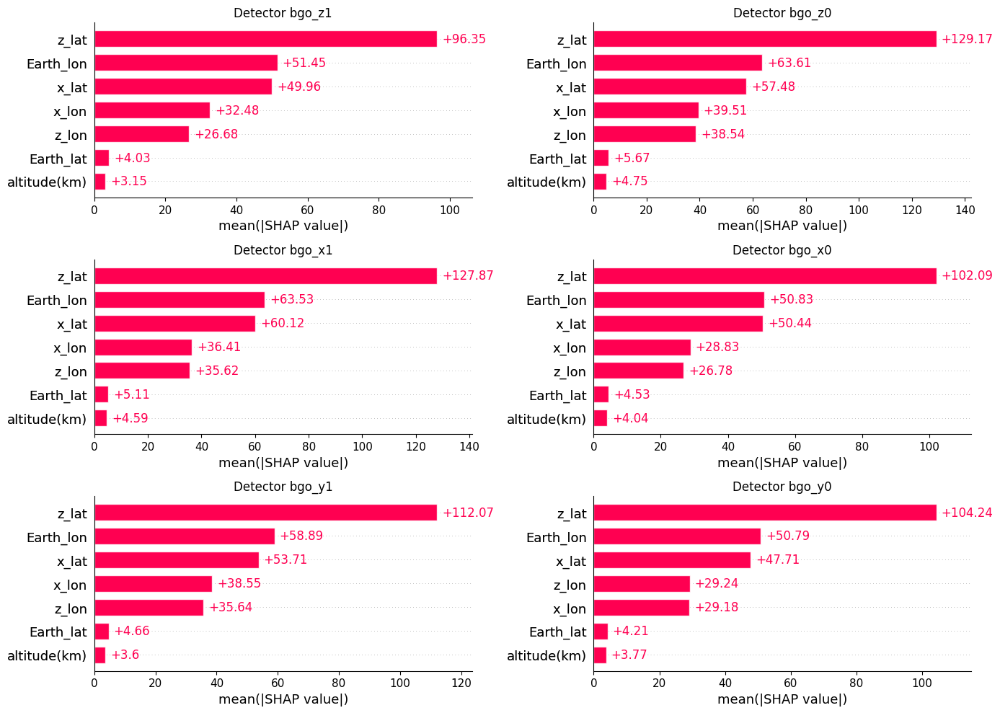

In [ ]:
def plot_shap_bar(ax, shap_values, X, explainer, feature_names, title):
    base = explainer.expected_value
    base_vals = np.full((X.shape[0],), float(base))

    shap_exp = shap.Explanation(
        values=shap_values,
        base_values=base_vals,
        data=X,
        feature_names=feature_names
    )

    shap.plots.bar(
        shap_exp,
        max_display=10,
        show=False,
        ax=ax
    )
    ax.set_title(title)

# plot subplots of shap contributions
fig, ax = plt.subplots(3, 2, figsize=(14, 10))

for det_idx in range(n_detectors):
    r, c = divmod(det_idx, 2)
    det = det_names[f"det_{det_idx+1}"]
    plot_shap_bar(
        ax=ax[r, c],
        shap_values=shap_values_sk[det_idx],
        X=X_explain,
        explainer=explainers_sk[det_idx],
        feature_names=input_features,
        title=f"Detector {det}"
    )

plt.tight_layout()
plt.show()

> Within a single orbital pass, SHAP attributions are largely consistent across detectors, indicating that background variability is driven by common geometric and orbital factors rather than detector-specific effects.



---



## Gaussian Mixture Model

As we have seen, we do not achieve very good results, because of the intrinsic overdispersion in data. This means that none of the existing continuous distribution is capable of fit our data well.

Because of that, we try to fit a **Gaussian Mixture Model** (GMM) to our data, and it will learn a very reliable probability distribution, fitting a composition of several gaussians in order to capture all the variability of our data.

In [ ]:
from sklearn.mixture import GaussianMixture

### The theory behind

A GMM represents a probability density as a weighted sum of $K$ Gaussian components:
$$
p(x) = \sum_{k=1}^K \pi_k\,\mathcal{N}(x \mid \mu_k, \Sigma_k),
$$

where $\pi_k$ are mixture weights and $(\mu_k, \Sigma_k)$ are the parameters of each Gaussian component.

#### *E-M algorithm*
GMMs are typically trained using the *Expectation-Maximization* (EM) algorithm, which iteratively maximizes the data likelihood. EM alternates between:

* *Expectation* step: compute the posterior responsibility of component $k$ for each sample $x_i$:

$$
\gamma_{ik}
= p(z=k \mid x_i)
= \frac{\pi_k\,\mathcal{N}(x_i \mid \mu_k, \Sigma_k)}
{\sum_{j=1}^K \pi_j\,\mathcal{N}(x_i \mid \mu_j, \Sigma_j)}.
$$

* *Maximization* step: update the mixture parameters using these responsibilities:
$$
\pi_k = \frac{1}{N}\sum_{i}\gamma_{ik}, \qquad
\mu_k = \frac{\sum_i \gamma_{ik} x_i}{\sum_i \gamma_{ik}},
$$

$$
\Sigma_k =
\frac{\sum_i \gamma_{ik}(x_i-\mu_k)(x_i-\mu_k)^{\top}}
{\sum_i \gamma_{ik}}.
$$

These updates correspond to closed-form maximum-likelihood estimates under weighted data. EM repeats until the log-likelihood converges, yielding a generative and fully probabilistic density model.


### Modeling the count rates distribution
Here we will fit a GMM on the whole count rate time series, for a chosen detector.

In [ ]:
from sklearn.model_selection import GridSearchCV
from scipy.stats import norm
from scipy.stats import gaussian_kde

This is the current situation: the following are *hist + kde* plots of the **filtered** count rates columns.

In [ ]:
nrows = 2
ncols = 3

for df_type in satellite_data_dict:
  satellite_data = satellite_data_dict[df_type]

  fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 7))
  fig.suptitle(f"Histogram + KDE ({df_type})")

  cols_to_plot = satellite_data.columns[8:14]

  for i, col in enumerate(cols_to_plot):
    if df_type == "50ms":
      bins = 20
    else: bins = 40

    axs = ax[i // ncols, i % ncols]

    sns.histplot(satellite_data[col], bins=bins,
                kde=True, stat="density", ax=axs)

    axs.set_title(col)
    axs.set_xlabel(col)
    axs.set_ylabel("Density")

  plt.tight_layout()
  plt.show()

#### Log-transforming targets
We apply a log-transform not because the data are negative, but to **fix** the model.
A GMM uses Gaussian components, which have support on the entire real line and can therefore assign probability mass to **negative** values, predict negative means, or generate negative samples.
By fitting the GMM in log-space and then inverting with $exp(log(y))$, we ensure that all generated rates remain positive.
The log-transform simply moves the data into a space where Gaussian mixtures behave correctly, and **positivity is guaranteed** after inversion.

In [ ]:
def find_best_k(data, max_k = 15, print_bool = False):
  Ks = range(1, max_k)

  info_dict = {
      "AIC": {},
      "BIC": {}
  }

  # fit for different components
  for k in Ks:
      gmm = GaussianMixture(n_components=k, random_state=42).fit(data) # E-M step
      info_dict["AIC"][k] = gmm.aic(data)
      info_dict["BIC"][k] = gmm.bic(data)

  # Convert values
  info_dict["AIC"] = {k: float(v) for k, v in info_dict["AIC"].items()}
  info_dict["BIC"] = {k: float(v) for k, v in info_dict["BIC"].items()}

  # Print formatted
  if print_bool:
    for metric in ["AIC", "BIC"]:
        print(metric + ":")
        for k, v in info_dict[metric].items():
            print(f"  K={k}: {v:.2f}")
        print()
  else: pass

  return info_dict

We will find the best number of **component** $k$ for each time resolution. This hyperparameter will be the minimal $k$ for the second step of this analysis, the **Gaussian Mixture Regression**, performed in the next [section](#gmr).

We will choose the best $k$ just looking at the minimum [*Bayesian Information Criterion*](https://en.wikipedia.org/wiki/Bayesian_information_criterion) (BIC) score, that is a statistical metric used to evaluate the goodness of fit of a model. In particular, BIC helps in identifying the model that best explains the data while penalizing for model complexity to avoid overfitting.

To do that, we will consider the count rate distribution of each detector individually and we will estimate a $k$ for each distribution. The chosen $k$ that will represent all the detectors will be the `max(k_list)`.



In [ ]:
best_k_res = {res: None for res in satellite_data_dict}

# loop over each time res
for df_type in satellite_data_dict:
  if df_type == "50ms":
        continue  # skip 50 ms resolution
  print(f"{df_type} df")
  satellite_data = satellite_data_dict[df_type]
  Ks_per_det = []

  # loop over detectors
  for det_idx in range(6):
      target_count = f"{target_count_str}{det_idx+1}"
      data = satellite_data[target_count].values
      log_y = np.log(data + 1e-6).reshape(-1, 1)

      info_dict = find_best_k(log_y, print_bool=False)
      best_k = min(info_dict['BIC'], key=info_dict['BIC'].get)
      Ks_per_det.append(best_k)

  print(f"> K per detector: {Ks_per_det}")
  final_K = max(Ks_per_det)
  print("> Final K for GMR =", final_K)
  best_k_res[df_type] = final_K
  print()

When estimating the number of Gaussian components, the 50 ms data systematically leads BIC to select extremely large values of K≈13), despite the fact that the KDE and empirical histograms do not exhibit genuine multimodality. This happens because the 50 ms binning produces much higher relative Poisson noise and a far larger number of samples. These two effects amplify small, purely stochastic fluctuations in the count distribution; the GMM likelihood interprets these fluctuations as distinct “clusters”, artificially driving BIC toward high complexity. In contrast, at coarser resolutions (e.g., 1 s), the noise averages out and the underlying distribution becomes smooth and unimodal, yielding stable and physically meaningful values of
K (typically K=2). For this reason, we discard the BIC-selected K obtained at 50 ms and rely instead on the estimate derived from the 1 s distributions.

In [ ]:
best_k_res["50ms"] = best_k_res["1s"]
print(f"Best K for df resolution type: {best_k_res}")

Now we have to choose the detector and the time resolution for a visual proof.

In [ ]:
df_res = "1s"
n_det = 3
data =  satellite_data_dict[df_res][f"{target_count_str}{n_det}"].values
log_y = np.log(data)

In [ ]:
k = best_k_res[df_res]
gmm = GaussianMixture(n_components=k, random_state=42)
gmm.fit(log_y.reshape(-1, 1)) # EM algo

print('Learned weights:', gmm.weights_)
print('\nLearned means:', gmm.means_)
print('\nLearned covariances:', gmm.covariances_)

pred_p = gmm.predict_proba(log_y.reshape(-1, 1))
print('\nProbability of belonging to a component (responsibilities):')
print(pred_p) # very confident

##### Plot histograms

In [ ]:
samples_log, _ = gmm.sample(len(data))
gen_samples = np.exp(samples_log) # converting back exponentiating

samples_type = [data, gen_samples]
titles = ["Original Data Distribution", "GMM Sample Distribution"]

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

for i, sample in enumerate(samples_type):
    mean_res = np.mean(sample)
    std_res = np.std(sample)

    # Histogram of the sample
    ax[i].hist(sample, bins=40, alpha=0.6, label=titles[i])
    ax[i].set_title(titles[i])

    # Text box with stats
    textstr = f"Mean = {mean_res:.2f}\nStd = {std_res:.2f}"
    ax[i].text(
        0.05, 0.95, textstr,
        transform=ax[i].transAxes,
        fontsize=9,
        verticalalignment='top',
        horizontalalignment='left',
        bbox=dict(facecolor='white', alpha=0.7, edgecolor='none')
    )
    ax[i].legend()

plt.tight_layout()
plt.show()

> The sample distribution well captures the true one.

#### Visualizing the Gaussian Mixture

In [ ]:
xs = np.linspace(log_y.min(), log_y.max(), 500)

# mixture PDF in log-space
pdf = np.zeros_like(xs)
for w, mu, cov in zip(gmm.weights_, gmm.means_.flatten(), gmm.covariances_.flatten()):
    pdf += w * norm.pdf(xs, mu, np.sqrt(cov))

plt.figure(figsize=(12,5))
plt.hist(log_y, bins=40, density=True, alpha=0.4, label="Data (log space)")
plt.plot(xs, pdf, label="GMM mixture PDF", linewidth=2)
kde = gaussian_kde(log_y.T.reshape(1, -1))

plt.plot(xs, kde(xs), color='gray', label="Empirical KDE")

# plot each component
for w, mu, cov in zip(gmm.weights_, gmm.means_.flatten(), gmm.covariances_.flatten()):
    plt.plot(xs, w * norm.pdf(xs, mu, np.sqrt(cov)), '--', label=f"Component μ={mu:.2f}")

plt.legend()
plt.title("GMM components in log-space")
plt.show()

> Here we can see the goodness-of-fit of our Gaussian Mixture, that almost overlaps with the empirical KDE of the data.

<a name="gmr"></a>
### Gaussian Mixture Regression

We create another probabilistic **baseline** like before, but instead of fitting a predetermined distribution on a small window to infer the per-bin distribution (like a Poisson, SkewNormal, etc.), we fit a global GMM that will try to learn the underlying training distribution.

The model will learn a **joint** distribution on both features and targets:

$$ p(x, y) = \sum_{k=1}^K \pi_k\,\mathcal{N}([x, y] \mid \mu_k, \Sigma_k),$$

such that we can obtain a GMR by computing:

$$p(y \ | \ x) = \frac{p(x,y)}{p(x)}.$$

Informally, we can say that we fit a GMM on the $(x, y)$ space and we obtain the probabilistic regressor conditioning $y$ on $x$, where $p(y \ | \ x)$ is a **mixture** of gaussians.


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

As before, we will create two different test sets (one that contains i.i.d. samples, and a contiguous one).


In [ ]:
input_features = input_features_ang
target_features = [f"{target_count_str}{i+1}" for i in range(6)]

# select time res
df_res = "1s"
satellite_data = satellite_data_dict[df_res]

# --- 1) Define contiguous test size ---
test_fraction = 0.15
viz_fraction = 0.20
n_total = len(satellite_data)
n_contig = int(n_total * test_fraction)
n_contig_viz = int(n_total * viz_fraction)

# --- 2) Extract contiguous test (LAST 10%) ---
X_test_contig = satellite_data[input_features].iloc[-n_contig:]
y_test_contig = satellite_data[target_features].iloc[-n_contig:]

# --- 2) Extract contiguous data for viz 50ms (LAST 15%)
X_test_viz = satellite_data[input_features].iloc[-n_contig_viz:]
y_test_viz = satellite_data[target_features].iloc[-n_contig_viz:]

# --- 3) Remove contiguous block from the dataset ---
X_remaining = satellite_data[input_features].iloc[:-n_contig]
y_remaining = satellite_data[target_features].iloc[:-n_contig]

# --- 4) IID split only on the remaining data ---
X_train, X_test, y_train, y_test = train_test_split(
    X_remaining,
    y_remaining,
    test_size=0.10,
    random_state=42,
    shuffle=True
)
print("X_train", X_train.shape)
print("X_test", X_test.shape)
print("X_test_contig", X_test_contig.shape)
print("y_test_contig", y_test_contig.shape)
print("X_test_viz", X_test_viz.shape)
print("y_test_viz", y_test_viz.shape)
print("y_train", y_train.shape)
print("y_test", y_test.shape)

X_train (25587, 10)
X_test (2844, 10)
X_test_contig (5017, 10)
y_test_contig (5017, 6)
X_test_viz (6689, 10)
y_test_viz (6689, 6)
y_train (25587, 6)
y_test (2844, 6)


In [ ]:
# Transforming input features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Transforming target features
y_train_log = np.log(y_train + 1e-6)
y_test_log = np.log(y_test+ 1e-6)

In [ ]:
# Create the joint Input + Target df
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=input_features).reset_index(drop=True)
X_test_scaled_df  = pd.DataFrame(X_test_scaled, columns=input_features).reset_index(drop=True)
y_train_df        = pd.DataFrame(y_train_log, columns=target_features).reset_index(drop=True)
y_test_df         = pd.DataFrame(y_test_log,  columns=target_features).reset_index(drop=True)

train_df = pd.concat([X_train_scaled_df, y_train_df], axis=1)
test_df  = pd.concat([X_test_scaled_df,  y_test_df],  axis=1)

train_df.head()

,altitude(km),Earth_lon_sin,Earth_lon_cos,z_lon_sin,z_lon_cos,x_lon_sin,x_lon_cos,Earth_lat_sin,z_lat_sin,x_lat_sin,counts_det_1,counts_det_2,counts_det_3,counts_det_4,counts_det_5,counts_det_6
0,0.940228,1.207333,0.055734,0.897264,-0.325559,0.699462,-0.788245,0.782164,-1.210849,-0.131867,7.073270,7.132498,6.940222,6.907755,6.951772,6.860664
1,0.832310,-0.773861,-1.128303,-0.929755,-0.850353,-0.187855,1.288060,0.380671,0.730606,0.448147,7.094235,7.032624,6.887553,6.962243,6.853299,6.797940
2,-1.568798,-1.666538,0.403253,-0.832873,2.183425,-0.309878,-1.256066,0.531795,1.702196,-2.777998,7.149917,7.072422,6.957497,6.861711,6.860664,6.855409
3,-1.632180,-1.448088,-0.568561,-1.268071,-0.673686,0.238255,1.139907,1.316736,1.436483,-1.035597,7.044033,7.038784,6.901737,6.964136,6.846943,6.809039
4,1.224030,0.943819,1.064597,1.211035,0.874676,1.094658,0.218271,0.263624,-0.898087,0.375533,7.023759,7.063048,6.891626,6.822197,6.851185,6.833032


#### Evaluation

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
from scipy.stats import multivariate_normal
from sklearn.metrics import mean_squared_error, r2_score

In [ ]:
def gmr_predict(gmm, X, d, target_dim=6, clip_delta=10.0):
    X = np.asarray(X)
    N = X.shape[0]
    K = gmm.weights_.shape[0]

    means  = gmm.means_
    covs   = gmm.covariances_
    weights = gmm.weights_

    # Partition means and covariances
    mu_x = means[:, :d]
    mu_y = means[:, d:]
    Sxx  = covs[:, :d, :d]
    Sxy  = covs[:, :d, d:]
    Syx  = covs[:, d:, :d]
    Syy  = covs[:, d:, d:]

    y_mean_log = np.zeros((N, target_dim))
    y_var_log  = np.zeros((N, target_dim))

    eps = 1e-6  # larger eps for stability

    for i in range(N):
        x = X[i]

        # ------ Stable mixture weights using logpdf ------
        logpdfs = np.array([
            multivariate_normal.logpdf(x, mean=mu_x[j], cov=Sxx[j] + eps*np.eye(d))
            for j in range(K)
        ])

        # Stabilize exponentials
        logpdfs -= np.max(logpdfs)
        pdfs = np.exp(logpdfs)

        numerators = weights * pdfs
        total = numerators.sum()

        if total < eps:
            pi_star = np.ones(K) / K
        else:
            pi_star = numerators / total

        # ------ Conditional means and covariances ------
        mu_y_given = np.zeros((K, target_dim))
        Sigma_y_given = np.zeros((K, target_dim, target_dim))

        for j in range(K):
            # Invert
            invSxx = np.linalg.inv(Sxx[j] + eps * np.eye(d))

            # conditional correction
            delta = Syx[j] @ invSxx @ (x - mu_x[j])

            # Clip correction to avoid blowups
            delta = np.clip(delta, -clip_delta, clip_delta)

            mu_y_given[j] = mu_y[j] + delta
            Sigma_y_given[j] = Syy[j] - Syx[j] @ invSxx @ Sxy[j]

        # ------ Mixture mean ------
        mu_mix = np.sum(pi_star[:, None] * mu_y_given, axis=0)

        # ------ Mixture covariance ------
        Sigma_mix = np.zeros((target_dim, target_dim))
        for j in range(K):
            diff = (mu_y_given[j] - mu_mix).reshape(-1, 1)
            Sigma_mix += pi_star[j] * (Sigma_y_given[j] + diff @ diff.T)

        y_mean_log[i] = mu_mix
        y_var_log[i] = np.diag(Sigma_mix)

    return y_mean_log, y_var_log


In [ ]:
def pred_and_plot_lc(
        X_test_contig,
        y_test_contig,
        det_idx,
        timesteps,
        gmm,
        scaler,
        input_features,
        target_count_str,
        bin_size_sec=15,
        sigma_coef=1,
        num_windows_to_plot=None,
        time_interval=None
    ):

    N = timesteps
    d = X_test_contig.shape[1]

    # restrict to a specific index interval
    if time_interval is not None:
      sec_start, sec_end = time_interval

      # convert seconds → indices for 50 ms data
      t_start = int(sec_start / bin_size_sec)
      t_end   = int(sec_end   / bin_size_sec)

      print(f"Selected interval: {sec_start}s → {sec_end}s")
      print(f"Corresponding indices: {t_start} → {t_end}")

      X_full = X_test_contig.iloc[t_start:t_end+1][input_features]
      y_full = y_test_contig.iloc[t_start:t_end+1][f"{target_count_str}{det_idx}"].values

      base_offset = t_start  # keeps global time reference

    else:
        X_full = X_test_contig[input_features]
        y_full = y_test_contig[f"{target_count_str}{det_idx}"].values
        base_offset = 0

    # Scale inputs after slicing
    X_full_scaled = scaler.transform(X_full)

    total_len = len(y_full)

    # ------------------------------------------------------
    window_starts = list(range(0, total_len - N + 1, N))
    total_windows_available = len(window_starts)

    # ------------------------------------------------------
    # SELECT HOW MANY WINDOWS TO PLOT
    # ------------------------------------------------------
    if num_windows_to_plot is None:
        selected_starts = window_starts
    else:
        num = min(num_windows_to_plot, total_windows_available)
        selected_starts = window_starts[:num]

    print(f"Available windows in interval: {total_windows_available}")
    print(f"Plotting windows:              {len(selected_starts)}")

    # ------------------------------------------------------

    for w, start in enumerate(selected_starts, start=1):
        end = start + N

        X_window = X_full_scaled[start:end]
        y_window = y_full[start:end]

        # --- GMR prediction ---
        y_pred_log, y_var_log = gmr_predict(
            gmm, X_window, d, target_dim=6
        )

        mu_log  = y_pred_log[:, det_idx - 1]
        var_log = y_var_log[:, det_idx - 1]

        y_pred_det = np.exp(mu_log + 0.5 * var_log)
        var_original = (np.exp(var_log) - 1) * np.exp(2 * mu_log + var_log)
        std_original = np.sqrt(var_original)

        # bounds
        lower = y_pred_det - sigma_coef * std_original
        upper = y_pred_det + sigma_coef * std_original

        # metrics
        mae = np.mean(np.abs(y_window - y_pred_det))
        rmse = np.sqrt(np.mean((y_window - y_pred_det)**2))

        # time axis
        time_axis = np.arange(start + base_offset, end + base_offset) * bin_size_sec

        # for coverage
        inside = (y_window >= lower) & (y_window <= upper)
        coverage = 100 * np.mean(inside)

        # Plot
        plt.figure(figsize=(15, 4))
        plt.fill_between(time_axis, lower, upper, color="orange", alpha=0.3, zorder=3)
        plt.step(time_axis, y_window, where="mid", label="True counts", zorder=1)
        plt.step(time_axis, y_pred_det, where="mid", linestyle="--", label="Predicted",zorder=2)

        plt.title(
            f"Detector {det_idx} — Window {w}\n"
            f"MAE={mae:.2f}, RMSE={rmse:.2f}, Coverage={coverage:.1f}%"
        )
        plt.xlabel(f"Time (seconds, bin={bin_size_sec}s)")
        plt.ylabel("Counts")
        plt.grid(alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

In [ ]:
def eval_gmr_over_k(
    train_df,
    X_train_scaled,
    X_test_scaled,
    y_test_df,
    X_test_contig,
    y_test_contig,
    scaler,
    input_features,
    target_count_str,
    gmr_predict,
    pred_and_plot_lc,
    k_range=np.arange(2, 11),
    det_plot_idx=1,
    bin_size_sec=0.05,
    sigma_coef=1,
    num_windows_to_plot=1,
    do_plot_contig=True,
    do_elbow_plot=True,
):
    """
    Loop over K components, fit GMM, run GMR prediction, evaluate metrics, and plot elbow curves.
    Keeps variable names/logic aligned with your pipeline.
    """

    # --- containers ---
    results = []
    aic_list, bic_list, ll_list, k_list = [], [], [], []

    # needed by your gmr_predict call
    d = X_train_scaled.shape[1]

    # (your targets are in log-space, so invert once per K)
    y_test_true = np.exp(y_test_df)

    for k in k_range:
        print(f"K = {k}")
        gmm = GaussianMixture(n_components=k, random_state=42)
        gmm.fit(train_df)

        # --- information criteria / loglik for elbow ---
        # log-likelihood on training (average log prob * N)
        ll = gmm.score(train_df) * len(train_df)
        aic = gmm.aic(train_df)
        bic = gmm.bic(train_df)

        k_list.append(k)
        ll_list.append(ll)
        aic_list.append(aic)
        bic_list.append(bic)

        # --- predict on random test ---
        y_pred_log, y_var_log = gmr_predict(
            gmm,
            X_test_scaled,
            d=d,
            target_dim=6,
        )

        # lognormal moment-matching (same as your code)
        y_pred = np.exp(y_pred_log + 0.5 * y_var_log)
        y_var = (np.exp(y_var_log) - 1) * np.exp(2 * y_pred_log + y_var_log)

        # --- metrics on random test ---
        rmse = np.sqrt(np.mean((y_test_true - y_pred) ** 2, axis=0))
        mae = np.mean(np.abs(y_test_true - y_pred), axis=0)
        r2 = r2_score(y_test_true, y_pred, multioutput="uniform_average")
        perc_error = np.mean(np.abs(y_test_true - y_pred) / y_test_true)

        print(f"R2 score: {r2}\n")
        print(f"MAE per detector:\n{mae}\n")
        print(f"RMSE per detector:\n{rmse}\n")
        print(f"Percentage error: {perc_error*100:.2f}%")
        print(f"AIC: {aic:.2f} | BIC: {bic:.2f} | Train loglik: {ll:.2f}")

        # save row
        results.append({
            "K": int(k),
            "R2": float(r2),
            "perc_error": float(perc_error),
            "AIC": float(aic),
            "BIC": float(bic),
            "train_loglik": float(ll),
            # store averages + per-detector metrics
            "MAE_mean": float(np.mean(mae)),
            "RMSE_mean": float(np.mean(rmse)),
            "MAE_per_det": mae,
            "RMSE_per_det": rmse,
        })

        # --- predict on contiguous test and plot ---
        if do_plot_contig:
            pred_and_plot_lc(
                X_test_contig,
                y_test_contig,
                det_idx=det_plot_idx,
                timesteps=len(X_test_scaled),
                gmm=gmm,
                scaler=scaler,
                input_features=input_features,
                target_count_str=target_count_str,
                bin_size_sec=bin_size_sec,
                sigma_coef=sigma_coef,
                num_windows_to_plot=num_windows_to_plot,
            )

        print()

    # --- results dataframe ---
    res_df = pd.DataFrame(results)

    # --- elbow plots ---
    if do_elbow_plot:
        fig, ax = plt.subplots(1, 3, figsize=(16, 4))

        ax[0].plot(k_list, bic_list, marker="o")
        ax[0].set_title("Elbow (BIC) — lower is better")
        ax[0].set_xlabel("K")
        ax[0].set_ylabel("BIC")
        ax[0].grid(alpha=0.3, linestyle=":")

        ax[1].plot(k_list, aic_list, marker="o")
        ax[1].set_title("Elbow (AIC) — lower is better")
        ax[1].set_xlabel("K")
        ax[1].set_ylabel("AIC")
        ax[1].grid(alpha=0.3, linestyle=":")

        ax[2].plot(k_list, ll_list, marker="o")
        ax[2].set_title("Train log-likelihood — higher is better")
        ax[2].set_xlabel("K")
        ax[2].set_ylabel("loglik (sum)")
        ax[2].grid(alpha=0.3, linestyle=":")

        plt.tight_layout()
        plt.show()

        # also plot predictive metric vs K (super utile)
        plt.figure(figsize=(6,4))
        plt.plot(res_df["K"], res_df["RMSE_mean"], marker="o")
        plt.title("Predictive RMSE (mean over detectors) vs K — lower is better")
        plt.xlabel("K")
        plt.ylabel("RMSE_mean")
        plt.grid(alpha=0.3, linestyle=":")
        plt.tight_layout()
        plt.show()

    return res_df


##### 15s data

###### Loop for different K's

In [ ]:
# pipeline
#best_k_res['15s']
# loop over k components
for k in np.arange(3, 15):
  print(f"K = {k}")
  gmm = GaussianMixture(n_components=k, random_state=42)
  gmm.fit(train_df) # 1) fit on the chosen k

  # 2) predict on rnd test test
  d = X_train_scaled.shape[1] # input features
  y_pred_log, y_var_log = gmr_predict(
      gmm,
      X_test_scaled,
      d=d,
      target_dim=6, # output: n_det
  )
  y_pred = np.exp(y_pred_log + 0.5 * y_var_log)
  y_var = (np.exp(y_var_log) - 1) * np.exp(2 * y_pred_log + y_var_log)
  y_test_true = np.exp(y_test_df)

  # 3) predict on conitguous test set
  rmse = np.sqrt(np.mean((y_test_true - y_pred)**2, axis=0))
  mae = np.mean(np.abs(y_test_true - y_pred), axis=0)
  r2 = r2_score(y_test_true, y_pred, multioutput='uniform_average')
  perc_error = np.mean(np.abs(y_test_true - y_pred) / y_test_true)
  print(f"R2 score: {r2}\n")
  print(f"MAE per detector:\n{mae}\n")
  print(f"RMSE per detector:\n{rmse}\n")
  print(f"Percentage error: {perc_error*100:.2f}%")

  # 4) plot contig
  pred_and_plot_lc(X_test_contig, y_test_contig, det_idx=1, timesteps=250, gmm=gmm)
  print()

##### 1s data

###### Loop for different K's

K = 2
R2 score: 0.1980723688281071

MAE per detector:
counts_det_1    41.121927
counts_det_2    40.355774
counts_det_3    32.124443
counts_det_4    32.449989
counts_det_5    32.361979
counts_det_6    31.128392
dtype: float64

RMSE per detector:
counts_det_1    51.150534
counts_det_2    50.329450
counts_det_3    40.100916
counts_det_4    40.812660
counts_det_5    40.300284
counts_det_6    38.642221
dtype: float64

Percentage error: 3.40%
AIC: -654149.89 | BIC: -651646.74 | Train loglik: 327379.94
Available windows in interval: 1
Plotting windows:              1


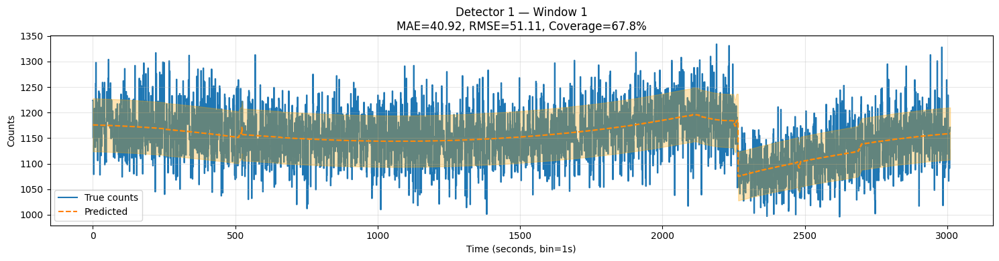


K = 3
R2 score: 0.1983232628071913

MAE per detector:
counts_det_1    41.074730
counts_det_2    40.289828
counts_det_3    32.159413
counts_det_4    32.454660
counts_det_5    32.426636
counts_det_6    31.122213
dtype: float64

RMSE per detector:
counts_det_1    51.117561
counts_det_2    50.289628
counts_det_3    40.119022
counts_det_4    40.809709
counts_det_5    40.315266
counts_det_6    38.637461
dtype: float64

Percentage error: 3.40%
AIC: -1225190.34 | BIC: -1221431.52 | Train loglik: 613053.17
Available windows in interval: 1
Plotting windows:              1


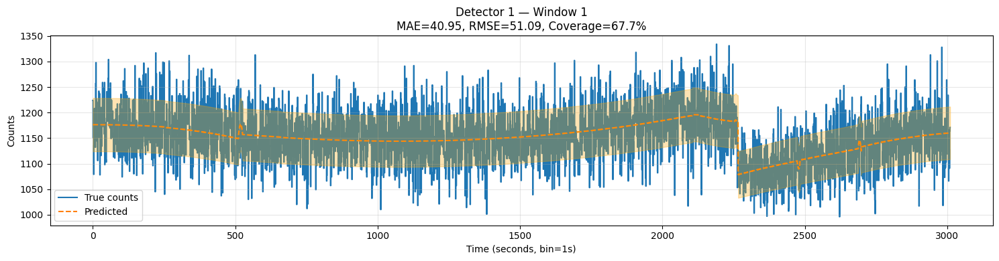


K = 4
R2 score: 0.19863753987119762

MAE per detector:
counts_det_1    41.046340
counts_det_2    40.291133
counts_det_3    32.134986
counts_det_4    32.442975
counts_det_5    32.391280
counts_det_6    31.126397
dtype: float64

RMSE per detector:
counts_det_1    51.074779
counts_det_2    50.292553
counts_det_3    40.108494
counts_det_4    40.793697
counts_det_5    40.308408
counts_det_6    38.649839
dtype: float64

Percentage error: 3.40%
AIC: -1547406.03 | BIC: -1542391.53 | Train loglik: 774314.02
Available windows in interval: 1
Plotting windows:              1


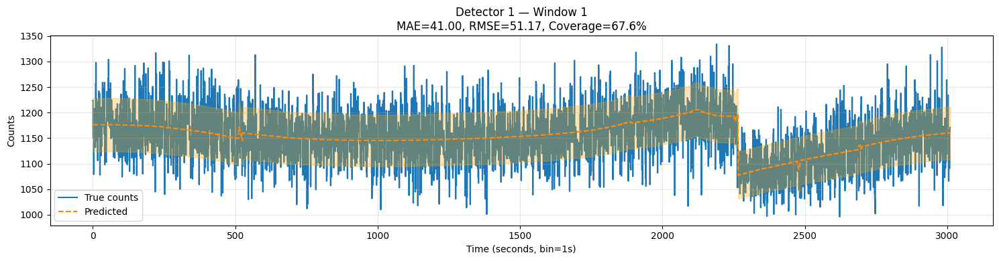


K = 5
R2 score: 0.19897104723853695

MAE per detector:
counts_det_1    41.076411
counts_det_2    40.272737
counts_det_3    32.146470
counts_det_4    32.459361
counts_det_5    32.358748
counts_det_6    31.147751
dtype: float64

RMSE per detector:
counts_det_1    51.099168
counts_det_2    50.252831
counts_det_3    40.102239
counts_det_4    40.788889
counts_det_5    40.269928
counts_det_6    38.658561
dtype: float64

Percentage error: 3.40%
AIC: -1490214.23 | BIC: -1483944.05 | Train loglik: 745871.11
Available windows in interval: 1
Plotting windows:              1


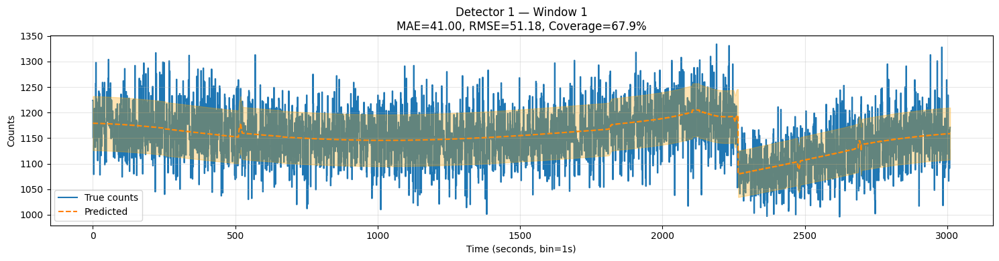


K = 6
R2 score: 0.19908996720611696

MAE per detector:
counts_det_1    41.073347
counts_det_2    40.276140
counts_det_3    32.141011
counts_det_4    32.439708
counts_det_5    32.350028
counts_det_6    31.150530
dtype: float64

RMSE per detector:
counts_det_1    51.094538
counts_det_2    50.255267
counts_det_3    40.089306
counts_det_4    40.778180
counts_det_5    40.266183
counts_det_6    38.665292
dtype: float64

Percentage error: 3.40%
AIC: -1543479.51 | BIC: -1535953.66 | Train loglik: 772656.75
Available windows in interval: 1
Plotting windows:              1


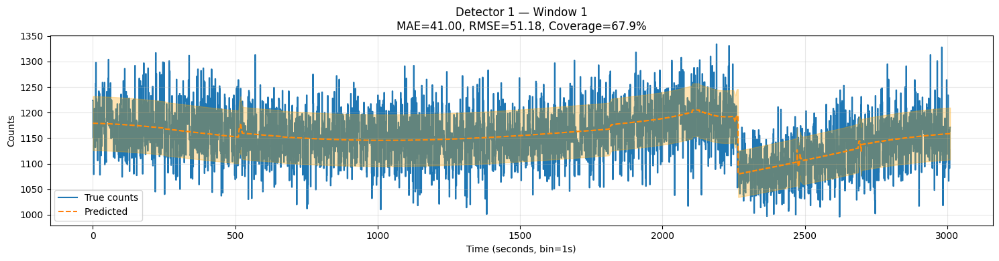


K = 7
R2 score: 0.19877832201826004

MAE per detector:
counts_det_1    41.045259
counts_det_2    40.261902
counts_det_3    32.135343
counts_det_4    32.437194
counts_det_5    32.379108
counts_det_6    31.141735
dtype: float64

RMSE per detector:
counts_det_1    51.081364
counts_det_2    50.258672
counts_det_3    40.114573
counts_det_4    40.781261
counts_det_5    40.283948
counts_det_6    38.675764
dtype: float64

Percentage error: 3.40%
AIC: -1670903.80 | BIC: -1662122.28 | Train loglik: 836521.90
Available windows in interval: 1
Plotting windows:              1


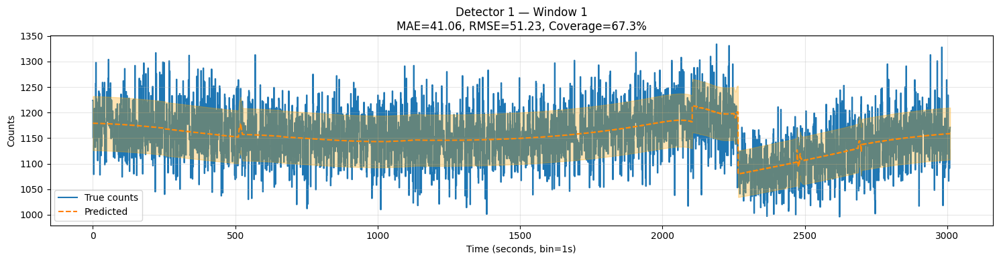


K = 8
R2 score: 0.1985245397804145

MAE per detector:
counts_det_1    41.061303
counts_det_2    40.277391
counts_det_3    32.130005
counts_det_4    32.448371
counts_det_5    32.421151
counts_det_6    31.115695
dtype: float64

RMSE per detector:
counts_det_1    51.059106
counts_det_2    50.271474
counts_det_3    40.117815
counts_det_4    40.778880
counts_det_5    40.342615
counts_det_6    38.664977
dtype: float64

Percentage error: 3.40%
AIC: -1934321.10 | BIC: -1924283.90 | Train loglik: 968383.55
Available windows in interval: 1
Plotting windows:              1


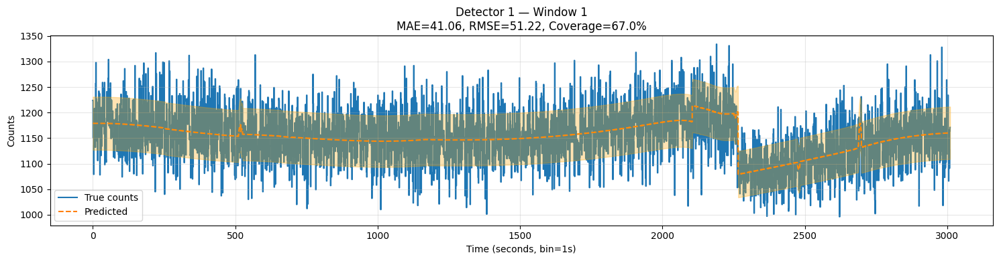


K = 9
R2 score: 0.19871825287137468

MAE per detector:
counts_det_1    41.088287
counts_det_2    40.240734
counts_det_3    32.143554
counts_det_4    32.461238
counts_det_5    32.379557
counts_det_6    31.118441
dtype: float64

RMSE per detector:
counts_det_1    51.093923
counts_det_2    50.247615
counts_det_3    40.126793
counts_det_4    40.778865
counts_det_5    40.300520
counts_det_6    38.662147
dtype: float64

Percentage error: 3.40%
AIC: -2057924.59 | BIC: -2046631.71 | Train loglik: 1030338.29
Available windows in interval: 1
Plotting windows:              1


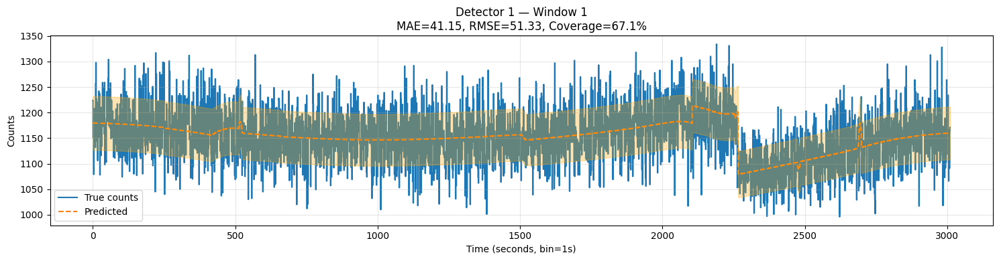


K = 10
R2 score: 0.1984100793052994

MAE per detector:
counts_det_1    41.113266
counts_det_2    40.235793
counts_det_3    32.143936
counts_det_4    32.469894
counts_det_5    32.392775
counts_det_6    31.131935
dtype: float64

RMSE per detector:
counts_det_1    51.119281
counts_det_2    50.238339
counts_det_3    40.119639
counts_det_4    40.791721
counts_det_5    40.315594
counts_det_6    38.672752
dtype: float64

Percentage error: 3.40%
AIC: -2105819.61 | BIC: -2093271.06 | Train loglik: 1054438.81
Available windows in interval: 1
Plotting windows:              1


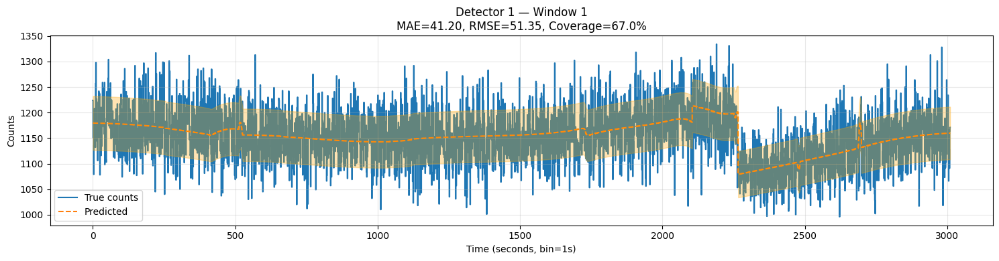

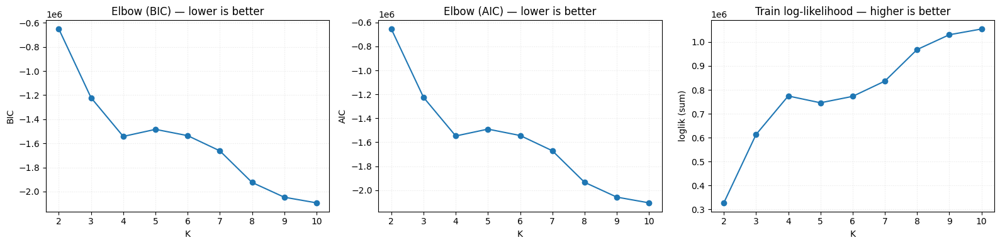

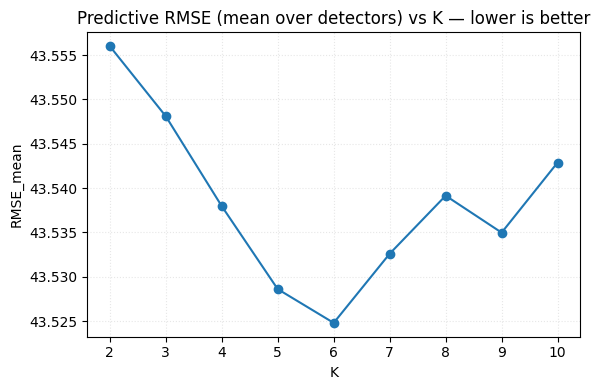

,K,R2,RMSE_mean,MAE_mean,perc_error,BIC,AIC,train_loglik
0,2,0.198072,43.556011,34.923751,0.034026,-6.516467e+05,-6.541499e+05,3.273799e+05
1,3,0.198323,43.548108,34.921247,0.034026,-1.221432e+06,-1.225190e+06,6.130532e+05
2,4,0.198638,43.537962,34.905519,0.034010,-1.542392e+06,-1.547406e+06,7.743140e+05
3,5,0.198971,43.528603,34.910246,0.034016,-1.483944e+06,-1.490214e+06,7.458711e+05
4,6,0.199090,43.524794,34.905127,0.034010,-1.535954e+06,-1.543480e+06,7.726568e+05
5,7,0.198778,43.532597,34.900090,0.034007,-1.662122e+06,-1.670904e+06,8.365219e+05
6,8,0.198525,43.539145,34.908986,0.034015,-1.924284e+06,-1.934321e+06,9.683835e+05
7,9,0.198718,43.534977,34.905302,0.034010,-2.046632e+06,-2.057925e+06,1.030338e+06
8,10,0.198410,43.542887,34.914600,0.034019,-2.093271e+06,-2.105820e+06,1.054439e+06


In [ ]:
# Evaluation Pipeline
res_df = eval_gmr_over_k(
    train_df=train_df,
    X_train_scaled=X_train_scaled,
    X_test_scaled=X_test_scaled,
    y_test_df=y_test_df,
    X_test_contig=X_test_contig,
    y_test_contig=y_test_contig,
    scaler=scaler,
    input_features=input_features,
    target_count_str=target_count_str,
    gmr_predict=gmr_predict,
    pred_and_plot_lc=pred_and_plot_lc,
    k_range=np.arange(2, 11),
    det_plot_idx=1,
    bin_size_sec=1,
    sigma_coef=1,
    num_windows_to_plot=1,
    do_plot_contig=True,
    do_elbow_plot=True,
)

display(res_df[["K","R2","RMSE_mean","MAE_mean","perc_error","BIC","AIC","train_loglik"]])


##### 50ms

###### Loop for different K's

K = 2
R2 score: 0.012923856638528594

MAE per detector:
counts_det_1    9.075558
counts_det_2    9.067933
counts_det_3    7.162486
counts_det_4    7.157364
counts_det_5    7.097447
counts_det_6    6.976409
dtype: float64

RMSE per detector:
counts_det_1    11.360328
counts_det_2    11.344996
counts_det_3     8.951318
counts_det_4     8.955309
counts_det_5     8.884504
counts_det_6     8.733261
dtype: float64

Percentage error: 15.81%
AIC: -3342329.37 | BIC: -3338912.86 | Train loglik: 1671469.69
Available windows in interval: 1
Plotting windows:              1


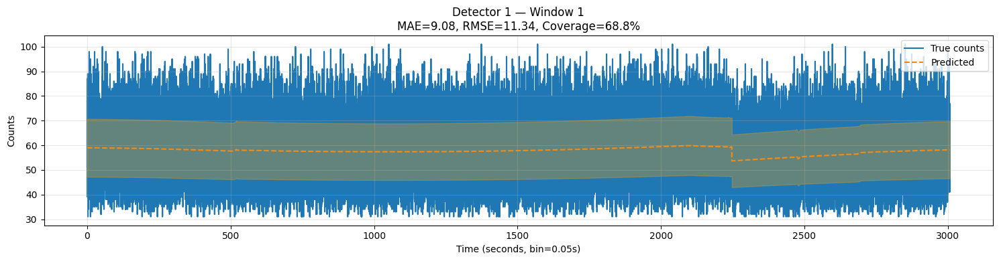


K = 3
R2 score: 0.012906615340271025

MAE per detector:
counts_det_1    9.075648
counts_det_2    9.068014
counts_det_3    7.162353
counts_det_4    7.157482
counts_det_5    7.097433
counts_det_6    6.976497
dtype: float64

RMSE per detector:
counts_det_1    11.360865
counts_det_2    11.345036
counts_det_3     8.951245
counts_det_4     8.955426
counts_det_5     8.884410
counts_det_6     8.733322
dtype: float64

Percentage error: 15.81%
AIC: -9552449.72 | BIC: -9547319.36 | Train loglik: 4776682.86
Available windows in interval: 1
Plotting windows:              1


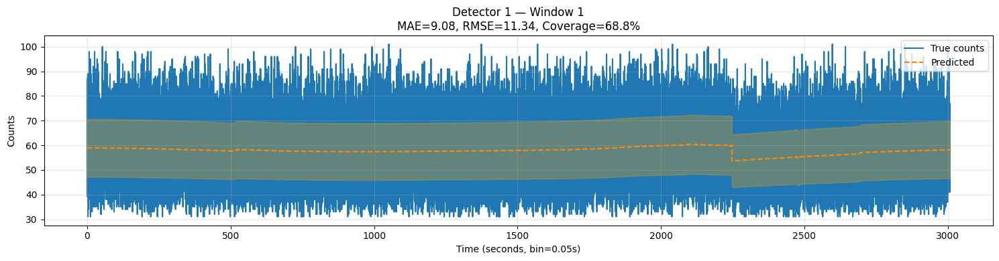


K = 4
R2 score: 0.012897487127517407

MAE per detector:
counts_det_1    9.076102
counts_det_2    9.067659
counts_det_3    7.162376
counts_det_4    7.157407
counts_det_5    7.097405
counts_det_6    6.976481
dtype: float64

RMSE per detector:
counts_det_1    11.361304
counts_det_2    11.344790
counts_det_3     8.951542
counts_det_4     8.955123
counts_det_5     8.884576
counts_det_6     8.733259
dtype: float64

Percentage error: 15.81%
AIC: -16673651.01 | BIC: -16666806.79 | Train loglik: 8337436.50
Available windows in interval: 1
Plotting windows:              1


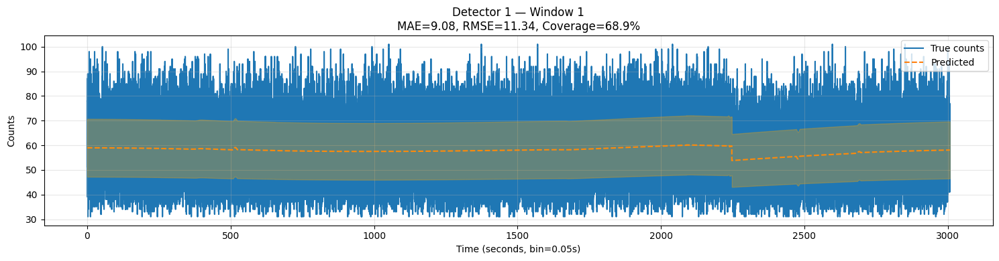


K = 5
R2 score: 0.012952181688165884

MAE per detector:
counts_det_1    9.075471
counts_det_2    9.067711
counts_det_3    7.162469
counts_det_4    7.157062
counts_det_5    7.096947
counts_det_6    6.976682
dtype: float64

RMSE per detector:
counts_det_1    11.360811
counts_det_2    11.344644
counts_det_3     8.951389
counts_det_4     8.954918
counts_det_5     8.883826
counts_det_6     8.733382
dtype: float64

Percentage error: 15.81%
AIC: -21727812.22 | BIC: -21719254.16 | Train loglik: 10864670.11
Available windows in interval: 1
Plotting windows:              1


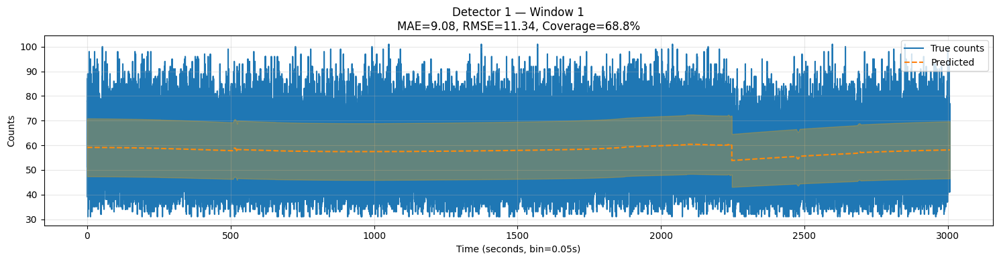


K = 6
R2 score: 0.012903718789376148

MAE per detector:
counts_det_1    9.075676
counts_det_2    9.067883
counts_det_3    7.162431
counts_det_4    7.157316
counts_det_5    7.097146
counts_det_6    6.976618
dtype: float64

RMSE per detector:
counts_det_1    11.361070
counts_det_2    11.344817
counts_det_3     8.951588
counts_det_4     8.955058
counts_det_5     8.884202
counts_det_6     8.733636
dtype: float64

Percentage error: 15.81%
AIC: -24432101.55 | BIC: -24421829.63 | Train loglik: 12216967.78
Available windows in interval: 1
Plotting windows:              1


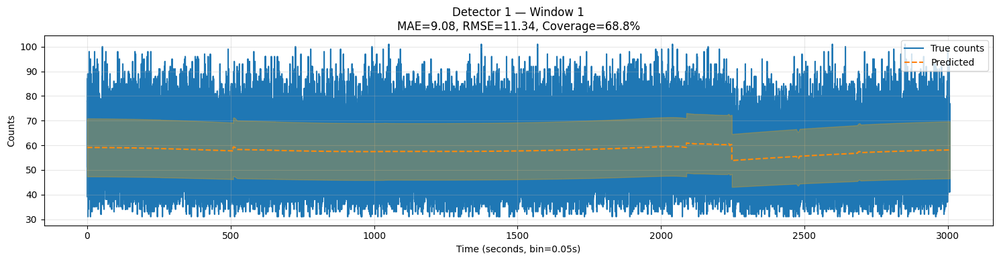


K = 7
R2 score: 0.012972867363231963

MAE per detector:
counts_det_1    9.075303
counts_det_2    9.067025
counts_det_3    7.162084
counts_det_4    7.157219
counts_det_5    7.096656
counts_det_6    6.976625
dtype: float64

RMSE per detector:
counts_det_1    11.360937
counts_det_2    11.343811
counts_det_3     8.951336
counts_det_4     8.954913
counts_det_5     8.883690
counts_det_6     8.733567
dtype: float64

Percentage error: 15.81%
AIC: -26740094.71 | BIC: -26728108.94 | Train loglik: 13371117.36
Available windows in interval: 1
Plotting windows:              1


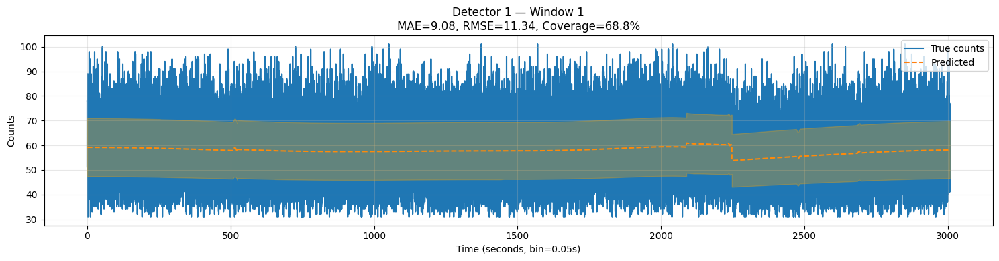


K = 8
R2 score: 0.012931339015813873

MAE per detector:
counts_det_1    9.075677
counts_det_2    9.067749
counts_det_3    7.162462
counts_det_4    7.157019
counts_det_5    7.096665
counts_det_6    6.976951
dtype: float64

RMSE per detector:
counts_det_1    11.360984
counts_det_2    11.344412
counts_det_3     8.951655
counts_det_4     8.954882
counts_det_5     8.883627
counts_det_6     8.733949
dtype: float64

Percentage error: 15.81%
AIC: -28704578.84 | BIC: -28690879.21 | Train loglik: 14353512.42
Available windows in interval: 1
Plotting windows:              1


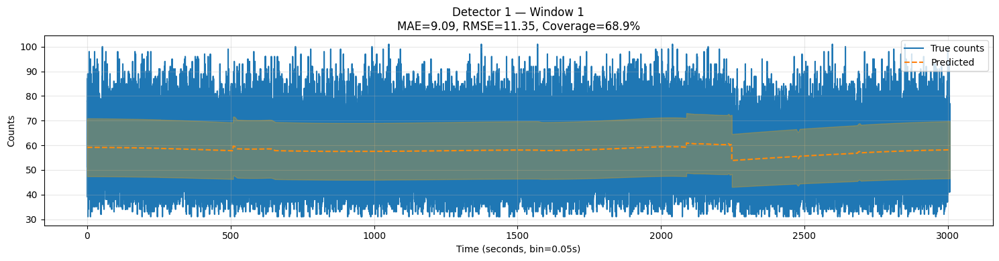


K = 9
R2 score: 0.012930248625283377

MAE per detector:
counts_det_1    9.075969
counts_det_2    9.067694
counts_det_3    7.162481
counts_det_4    7.157064
counts_det_5    7.096651
counts_det_6    6.977036
dtype: float64

RMSE per detector:
counts_det_1    11.361073
counts_det_2    11.344269
counts_det_3     8.951817
counts_det_4     8.954870
counts_det_5     8.883606
counts_det_6     8.733895
dtype: float64

Percentage error: 15.81%
AIC: -31825020.47 | BIC: -31809606.98 | Train loglik: 15913886.23
Available windows in interval: 1
Plotting windows:              1


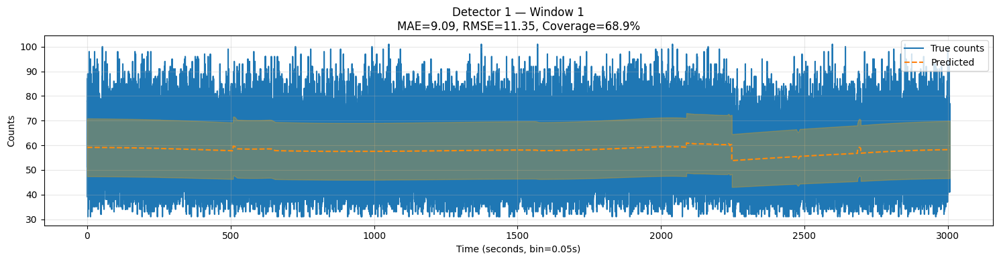


K = 10
R2 score: 0.012915918699489585

MAE per detector:
counts_det_1    9.076042
counts_det_2    9.067705
counts_det_3    7.162637
counts_det_4    7.157050
counts_det_5    7.096754
counts_det_6    6.977084
dtype: float64

RMSE per detector:
counts_det_1    11.361172
counts_det_2    11.344249
counts_det_3     8.951930
counts_det_4     8.954904
counts_det_5     8.883759
counts_det_6     8.733922
dtype: float64

Percentage error: 15.81%
AIC: -33145897.44 | BIC: -33128770.10 | Train loglik: 16574477.72
Available windows in interval: 1
Plotting windows:              1


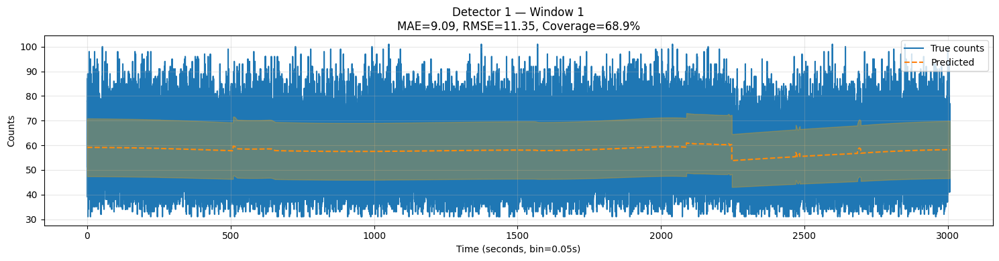

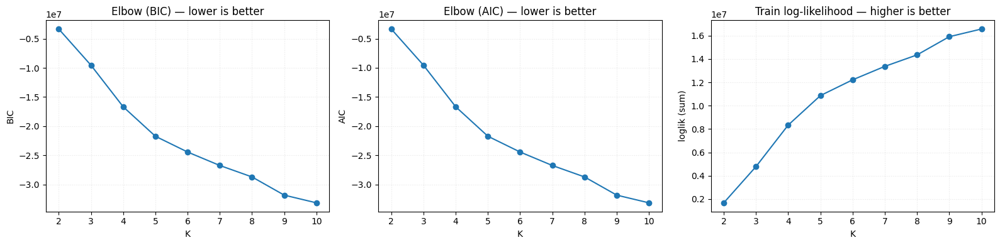

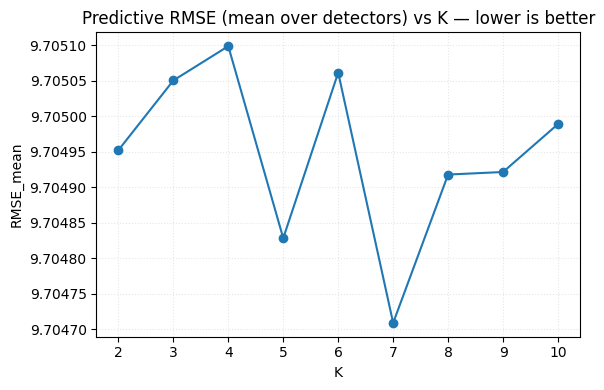

,K,R2,RMSE_mean,MAE_mean,perc_error,BIC,AIC,train_loglik
0,2,0.012924,9.704952,7.756200,0.158107,-3.338913e+06,-3.342329e+06,1.671470e+06
1,3,0.012907,9.705051,7.756238,0.158107,-9.547319e+06,-9.552450e+06,4.776683e+06
2,4,0.012897,9.705099,7.756239,0.158107,-1.666681e+07,-1.667365e+07,8.337437e+06
3,5,0.012952,9.704828,7.756057,0.158103,-2.171925e+07,-2.172781e+07,1.086467e+07
4,6,0.012904,9.705062,7.756178,0.158105,-2.442183e+07,-2.443210e+07,1.221697e+07
5,7,0.012973,9.704709,7.755819,0.158098,-2.672811e+07,-2.674009e+07,1.337112e+07
6,8,0.012931,9.704918,7.756087,0.158103,-2.869088e+07,-2.870458e+07,1.435351e+07
7,9,0.012930,9.704922,7.756149,0.158104,-3.180961e+07,-3.182502e+07,1.591389e+07
8,10,0.012916,9.704989,7.756212,0.158106,-3.312877e+07,-3.314590e+07,1.657448e+07


In [ ]:
def eval_gmr_over_k(
    train_df,
    X_train_scaled,
    X_test_scaled,
    y_test_df,
    X_test_contig,
    y_test_contig,
    scaler,
    input_features,
    target_count_str,
    gmr_predict,
    pred_and_plot_lc,
    k_range=np.arange(2, 11),
    det_plot_idx=1,
    bin_size_sec=0.05,
    sigma_coef=1,
    num_windows_to_plot=1,
    do_plot_contig=True,
    do_elbow_plot=True,
):
    """
    Loop over K components, fit GMM, run GMR prediction, evaluate metrics, and plot elbow curves.
    Keeps variable names/logic aligned with your pipeline.
    """

    # --- containers ---
    results = []
    aic_list, bic_list, ll_list, k_list = [], [], [], []

    # needed by your gmr_predict call
    d = X_train_scaled.shape[1]

    # (your targets are in log-space, so invert once per K)
    y_test_true = np.exp(y_test_df)

    for k in k_range:
        print(f"K = {k}")
        gmm = GaussianMixture(n_components=k, random_state=42)
        gmm.fit(train_df)

        # --- information criteria / loglik for elbow ---
        # log-likelihood on training (average log prob * N)
        ll = gmm.score(train_df) * len(train_df)
        aic = gmm.aic(train_df)
        bic = gmm.bic(train_df)

        k_list.append(k)
        ll_list.append(ll)
        aic_list.append(aic)
        bic_list.append(bic)

        # --- predict on random test ---
        y_pred_log, y_var_log = gmr_predict(
            gmm,
            X_test_scaled,
            d=d,
            target_dim=6,
        )

        # lognormal moment-matching (same as your code)
        y_pred = np.exp(y_pred_log + 0.5 * y_var_log)
        y_var = (np.exp(y_var_log) - 1) * np.exp(2 * y_pred_log + y_var_log)

        # --- metrics on random test ---
        rmse = np.sqrt(np.mean((y_test_true - y_pred) ** 2, axis=0))
        mae = np.mean(np.abs(y_test_true - y_pred), axis=0)
        r2 = r2_score(y_test_true, y_pred, multioutput="uniform_average")
        perc_error = np.mean(np.abs(y_test_true - y_pred) / y_test_true)

        print(f"R2 score: {r2}\n")
        print(f"MAE per detector:\n{mae}\n")
        print(f"RMSE per detector:\n{rmse}\n")
        print(f"Percentage error: {perc_error*100:.2f}%")
        print(f"AIC: {aic:.2f} | BIC: {bic:.2f} | Train loglik: {ll:.2f}")

        # save row
        results.append({
            "K": int(k),
            "R2": float(r2),
            "perc_error": float(perc_error),
            "AIC": float(aic),
            "BIC": float(bic),
            "train_loglik": float(ll),
            # store averages + per-detector metrics
            "MAE_mean": float(np.mean(mae)),
            "RMSE_mean": float(np.mean(rmse)),
            "MAE_per_det": mae,
            "RMSE_per_det": rmse,
        })

        # --- predict on contiguous test and plot ---
        if do_plot_contig:
            pred_and_plot_lc(
                X_test_contig,
                y_test_contig,
                det_idx=det_plot_idx,
                timesteps=len(X_test_scaled),
                gmm=gmm,
                scaler=scaler,
                input_features=input_features,
                target_count_str=target_count_str,
                bin_size_sec=bin_size_sec,
                sigma_coef=sigma_coef,
                num_windows_to_plot=num_windows_to_plot,
            )

        print()

    # --- results dataframe ---
    res_df = pd.DataFrame(results)

    # --- elbow plots ---
    if do_elbow_plot:
        fig, ax = plt.subplots(1, 3, figsize=(16, 4))

        ax[0].plot(k_list, bic_list, marker="o")
        ax[0].set_title("Elbow (BIC) — lower is better")
        ax[0].set_xlabel("K")
        ax[0].set_ylabel("BIC")
        ax[0].grid(alpha=0.3, linestyle=":")

        ax[1].plot(k_list, aic_list, marker="o")
        ax[1].set_title("Elbow (AIC) — lower is better")
        ax[1].set_xlabel("K")
        ax[1].set_ylabel("AIC")
        ax[1].grid(alpha=0.3, linestyle=":")

        ax[2].plot(k_list, ll_list, marker="o")
        ax[2].set_title("Train log-likelihood — higher is better")
        ax[2].set_xlabel("K")
        ax[2].set_ylabel("loglik (sum)")
        ax[2].grid(alpha=0.3, linestyle=":")

        plt.tight_layout()
        plt.show()

        # also plot predictive metric vs K (super utile)
        plt.figure(figsize=(6,4))
        plt.plot(res_df["K"], res_df["RMSE_mean"], marker="o")
        plt.title("Predictive RMSE (mean over detectors) vs K — lower is better")
        plt.xlabel("K")
        plt.ylabel("RMSE_mean")
        plt.grid(alpha=0.3, linestyle=":")
        plt.tight_layout()
        plt.show()

    return res_df


res_df = eval_gmr_over_k(
    train_df=train_df,
    X_train_scaled=X_train_scaled,
    X_test_scaled=X_test_scaled,
    y_test_df=y_test_df,
    X_test_contig=X_test_contig,
    y_test_contig=y_test_contig,
    scaler=scaler,
    input_features=input_features,
    target_count_str=target_count_str,
    gmr_predict=gmr_predict,
    pred_and_plot_lc=pred_and_plot_lc,
    k_range=np.arange(2, 11),
    det_plot_idx=1,
    bin_size_sec=0.05,
    sigma_coef=1,
    num_windows_to_plot=1,
    do_plot_contig=True,
    do_elbow_plot=True,
)

display(res_df[["K","R2","RMSE_mean","MAE_mean","perc_error","BIC","AIC","train_loglik"]])


> Although information criteria keep improving with the number of components, predictive performance saturates around `K=4`. Since larger values yield only marginal gains while increasing model complexity, we select `K=4` as the best trade-off between accuracy and robustness.

##### Training with the best K

In [ ]:
# Training with best k
best_k = 5
gmm = GaussianMixture(n_components=best_k, random_state=42)
gmm.fit(train_df) # 1) fit on the chosen k

# predict on rnd test test
d = X_train_scaled.shape[1] # input features
y_pred_log, y_var_log = gmr_predict(
    gmm,
    X_test_scaled,
    d=d,
    target_dim=6, # output: n_det
)
y_pred = np.exp(y_pred_log + 0.5 * y_var_log)
y_var = (np.exp(y_var_log) - 1) * np.exp(2 * y_pred_log + y_var_log)
y_test_true = np.exp(y_test_df)

window lenght: 4782
Detector bgo_z1
Selected interval: 829s → 5611s
Corresponding indices: 829 → 5611
Available windows in interval: 1
Plotting windows:              1


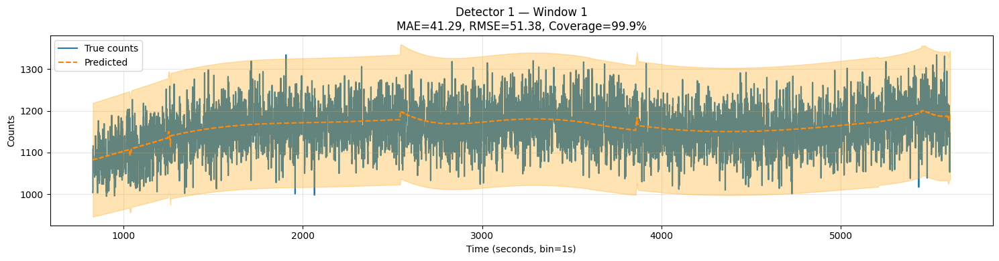

Detector bgo_z0
Selected interval: 829s → 5611s
Corresponding indices: 829 → 5611
Available windows in interval: 1
Plotting windows:              1


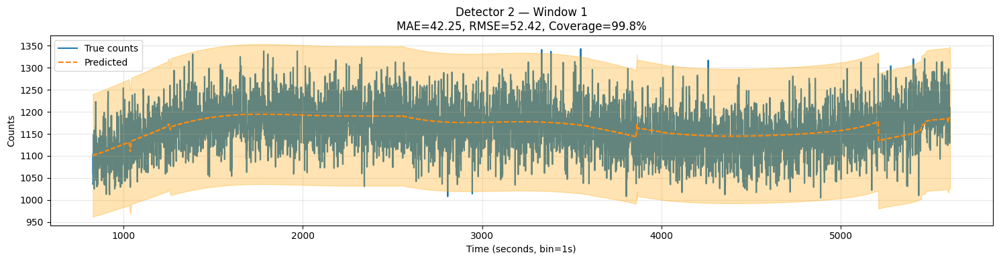

Detector bgo_x1
Selected interval: 829s → 5611s
Corresponding indices: 829 → 5611
Available windows in interval: 1
Plotting windows:              1


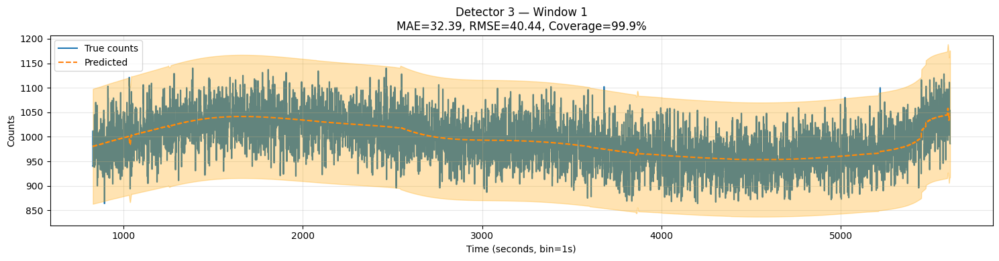

Detector bgo_x0
Selected interval: 829s → 5611s
Corresponding indices: 829 → 5611
Available windows in interval: 1
Plotting windows:              1


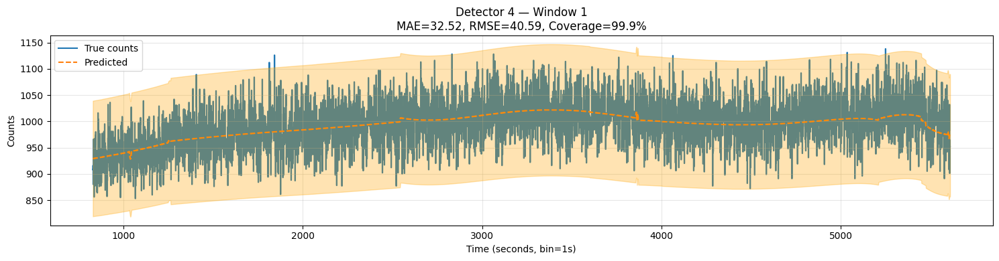

Detector bgo_y1
Selected interval: 829s → 5611s
Corresponding indices: 829 → 5611
Available windows in interval: 1
Plotting windows:              1


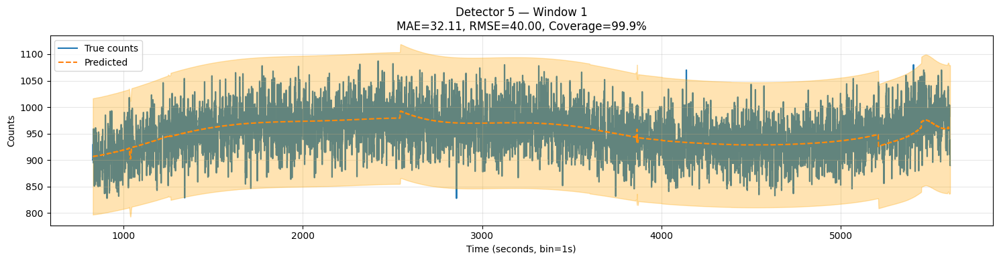

Detector bgo_y0
Selected interval: 829s → 5611s
Corresponding indices: 829 → 5611
Available windows in interval: 1
Plotting windows:              1


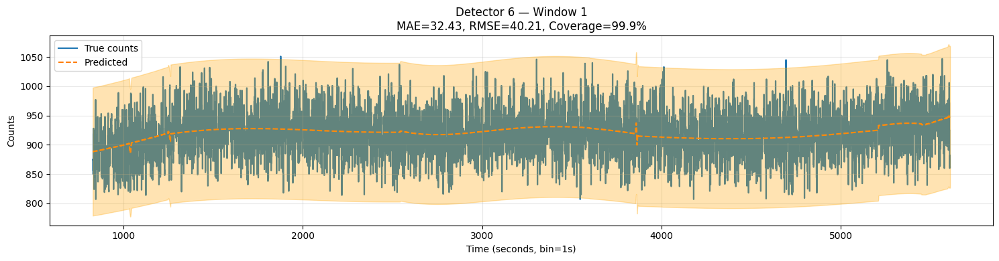

In [ ]:
# predict and plot on the selected contiguous suspiciuous interval
start_orbit = 829
end_orbit = 5611
interval = end_orbit - start_orbit
print("window lenght:", interval)
for det_idx in range(6):
  det = det_names[f"det_{det_idx+1}"]
  print(f"Detector {det}")
  pred_and_plot_lc(X_test_viz, y_test_viz, det_idx=det_idx+1, timesteps=interval,
                  gmm=gmm, sigma_coef=3, scaler=scaler, input_features=input_features,
                  target_count_str=target_count_str, bin_size_sec=1, num_windows_to_plot=10,
                  time_interval = (start_orbit, end_orbit))

> The Skew-Normal regressor exhibits higher local variability because it fits a single asymmetric distribution per window, whereas the Gaussian Mixture Regression produces a more stable estimate by averaging over latent background regimes; this makes GMR more suitable as a background baseline for anomaly detection.

##### Tests with residuals

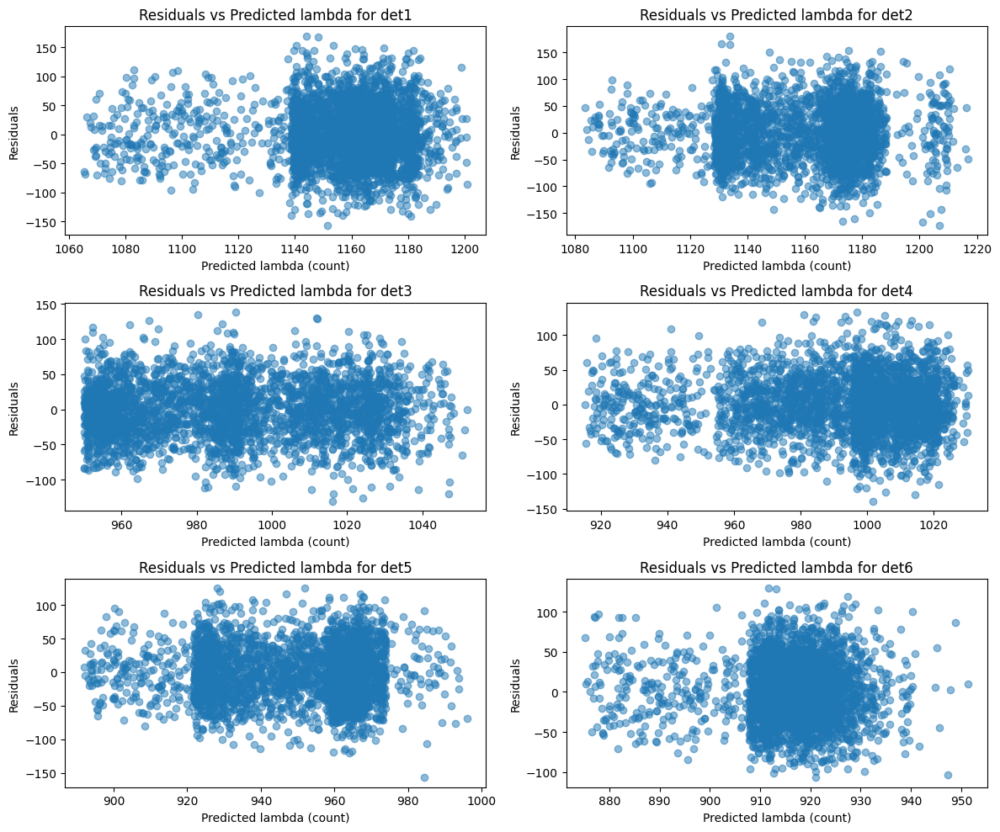

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(12, 10))

for det_idx in range(n_detectors):
  residuals = y_test_true[f"{target_count_str}{det_idx+1}"].values - y_pred[:, det_idx]
  row, col = divmod(det_idx, 2)
  ax[row, col].scatter(y_pred[:, det_idx], residuals, alpha=0.5)
  ax[row, col].set_xlabel("Predicted lambda (count)")
  ax[row, col].set_ylabel("Residuals")
  ax[row, col].set_title(f"Residuals vs Predicted lambda for det{det_idx+1}")

plt.tight_layout()
plt.show()

(3011, 6)


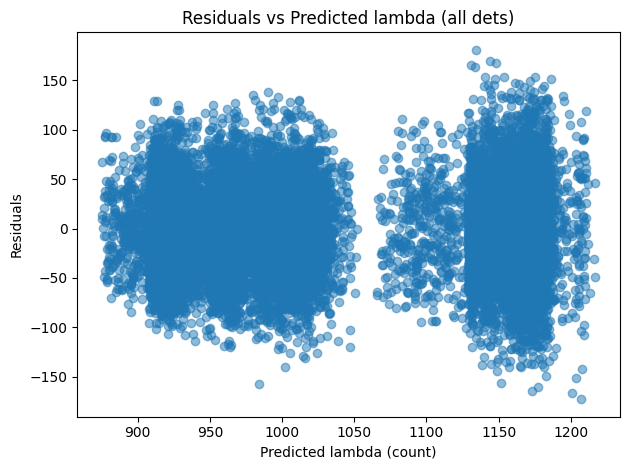

In [ ]:
residuals = y_test_true - y_pred
print(residuals.shape)
plt.scatter(y_pred, residuals, alpha=0.5)
plt.xlabel("Predicted lambda (count)")
plt.ylabel("Residuals")
plt.title(f"Residuals vs Predicted lambda (all dets)")

plt.tight_layout()
plt.show()

> The plot above clearly shows the two clusters given by the different count rates distributions of the detectors.

#### Saving / loading model

In [ ]:
import joblib

In [ ]:
# saving
joblib.dump(
    {
        "gmm": gmm,
        "best_k": best_k,
        "target_dim": 6,
        "n_input_features": d
    },
    "/content/drive/MyDrive/Colab Notebooks/Internship + Thesis/models/gmr_background.joblib"
)

In [ ]:
# loading
ckpt = joblib.load("/content/drive/MyDrive/Colab Notebooks/Internship + Thesis/models/gmr_background.joblib")

gmm = ckpt["gmm"]
best_k = ckpt["best_k"]
d = ckpt["n_input_features"]

#### A home-made interpretability process
There is a strange peak around 530s, as we can easily see from the plots above. It may regard a change in the orbit, as we can notice if we analyze the lightcurve at around 2300s. We analyze this because the sharp change in the predicted background signal for this small intervall isn't visually justified just by looking at the count rate light curve, that doesn't seem to have sharp differences in its local neighborhood.

In [ ]:
# Analyzing the strange peak at around 520s
print(X_test_contig.shape)
display(X_test_contig.iloc[520:550])

(3344, 10)


,altitude(km),Earth_lon_sin,Earth_lon_cos,z_lon_sin,z_lon_cos,x_lon_sin,x_lon_cos,Earth_lat_sin,z_lat_sin,x_lat_sin
39069,523.976366,0.155606,-0.987819,-0.144224,-0.989545,0.985681,0.168621,-0.000003,0.003531,0.999978
39070,523.974141,0.154596,-0.987978,-0.144685,-0.989478,0.929255,0.369438,-0.000003,0.004357,0.999976
39071,523.971916,0.153586,-0.988135,-0.145145,-0.989410,0.832396,0.554181,-0.000003,0.005184,0.999974
39072,523.969691,0.152575,-0.988292,-0.145605,-0.989343,0.699318,0.714810,-0.000003,0.006011,0.999971
39073,523.967465,0.151565,-0.988447,-0.146066,-0.989275,0.535812,0.844337,-0.000003,0.006838,0.999969
39074,523.965240,0.150554,-0.988602,-0.146526,-0.989207,0.348992,0.937126,-0.000003,0.007665,0.999966
39077,523.958666,0.147521,-0.989059,-0.147898,-0.989003,0.147898,0.989003,-0.000003,0.010151,0.999948
39078,523.956492,0.146510,-0.989209,-0.148353,-0.988934,0.148353,0.988934,-0.000003,0.010980,0.999940
39079,523.954318,0.145498,-0.989359,-0.148809,-0.988866,0.148809,0.988866,-0.000003,0.011809,0.999930
39080,523.952144,0.144486,-0.989507,-0.149265,-0.988797,0.149265,0.988797,-0.000003,0.012639,0.999920


In [ ]:
satellite_data_dict["1s"].loc[(satellite_data_dict["1s"].index >= 39070) & (satellite_data_dict["1s"].index <= 39095)]

,timestamp,altitude(km),Earth_lon_sin,Earth_lon_cos,z_lon_sin,z_lon_cos,x_lon_sin,x_lon_cos,Earth_lat_sin,z_lat_sin,x_lat_sin,counts_det_1,counts_det_2,counts_det_3,counts_det_4,counts_det_5,counts_det_6
39070,2025-01-01 22:51:10,523.974141,0.154596,-0.987978,-0.144685,-0.989478,0.929255,0.369438,-0.000003,0.004357,0.999976,1161.0,1169.0,960.0,980.0,949.0,922.0
39071,2025-01-01 22:51:11,523.971916,0.153586,-0.988135,-0.145145,-0.989410,0.832396,0.554181,-0.000003,0.005184,0.999974,1139.0,1154.0,914.0,1029.0,902.0,881.0
39072,2025-01-01 22:51:12,523.969691,0.152575,-0.988292,-0.145605,-0.989343,0.699318,0.714810,-0.000003,0.006011,0.999971,1140.0,1079.0,990.0,1054.0,973.0,934.0
39073,2025-01-01 22:51:13,523.967465,0.151565,-0.988447,-0.146066,-0.989275,0.535812,0.844337,-0.000003,0.006838,0.999969,1077.0,1105.0,963.0,1004.0,993.0,892.0
39074,2025-01-01 22:51:14,523.965240,0.150554,-0.988602,-0.146526,-0.989207,0.348992,0.937126,-0.000003,0.007665,0.999966,1222.0,1123.0,1006.0,1095.0,1002.0,967.0
39077,2025-01-01 22:51:17,523.958666,0.147521,-0.989059,-0.147898,-0.989003,0.147898,0.989003,-0.000003,0.010151,0.999948,1154.0,1141.0,969.0,1059.0,958.0,960.0
39078,2025-01-01 22:51:18,523.956492,0.146510,-0.989209,-0.148353,-0.988934,0.148353,0.988934,-0.000003,0.010980,0.999940,1095.0,1172.0,935.0,953.0,951.0,888.0
39079,2025-01-01 22:51:19,523.954318,0.145498,-0.989359,-0.148809,-0.988866,0.148809,0.988866,-0.000003,0.011809,0.999930,1152.0,1188.0,955.0,991.0,888.0,862.0
39080,2025-01-01 22:51:20,523.952144,0.144486,-0.989507,-0.149265,-0.988797,0.149265,0.988797,-0.000003,0.012639,0.999920,1158.0,1184.0,1009.0,1046.0,957.0,938.0
39081,2025-01-01 22:51:21,523.949969,0.143475,-0.989654,-0.149720,-0.988728,0.149720,0.988728,-0.000003,0.013468,0.999909,1180.0,1151.0,891.0,1034.0,895.0,873.0


In [ ]:
satellite_data_1s_ang.loc[(satellite_data_1s_ang["timestamp"] >= "2025-01-01 22:51:10") & (satellite_data_1s_ang["timestamp"] < "2025-01-01 22:51:35")]

,timestamp,altitude(km),Earth_lon_sin,Earth_lon_cos,z_lon_sin,z_lon_cos,x_lon_sin,x_lon_cos,Earth_lat_sin,z_lat_sin,x_lat_sin,counts_det_1,counts_det_2,counts_det_3,counts_det_4,counts_det_5,counts_det_6
82270,2025-01-01 22:51:10,523.974141,0.154596,-0.987978,-0.144685,-0.989478,0.929255,0.369438,-0.000003,0.004357,0.999976,1161.0,1169.0,960.0,980.0,949.0,922.0
82271,2025-01-01 22:51:11,523.971916,0.153586,-0.988135,-0.145145,-0.989410,0.832396,0.554181,-0.000003,0.005184,0.999974,1139.0,1154.0,914.0,1029.0,902.0,881.0
82272,2025-01-01 22:51:12,523.969691,0.152575,-0.988292,-0.145605,-0.989343,0.699318,0.714810,-0.000003,0.006011,0.999971,1140.0,1079.0,990.0,1054.0,973.0,934.0
82273,2025-01-01 22:51:13,523.967465,0.151565,-0.988447,-0.146066,-0.989275,0.535812,0.844337,-0.000003,0.006838,0.999969,1077.0,1105.0,963.0,1004.0,993.0,892.0
82274,2025-01-01 22:51:14,523.965240,0.150554,-0.988602,-0.146526,-0.989207,0.348992,0.937126,-0.000003,0.007665,0.999966,1222.0,1123.0,1006.0,1095.0,1002.0,967.0
82275,2025-01-01 22:51:15,523.963015,0.149543,-0.988755,-0.146986,-0.989139,0.146986,0.989139,-0.000003,0.008492,0.999964,1217.0,1228.0,932.0,1064.0,1037.0,941.0
82276,2025-01-01 22:51:16,523.960841,0.148532,-0.988908,-0.147442,-0.989071,0.147442,0.989071,-0.000003,0.009321,0.999957,1177.0,1185.0,993.0,1013.0,919.0,930.0
82277,2025-01-01 22:51:17,523.958666,0.147521,-0.989059,-0.147898,-0.989003,0.147898,0.989003,-0.000003,0.010151,0.999948,1154.0,1141.0,969.0,1059.0,958.0,960.0
82278,2025-01-01 22:51:18,523.956492,0.146510,-0.989209,-0.148353,-0.988934,0.148353,0.988934,-0.000003,0.010980,0.999940,1095.0,1172.0,935.0,953.0,951.0,888.0
82279,2025-01-01 22:51:19,523.954318,0.145498,-0.989359,-0.148809,-0.988866,0.148809,0.988866,-0.000003,0.011809,0.999930,1152.0,1188.0,955.0,991.0,888.0,862.0


In [ ]:
sus_df = satellite_data_15s_ang.loc[(satellite_data_15s_ang["timestamp"] >= "2025-01-01 22:51:00") & (satellite_data_15s_ang["timestamp"] < "2025-01-01 22:52:00")]
display(sus_df)
sus_df

,timestamp,altitude(km),Earth_lon_sin,Earth_lon_cos,z_lon_sin,z_lon_cos,x_lon_sin,x_lon_cos,Earth_lat_sin,z_lat_sin,x_lat_sin,counts_det_1,counts_det_2,counts_det_3,counts_det_4,counts_det_5,counts_det_6
5484,2025-01-01 22:51:00,523.996393,0.164689,-0.986345,-0.140078,-0.990140,-0.140078,-0.990140,-0.000003,-0.003911,0.999992,17391.0,17126.0,14621.0,15254.0,14409.0,13787.0
5485,2025-01-01 22:51:15,523.963015,0.149543,-0.988755,-0.146986,-0.989139,0.146986,0.989139,-0.000003,0.008492,0.999964,17142.0,17145.0,14219.0,15176.0,14078.0,13596.0
5486,2025-01-01 22:51:30,523.930401,0.134362,-0.990932,-0.153819,-0.988099,0.153819,0.988099,-0.000003,0.020933,0.999781,17405.0,17247.0,14768.0,15202.0,14296.0,13953.0
5487,2025-01-01 22:51:45,523.898560,0.119148,-0.992876,-0.160577,-0.987023,0.160577,0.987023,-0.000003,0.033409,0.999442,17235.0,17022.0,14649.0,14961.0,13973.0,13517.0


,timestamp,altitude(km),Earth_lon_sin,Earth_lon_cos,z_lon_sin,z_lon_cos,x_lon_sin,x_lon_cos,Earth_lat_sin,z_lat_sin,x_lat_sin,counts_det_1,counts_det_2,counts_det_3,counts_det_4,counts_det_5,counts_det_6
5484,2025-01-01 22:51:00,523.996393,0.164689,-0.986345,-0.140078,-0.990140,-0.140078,-0.990140,-0.000003,-0.003911,0.999992,17391.0,17126.0,14621.0,15254.0,14409.0,13787.0
5485,2025-01-01 22:51:15,523.963015,0.149543,-0.988755,-0.146986,-0.989139,0.146986,0.989139,-0.000003,0.008492,0.999964,17142.0,17145.0,14219.0,15176.0,14078.0,13596.0
5486,2025-01-01 22:51:30,523.930401,0.134362,-0.990932,-0.153819,-0.988099,0.153819,0.988099,-0.000003,0.020933,0.999781,17405.0,17247.0,14768.0,15202.0,14296.0,13953.0
5487,2025-01-01 22:51:45,523.898560,0.119148,-0.992876,-0.160577,-0.987023,0.160577,0.987023,-0.000003,0.033409,0.999442,17235.0,17022.0,14649.0,14961.0,13973.0,13517.0


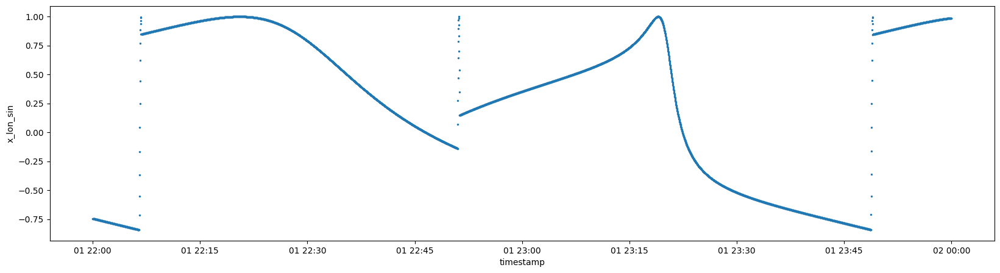

In [ ]:
sus_dff = satellite_data_1s_ang.loc[(satellite_data_1s_ang["timestamp"] >= "2025-01-01 22:00:00")]
sus_dff.plot.scatter(x='timestamp', y="x_lon_sin", s=2, figsize=(20, 5))
plt.show()

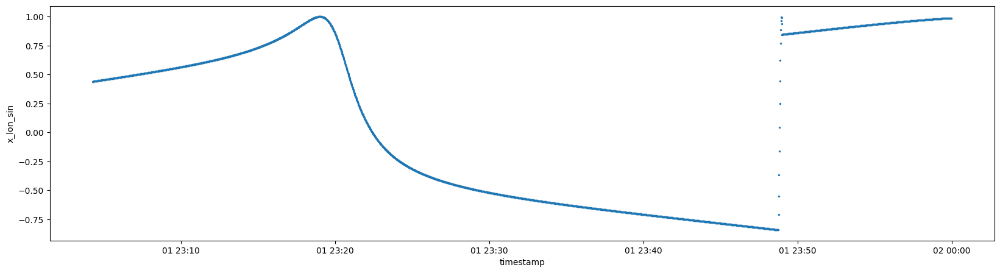

In [ ]:
sus_dff = satellite_data_1s_ang[-len(X_test_contig):]
sus_dff.plot.scatter(x='timestamp', y="x_lon_sin", s=2, figsize=(20, 5))
plt.show()

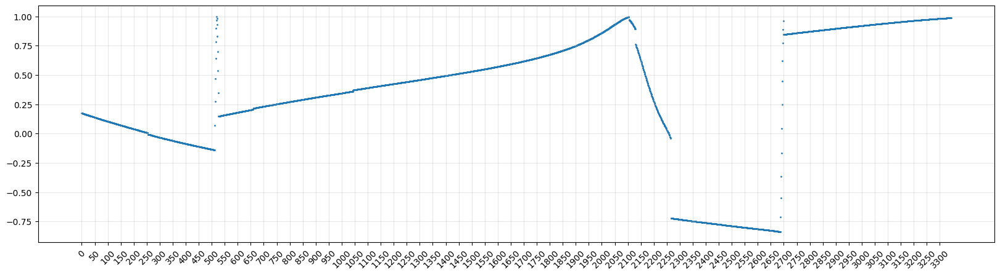

In [ ]:
plt.figure(figsize=(20, 5))
plt.scatter(np.arange(0, len(X_test_contig)), X_test_contig["x_lon_sin"], s=1)
plt.xticks(np.arange(0, len(X_test_contig), 50), rotation=45)
plt.grid(alpha=0.3)
plt.show()

Selected interval: 2650s → 2750s
Corresponding indices: 2650 → 2750
Available windows in interval: 1
Plotting windows:              1


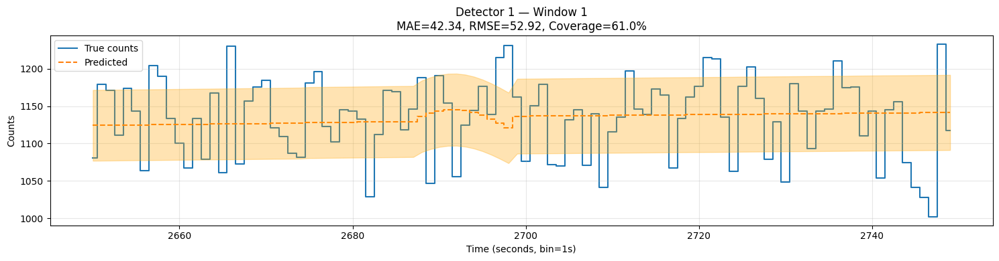

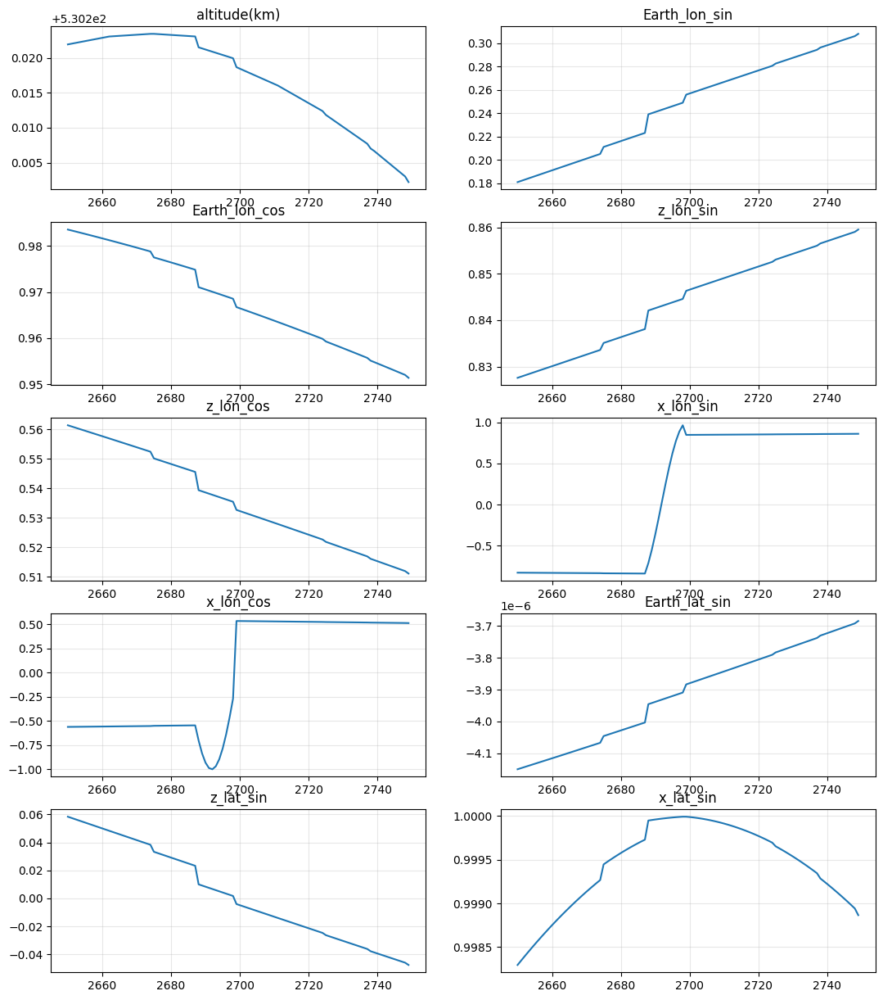

In [ ]:
pred_and_plot_lc(X_test_contig, y_test_contig, det_idx=1, timesteps=100,
                 gmm=gmm, sigma_coef=1, scaler=scaler, input_features=input_features,
                 target_count_str=target_count_str, bin_size_sec=1, num_windows_to_plot=8,
                 time_interval = (2650, 2750))

# print the sus input values
ncols=2
nrows=5
fig, ax = plt.subplots(ncols=ncols, nrows=nrows, figsize=(13, 15))
sus_data = X_test_contig.iloc[2650:2750]

for i, feature_name in enumerate(sus_data.columns):
  row, sub_col = divmod(i, ncols)
  ax[row, sub_col].plot(np.arange(2650, 2750), sus_data[feature_name])
  ax[row, sub_col].set_title(feature_name)
  ax[row, sub_col].grid(alpha=0.3)

Selected interval: 510s → 530s
Corresponding indices: 510 → 530
Available windows in interval: 1
Plotting windows:              1


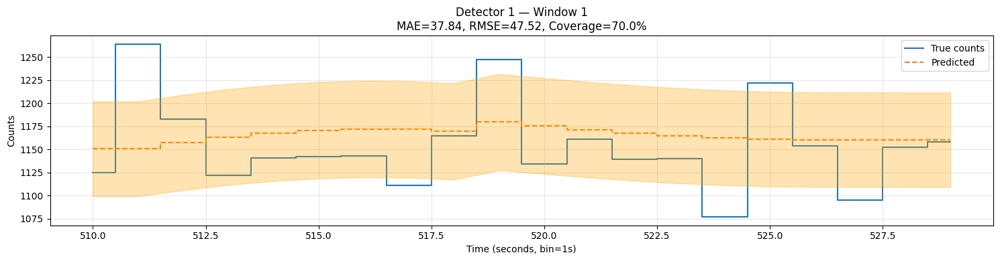

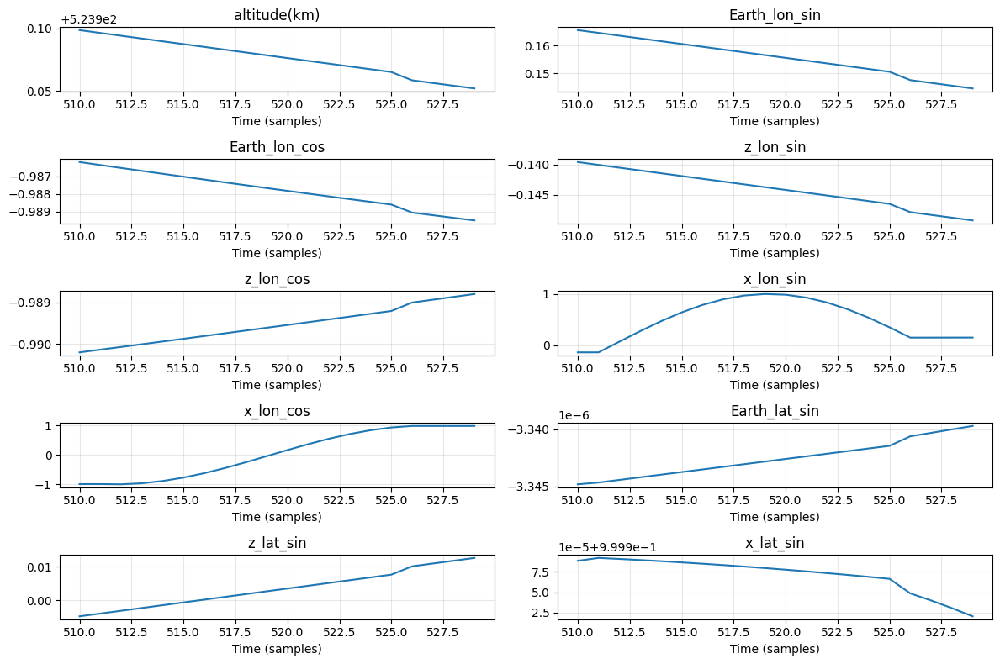

In [ ]:
pred_and_plot_lc(X_test_contig, y_test_contig, det_idx=1, timesteps=20,
                 gmm=gmm, sigma_coef=1, scaler=scaler, input_features=input_features,
                 target_count_str=target_count_str, bin_size_sec=1, num_windows_to_plot=1,
                 time_interval = (510, 530))

# print the sus input values
ncols=2
nrows=5
fig, ax = plt.subplots(ncols=ncols, nrows=nrows, figsize=(12, 8))
sus_data = X_test_contig.iloc[510:530]

for i, feature_name in enumerate(sus_data.columns):
  row, sub_col = divmod(i, ncols)
  ax[row, sub_col].plot(np.arange(510, 530), sus_data[feature_name])
  ax[row, sub_col].set_title(feature_name)
  ax[row, sub_col].grid(alpha=0.3)
  ax[row, sub_col].set_xlabel("Time (samples)")

plt.tight_layout()

#### Sparse considerations
* We found out that the little bump was due to a change in the orbit. We figured it out by analyzing the raw data before any kind of preprocessing (outliers removal, interpolation etc), in particular focusing on the "x_lon" feature, the one that changed the most between the two consecutive orbits.
* We also showed how our model behaves in different "critic" situations, namely where there are sharp discontinuties due to orbital changes or zero/outliers removal
* Then, we have understood that we must consider two kind of contiguous dataset, to enhance our evaluation pipeline:
  * a *single-orbit* set, to diagnose physical consistency;
  * a *multi-orbit* set, to test robustness to orbital transitions

#### SHAP: Interpretability

In [ ]:
import shap

In [ ]:
def gmr_predict_mean(gmm, X, d):
  mu_log, var_log = gmr_predict(gmm, X, d, target_dim=6)
  mu = np.exp(mu_log + 0.5 * var_log)
  return mu

In [ ]:
# Number of detectors (target_dim)
n_detectors = 6

# Background for SHAP
background = shap.sample(X_train_scaled_df, 100)

# Dictionary to store explainers + shap values
explainers = {}
shap_values = {}

# Loop over detectors
for k in range(n_detectors):
    # Build the explainer for detector k
    explainers[k] = shap.KernelExplainer(
        lambda X, idx=k: gmr_predict_mean(gmm=gmm, X=X, d=d)[:, idx],
        background
    )

    # Compute shap values for the first N samples
    shap_values[k] = explainers[k](X_test_scaled_df[:5])

    print(f"Done: detector {k+1}")

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(12, 10))

for det_idx in range(n_detectors):
  row, col = divmod(det_idx, 2)
  shap.plots.bar(shap_values[det_idx], show=False, max_display=10, ax=ax[row, col])
  ax[row, col].set_title(f"SHAP values for detector {det_idx+1}")
  ax[row, col].set_xlabel("SHAP value")
  ax[row, col].set_ylabel("Feature")

plt.tight_layout()
plt.show()

> We obtain kind of the same results of the previous [barplot](#barplot_sk) for the Skew-Normal regressor. In particular, `z_lat` is still one of the most impactful features; `Earth_lon` acquires much more relative importance; `z_lon` is now lower in the importance hierarchy.


## SHAP **summary**

### **Dominant features and theoretical alignment**
Across all detectors and both models, the same families of features dominate, in the following order:

1.   **Pointing / orientation variables**: `z_lat`, `z_lon`, `x_lat`, `x_lon`
2.   **Orbital position proxies**: `Earth_lon` and much less `Earth_lat`
3. **Altitude**: always marginal

And this is exactly what theory predicts for background photon counts, as pointed out [before](#shapsn).

Indeed, the background signal is driven primarily by:
*   Earth albedo
*   Atmospheric gamma emission
*   Shielding / exposure geometry

All of these depend **far more on pointing and orientation** than on altitude (which changes slowly and weekly over an orbit).

Moreover, as said before, **longitude matters more** than latitude because the longitudinal structure is more variable, where the satellite sweeps longitude quickly.

### **Detector-to-detector differences**

The detector heterogeneity is expected, because each detector:
* has a different physical orientation
* sees a different angle of Earth / sky
* has different shielding area

### **Inter-model differences**
Why do we spot different feature contribution for different model? Which one should we trust? The answer is that they are **explaining different things.**

#### **Skew-Normal SHAP**
In the Skew-Normal regressor, SHAP is implicitly explaining the distribution parameters, which are the location (μ), the scale (σ) and the skewness (α).

This leads to **more balanced** contributions, as we can easily see in this [plot](#shapsn).

This is because SHAP on this model carries on a more local, more conservative explanation.

#### **GMR SHAP**
On the other hand, in the GMR, SHAP is explaining is how feature importance reflects how much a feature changes component assignment and the conditional mean inside each component. Moreover, correlated features tend to share credit in unstable ways.

As a consequence, SHAP values can be larger, as we can see in the plot [above](#shapgmr).
In addition, rankings can shift when multiple correlated features explain the same variance.

#### **Feature correlation**: the elephant in the room
Orientation variables are stongly correlated with orbital position. For example, as we can see [here](#shapsncorr), `z_lon` is correlated with `Earth_lon`.

This means that we have multiple features that carry overlapping information. Indeed, the two models chose **different coordinates** to express the **same physics**.







#### Collinearity issue
SHAP can share feature importance between strongly **correlated** pairs of features. We try to fix collinearity with the **residual** trick:
1. choose the main feature $F$ in a pair $(F, G)$
2. fit a model such that $G ≈ h(F)$
3. substitute G with the residual $R = G - h(F)$

$R$ will now contain just the info of $G$ that are not explainable by $F$.

*(It is just a try, it isn't meant to work).*

In [ ]:
from sklearn.linear_model import LinearRegression

def residual_trick(main_f="z_lon",
                   secondary_f="Earth_lon",
                   train_ds=None, test_ds=None):

  X_train_res = train_ds.copy()

  # Explain 'Earth_lon' by 'z_lon'
  X = X_train_res[[main_f]]      # 2D
  y = X_train_res[secondary_f]    # 1D
  reg = LinearRegression().fit(X, y)

  print("R^2:", reg.score(X, y))
  print("coef:", reg.coef_[0])
  print("intercept:", reg.intercept_)

  # Residual trick
  X_train_res[f"{secondary_f}_res"] = y - reg.predict(X)

  if test_ds is not None:
    X_test_res  = test_ds.copy()
    X_test_res[f"{secondary_f}_res"] = (X_test_res[secondary_f] - reg.predict(X_test_res[[main_f]]))
    return X_train_res, X_test_res

  return X_train_res

# compute residual trick twice
satellite_data_input_rt = residual_trick(
    main_f="x_lat",
    secondary_f="Earth_lat",
    train_ds = satellite_data_dict["15s"])
print()
X_train_res, X_test_res = residual_trick(
    main_f="x_lat",
    secondary_f="Earth_lat",
    train_ds = X_train,
    test_ds = X_test)

> if r^2 approx. near 0 means that we are throwing away info otherwise if r2 > 0.7 then correlation is clearly evident

In [ ]:
plt.figure(figsize=(10, 6))
sns.heatmap(satellite_data_input_rt[input_features+["Earth_lat_res"]].corr(method="spearman"), annot=True)
plt.xticks(rotation=60, ha='right') # Rotate x-ticks by 45 degrees and align to the right
plt.title("Correlation matrix between features")
plt.show()



---



## **Kolmogorov-Arnold** Regressor

In [ ]:
!pip install pykan
from kan import *

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.1/78.1 kB 6.1 MB/s eta 0:00:00


In [ ]:
# load model
ckpt_path = "/content/drive/MyDrive/Colab Notebooks/Internship + Thesis/after_ft/0.1"
model_kan = KAN.loadckpt(ckpt_path)

In [ ]:
# Ensure the directory for storing history files exists
history_dir = './model'
os.makedirs(history_dir, exist_ok=True)

### Training

In [ ]:
# select device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# numpy -> float32
X_train_np = np.asarray(X_train_scaled, dtype=np.float32)
y_train_np = np.asarray(y_train, dtype=np.float32)
X_test_np  = np.asarray(X_test_scaled, dtype=np.float32)
y_test_np  = np.asarray(y_test, dtype=np.float32)

# y must be (N, 6)
# print shapes to be sure
print("X:", X_train_np.shape, "y:", y_train_np.shape)

# tensors on SAME device
X_train_t = torch.as_tensor(X_train_np, device=device)
y_train_t = torch.as_tensor(y_train_np, device=device)
X_test_t  = torch.as_tensor(X_test_np,  device=device)
y_test_t  = torch.as_tensor(y_test_np,  device=device)

dataset = {
    "train_input": X_train_t,
    "train_label": y_train_t,
    "test_input":  X_test_t,
    "test_label":  y_test_t
}

X: (541263, 10) y: (541263, 6)


In [ ]:
print("Feature order:")
for i, f in enumerate(input_features_ang):
    print(f"x_{i:02d} -> {f}")

Feature order (as seen by KAN):
x_00 -> altitude(km)
x_01 -> Earth_lon_sin
x_02 -> Earth_lon_cos
x_03 -> z_lon_sin
x_04 -> z_lon_cos
x_05 -> x_lon_sin
x_06 -> x_lon_cos
x_07 -> Earth_lat_sin
x_08 -> z_lat_sin
x_09 -> x_lat_sin


In [ ]:
# create a KAN: 7D inputs, 6 outputs, and H hidden neurons, cubic spline (k=3), grid intervals (grid=5).
model_kan = KAN(
            width=[len(input_features), 10, 6],  # input → output, no hidden layer
            grid=5,                             # number of spline grid intervals
            k=3,                                 # spline order (cubic) (try 4)
            device="cuda",
            seed=42
        )

checkpoint directory created: ./model
saving model version 0.0


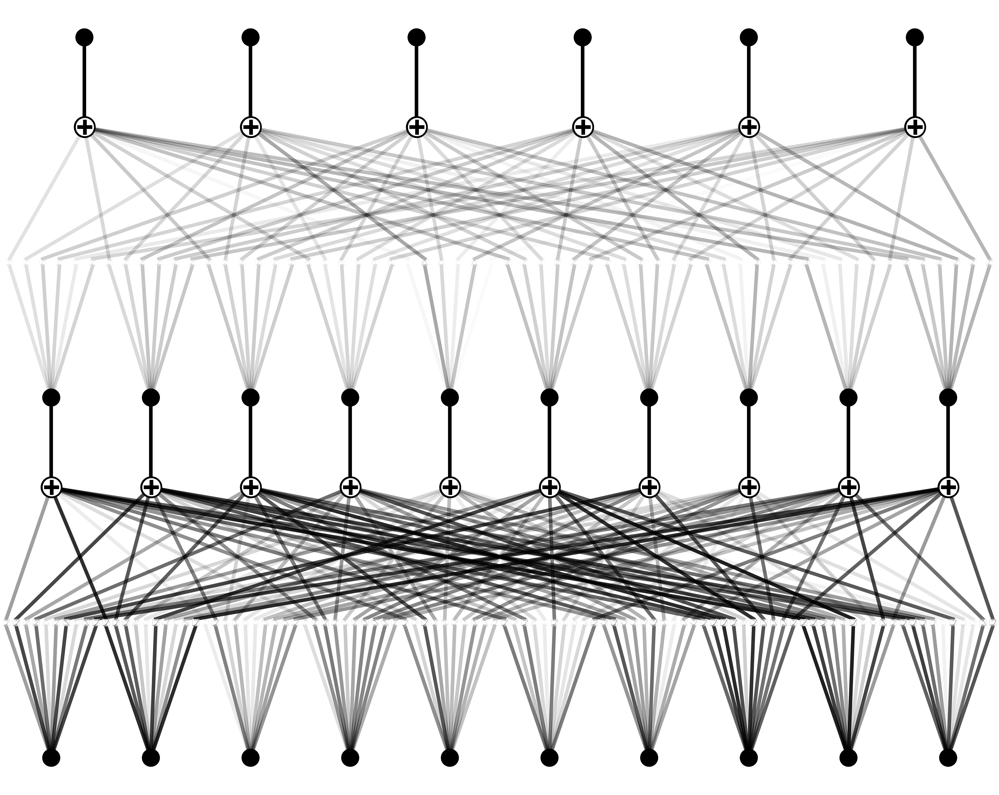

In [ ]:
# plot
model_kan(dataset["train_input"])
model_kan.plot(scale = 5)

In [ ]:
# fit model
model.fit(dataset, opt="Adam", lr=1e-3, steps=2000, lamb=5e-6)
model.plot(scale = 5)

> The learned connectivity pattern reflects the structure of the problem: most of the complexity is concentrated in the univariate transformations from inputs to hidden units, while the output layer acts mainly as a weak aggregator.

> This indicates that the deterministic component of the background is captured at the level of input-dependent functional responses, whereas the overall signal is largely dominated by stochastic fluctuations. As a result, the model avoids introducing unnecessary nonlinearities at the output level, preventing overfitting and improving interpretability.

>> **Note**: the deterministic component is the small, structured part of the background that consistently depends on physical and geometric variables, while the stochastic component represents unpredictable fluctuations that dominate the signal. The KAN isolates the former without fitting the latter.

#### Evaluation

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [ ]:
def eval_kan(model, dataset):
  model.eval()
  with torch.no_grad():
      y_pred_t = model(dataset["test_input"])   # shape: (N, out_dim)
  y_pred = y_pred_t.detach().cpu().numpy()
  y_true = dataset["test_label"].detach().cpu().numpy()
  return y_pred, y_true

In [ ]:
y_pred, y_true = eval_kan(model, dataset)
print(y_pred.shape, y_true.shape)

In [ ]:
def get_metrics(y_true, y_pred):
  mae_per = mean_absolute_error(y_true, y_pred, multioutput='raw_values')
  rmse_per = np.sqrt(mean_squared_error(y_true, y_pred, multioutput='raw_values'))
  r2_per = r2_score(y_true, y_pred, multioutput='raw_values')
  perc_error = np.mean(np.abs(y_test - y_pred) / y_test)

  print(f"Percentage error: {perc_error*100:.2f}%")
  for i in range(y_true.shape[1]):
      print(f"detector {i}: MAE={mae_per[i]:.4f}, RMSE={rmse_per[i]:.4f}, R2={r2_per[i]:.4f}")
  return mae_per, rmse_per, r2_per, perc_error

mae_per, rmse_per, r2_per, perc_error = get_metrics(y_true, y_pred)


> Again, a low R2 means that the total variance is dominated by noise!
>
> Despite this, the results are aligned with the probabilistic baselines.

#### Pruning model

In [ ]:
# default: 0.03 for edge_th, 0.01 for node_th
pruned_model = model.prune(edge_th=1e-1, node_th=1e-2)
pruned_model.plot(scale=2)

<a name="kanplot"></a>
> As we can see, the model has pruned the less contributing edges, while the most influential are the bold ones.

In [ ]:
pruned_model.fit(dataset, opt="Adam", lr=3e-4, steps=1000, lamb=5e-5)
# or: lr=1e-4 if it’s unstable

In [ ]:
y_pred, y_true = eval_kan(pruned_model, dataset)
mae_per, rmse_per, r2_per, perc_error = get_metrics(y_true, y_pred)

### Interpretability
We start by **freezing** each learned spline converting it into a **symbolic** base functions. This is actually an **approximation**, that is done to make the model more interpretable. We use symbolic functions instead of splines because splines are challenging to interpret, intrinsecally being complex mathematical objects. In order to do that, we compute a **local** [symbolic regression](https://en.wikipedia.org/wiki/Symbolic_regression), estimating affine parameters and choosing the function that maximizes the R2 score.
What we actually get will be functions of our input features!   

In [ ]:
# Freezing each spline and converts it to a symbolic piecewise polynomial representation
lib = ['x','x^2','x^3','x^4','x^5','exp','log','sqrt','tanh','sin','cos','abs']

# Ensure the directory for storing history files exists
history_dir = './model'
os.makedirs(history_dir, exist_ok=True)

pruned_model.auto_symbolic(lib=lib) # [layer, input, output]

> Interpretation of: `fixing (1,2,0) with x, r2=1.0000003576, c=1`
>
>> - KAN found that spline = perfect identity function, such that it replaced it with `f(x) = x`
>>
>> - R² ~ 1 proves it’s an exact linear mapping
>>
>> - `c = 1` indicates the constant term of the linear fit
>
> This seems good: it makes the network simpler and more interpretable.

In [ ]:
pruned_model.symbolic_formula()[::][1] # print the input features (first layer)

> this shows the activations of the hidden layer, that, due to pruning, just correspond to input features (?)

In [ ]:
pruned_model.symbolic_formula()[0][1]# print the symbolic formula of the second output (det)

As a result, we obtain a fully symbolic and analytical function that describes how the background
signal of each detector can be computed from the input features. For the first detector, the learned
symbolic model is:

\
\begin{aligned}
f_{\text{det}_1}(X)
=&\; 10.5303\,x_1
+ 0.9601\,x_2
+ 2.0749\,x_3
+ 6.8693\,x_4
+ 6.4498\,x_5
+ 3.2176\,x_6
- 1.3958\,x_7 \\
&\; -\, 0.00409\,\exp(5.8841\, x_5) -\, 11.9787\, \sin(1.6879\, x_7 - 3.7998) \\
&\; -\, 4.2900\, \sin(1.9612\, x_7 + 5.6056)
+\; 1160.8918 .
\end{aligned}


In [ ]:
for d in range(6):
  print(pruned_model.symbolic_formula()[0][d]) # print the symbolic formula of all dets

After symbolifying all the activation functions in the network, the only
remaining parameters are the affine parameters. We continue training these affine parameters.

In [ ]:
pruned_model_2_fit = pruned_model_2
pruned_model_2_fit.fit(dataset, opt="Adam", lr=1e-3, steps=1000, lamb=5e-6)

#### Feature attribution

In [ ]:
pruned_model_2.feature_score

Inspecting how each kind of neuron (of each layer) depends on each input feature. These results will show in a clearer way what the plotted model with its weighted edges showed us [before](#kanplot).

The function `attribute(l, n)` gives us the symbolic dependence of the *(l,n)-th* neuron on each input feature. In other words, it tells us which input features influence that neuron, and how strongly.

In [ ]:
input_features

In [ ]:
pruned_model_2.feature_names = list(input_features)

In [ ]:
# the n-th neuron in the l-th layer
# - the input layer has 7 inputs (features)
# - the hidden layer has 20 neurons
# - the output layer has 6 outputs (detectors)

# e.g.
l = 1 # layer
n = 4 # neuron
pruned_model_2.attribute(l, n)

In [ ]:
# inspecting input layer
for d in range(7):
  pruned_model_2.attribute(0, d)

> As expected, each feature depends on its own in the input layer

In [ ]:
# inspecting how hidden nodes depend on input features
for d in range(10):
  pruned_model_2.attribute(1, d)

In [ ]:
# inspecting output layer
for d in range(6):
  pruned_model_2.attribute(2, d)

#### Test symmetries

In [ ]:
from kan.hypothesis import *

detect_separability(pruned_model_2, X_train_t, "add")

In [ ]:
test_symmetry(pruned_model_2, X_train_t, [4, 5])

In [ ]:
plot_tree(pruned_model_2, X_train_t)

#### Analyzing the curvature of the parameter space
We compute the spectrum of the eigenvalues of the Hessian of the loss with respect to the model's parameters.

In [ ]:
inputs = dataset['train_input']
labels = dataset['train_label']
hess = get_derivative(pruned_model_2, inputs, labels, derivative='hessian')
values, vectors = torch.linalg.eigh(hess)

In [ ]:
plt.plot(values.cpu().numpy()[0], marker='o');
plt.yscale('log')

## **Anomaly** Detection

In our case, detecting anomalies means detecting the Gamma Ray Bursts!

### **Statistical foundations**

#### **Statistical Significance Test**
A statistical significance statement is always of the form:

>"How often would I see a statistic at least this extreme under the null?”

So we must specify:

* a statistic

* its null distribution

* how that null is estimated

#### **p-value and null hypothesis**

The p-value is defined as the probability, under the background-only hypothesis, of observing a detection statistic at least as extreme as the one measured in the data. In other words, it quantifies how incompatible the observed data are with the background model alone.

Formally, the null hypothesis is:

$H_0: \text{the data in this time window are background only}$.

The correct interpretation of the p-value is therefore:

> *If the data were pure background, a detection statistic at least as extreme as the observed one would occur with probability $p$.*

Importantly, the p-value does not measure the probability that a signal is present; it only measures incompatibility with $H_0$.

#### **Detection pipeline**
**1. Background modeling**

For each time bin $t$, a probabilistic regression model provides a conditional background distribution for the photon counts:

$$Y_t ∼ P(Y \ | \ X_t),$$

where $X_t$ denotes the orbital input features of the satellite at time $t$ and $Y_t$ is the random variable modeling the background fluctuations.

**2. Per-bin probabilistic score**

Given an observed count $y_t$, we compute the cumulative probability (CDF value):

$$ q_t = ℙ(Y_t \leq y_t \ | \ X_t). $$

This quantity represents the fraction of background realizations that would produce a count less than or equal to the observed one. Large values of $q_t$ (close to 1) correspond to positive excesses relative to the background.

We can now reinterpet the null-hypothesis in the following way:

$H_0: y_t \ \text{is a draw from} \  Y_t ∼ P(Y \ | \ X_t).$

### Choosing the dataset fo the GRB injection
Choosing the dataset to which GRBs will be injected into.
We will chronologically split the **contiguous** test set used for regression into two different sets, one for calibration and one for measuring **false alarms**.
In particular, this second set will be copied to create the **injection set**, at a later time.

In [ ]:
perc_split = int(0.3*len(X_test_contig))

calibration_data = X_test_contig[:perc_split]
calibration_labels = y_test_contig[:perc_split]

injection_data = X_test_contig[perc_split:]
injection_labels = y_test_contig[perc_split:]

print(f"Calibration set size: {calibration_data.shape}")
print(f"Injection set size: {injection_labels.shape}")

Calibration set size: (30069, 10)
Injection set size: (70164, 6)


### Extracting anomalous lightcurves
We will first create a dataframe where we will save the anomalous lightcurve directory and its associated **flux**. The flux is a proxy for the "strength" of the anomaly, which is a time-averaged count rate over the whole light curve.

In [ ]:
# Define path
gbm_dataset_path = '/content/drive/MyDrive/Colab Notebooks/Internship + Thesis/data/ACS_BB/FermiGBM_dataset'

records = []

for lc_dir in os.listdir(gbm_dataset_path):
    lc_path_dir = os.path.join(gbm_dataset_path, lc_dir)
    if not os.path.isdir(lc_path_dir):
        continue

    lc_files = os.listdir(lc_path_dir)

    # trova .source
    source_files = [f for f in lc_files if f.endswith(".source")]
    if not source_files:
        continue

    source_path = os.path.join(lc_path_dir, source_files[0])

    # estrai flux
    flux = None
    with open(source_path, "r") as f:
        for line in f:
            if "Flux" in line:
                try:
                    flux = float(line.split()[1])
                except ValueError:
                    pass
                break

    if flux is None:
        continue

    records.append({
        "lc_dir": lc_dir,
        "flux": flux
    })

In [ ]:
# save flux df
df_flux = pd.DataFrame(records)
df_flux.to_pickle("/content/drive/MyDrive/Colab Notebooks/Internship + Thesis/data/ACS_BB/df_flux.pkl")

In [ ]:
# load flux df
df_flux = pd.read_pickle("/content/drive/MyDrive/Colab Notebooks/Internship + Thesis/data/ACS_BB/df_flux.pkl")

In [ ]:
# show flux df
print(df_flux.head())
print(f"Total valid LCs: {len(df_flux)}")

        lc_dir      flux
0  bn080802386  8.840177
1  bn080725541  5.450850
2  bn080723913  4.408541
3  bn080815917  5.831887
4  bn080919790  5.536107
Total valid LCs: 540


Let's count how many bins do we have above a certain threshold, that defines weak / complex anomalies to detect.

In [ ]:
df_flux.loc[df_flux["flux"] < 2.5]

,lc_dir,flux
40,bn090418816,2.050642
41,bn090427644,1.686838
55,bn090626707,2.273667
75,bn100411516,0.933456


#### Rebinning

It is important to **rebin** all the anomalous lightcurves to the 50ms ACS resolution.

In [ ]:
def rebin_to_width(lc_df, bin_width):
  times = lc_df["timestamp[s]"]
  t_min, t_max = times.min(), times.max()
  edges = np.arange(t_min, t_max + bin_width, bin_width)
  rebinned_counts, _ = np.histogram(times, bins=edges)
  bin_centers = (edges[:-1] + edges[1:]) / 2
  return pd.DataFrame({"time": bin_centers, "counts": rebinned_counts})

In [ ]:
# Rebinning all the lightcurves to 50ms
gbm_dataset_path = '/content/drive/MyDrive/Colab Notebooks/Internship + Thesis/data/ACS_BB/FermiGBM_dataset'

records = []

for lc_name in os.listdir(gbm_dataset_path):
    lc_dir = os.path.join(gbm_dataset_path, lc_name)

    if not os.path.isdir(lc_dir):
      print("lc_dir warn")
      continue

    lc_csv_file = None
    for f in os.listdir(lc_dir):
        if f.endswith(".csv"):
            lc_csv_file = f
            break

    if lc_csv_file is None:
      print(f"csv warn: {lc_name}")
      continue

    lc_path = os.path.join(lc_dir, lc_csv_file)
    lc_df = pd.read_csv(lc_path)

    # Rebin
    lc_rebinned = rebin_to_width(lc_df, bin_width=0.050)

    # Get flux
    flux_row = df_flux.loc[df_flux["lc_dir"] == lc_name, "flux"]

    if len(flux_row) != 1:
      print(len(flux_row))
      print(f"[WARN] flux not unique for {lc_name}")
      continue
    flux = flux_row.iloc[0]

    records.append({
        "lc_dir": lc_name,
        "flux": flux,
        "lc": lc_rebinned
    })

0
[WARN] flux not unique for bn080831053
csv warn: bn081105614
csv warn: bn090328713 (1)
csv warn: bn090228204 (1)
csv warn: bn090308734
csv warn: bn090305052
csv warn: bn090228204
csv warn: bn090120627
csv warn: bn090510016 (1)
csv warn: bn090907808 (1)
csv warn: bn090819607 (1)
csv warn: bn090909854 (1)
csv warn: bn090510016
csv warn: bn100101988
csv warn: bn100525744
csv warn: bn101021063
csv warn: bn101224227
csv warn: bn111011094
csv warn: bn111222619
csv warn: bn120302722
csv warn: bn130219626
csv warn: bn130504314
csv warn: bn130701761
csv warn: bn140209313
csv warn: bn141202470
csv warn: bn150629564
csv warn: bn150810485
csv warn: bn150819440
csv warn: bn150811849
csv warn: bn170121133
csv warn: bn170127067
csv warn: bn170127634
csv warn: bn170206453
csv warn: bn170222209
csv warn: bn170711713
csv warn: bn170709334
csv warn: bn170816599
csv warn: bn180204109
csv warn: bn180523782
csv warn: bn180703949
csv warn: bn180715741
csv warn: bn181002617
csv warn: bn181126162
csv warn: b

In [ ]:
# TODO: some csv are missing in the drive folder

In [ ]:
# visualizing the new df
df_records = pd.DataFrame(records)
display(df_records)

,lc_dir,flux,lc
0,bn080802386,8.840177,time counts 0 0.037831 110 1 ...
1,bn080725541,5.450850,time counts 0 0.026022 112 1 ...
2,bn080723913,4.408541,time counts 0 0.031012 9 1 0.0...
3,bn080815917,5.831887,time counts 0 0.032381 35 1 ...
4,bn080919790,5.536107,time counts 0 0.039861 30 1 ...
...,...,...,...
468,bn240715239,30.468630,time counts 0 0.025629 103 1 0.0...
469,bn240821775,12.242103,time counts 0 0.026217 56 1 ...
470,bn240910488,6.919953,time counts 0 0.029765 37 1 ...
471,bn241016680,5.440932,time counts 0 0.027427 43 1 0.0...


##### Analyzing the anomalous light curves

Avg length: 19.60042283298097
Max length: 94
Avg flux: 8.76, std = 6.89
Max peak: 4671
Peak/Mean: median = 2.55, max = 11.51
#peaks: lc
0    435
1     35
2      3
Name: count, dtype: int64


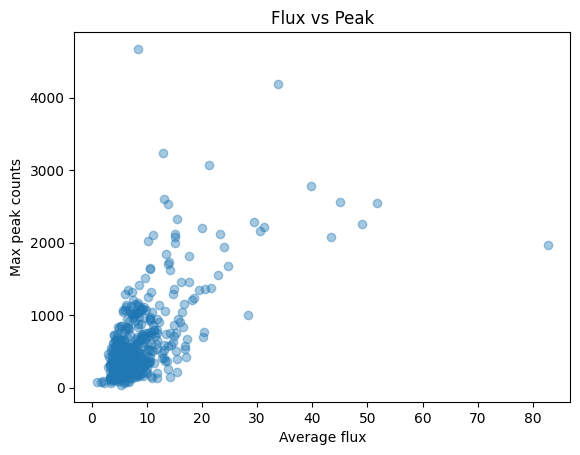

In [ ]:
from scipy.signal import find_peaks

# Avg length
# Length stats
lengths = df_records["lc"].apply(len)

# Avg flux
avg_flux = df_records["flux"].mean()
std_flux = df_records["flux"].std()

# Max peak
lc_max_peak = df_records["lc"].apply(lambda lc: lc["counts"].max())
max_peak = lc_max_peak.max()

# Peak-to-mean ratio (very informative for anomalies)
peak_to_mean = df_records["lc"].apply(
    lambda lc: lc["counts"].max() / (lc["counts"].mean() + 1e-6)
)

def n_peaks(lc, sigma=3):
    counts = lc["counts"]
    thr = counts.mean() + sigma * counts.std()
    peaks, _ = find_peaks(counts, height=thr)
    return len(peaks)

n_sig_peaks = df_records["lc"].apply(n_peaks)

print(f"Avg length: {lengths.mean()}")
print(f"Max length: {lengths.max()}")
print(f"Avg flux: {avg_flux:.2f}, std = {df_records['flux'].std():.2f}")
print(f"Max peak: {max_peak}")
print(f"Peak/Mean: median = {np.median(peak_to_mean):.2f},"
       f" max = {peak_to_mean.max():.2f}")
print(f"#peaks: {n_sig_peaks.value_counts()}")

plt.figure()
plt.scatter(df_records["flux"], lc_max_peak, alpha=0.4)
plt.xlabel("Average flux")
plt.ylabel("Max peak counts")
plt.title("Flux vs Peak")
plt.show()

> As said before, the flux represents the time-averaged photon rate over the entire light curve, whereas the peak quantifies the maximum instantaneous photon count in a single time bin. The observed correlation between peak counts and flux is therefore expected, as higher peaks contribute to the total photon budget. However, most anomalies are highly impulsive and short-lived, so their contribution is strongly diluted by temporal averaging. As a consequence, even events with peaks approaching counts often exhibit low average flux (10), indicating transient rather than sustained emission.

#### A first example

Lightcurve
- name: bn080802386, 
- flux: 8.840
- length: 18


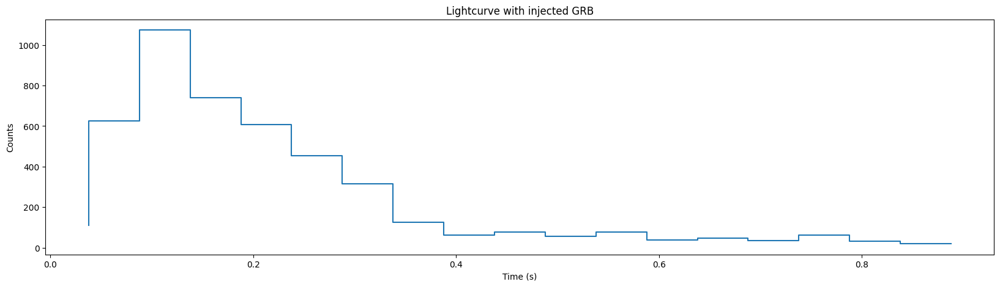

In [ ]:
# SHOW AN ANOMALY

# 1) Choosing whick kind of anomaly
# - random
#lc_idx = np.random.randint(len(df_records))
# - under a condition
flux_condition = (df_records["flux"] >= 4) & (df_records["flux"] < 50)
matching_lcs = df_records[flux_condition]

if not matching_lcs.empty:
    lc_idx = matching_lcs.index[0] # the FIRST under condition
else:
    print("No lightcurves found with flux between 3 and 4. Choosing a random one instead.")
    lc_idx = np.random.randint(len(df_records)) # Fallback to random if no match

# 2) Rebinning
lc_rebinned = df_records.iloc[lc_idx]["lc"]
print(f"Lightcurve\n- name: {df_records.iloc[lc_idx]['lc_dir']}, "
       f"\n- flux: {df_records.iloc[lc_idx]['flux']:.3f}"
       f"\n- length: {len(df_records.iloc[lc_idx]['lc'])}")

# 3) Plotting
plt.figure(figsize=(20, 5))
plt.step(lc_rebinned["time"], lc_rebinned["counts"])
plt.xlabel("Time (s)")
plt.ylabel("Counts")
plt.title("Lightcurve with injected GRB")
plt.show()

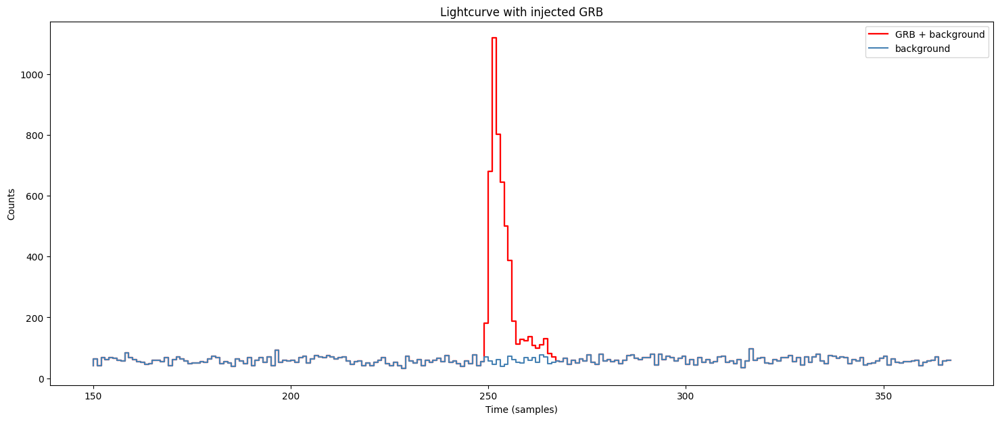

In [ ]:
# INJECTING THE ANOMALY
satellite_data = injection_labels[f"{target_count_str}{1}"] # choose the first det. here

# 1) Pick a window
start = 250
end = start + len(lc_rebinned["counts"])
t = 100 # offset to enhance visualization
new_lc = satellite_data.copy()

# 2) Inject the GRB
signal_plus_bkg = satellite_data.iloc[start:end].values + lc_rebinned["counts"].values
new_lc.iloc[start-t:start] = satellite_data.iloc[start-t:start].values
new_lc.iloc[start:end] = signal_plus_bkg
new_lc.iloc[end:end+t] = satellite_data.iloc[end:end+t].values

# 3) Plot
plt.figure(figsize=(18, 7))
plt.step(np.arange(start-t, end+t), new_lc.iloc[start-t:end+t], label = "GRB + background", color = "red", linewidth=1.65)
plt.step(np.arange(start-t, end+t), satellite_data[start-t:end+t], label = "background", color = "steelblue")
plt.title("Lightcurve with injected GRB")
plt.xlabel("Time (samples)")
plt.ylabel("Counts")
plt.legend()
plt.show()

> It is too strong! The anomaly detection task in this case would become trivial.

#### The need of scaling counts

As we were saying before, most of the anomalies are too strong, as we can see from the plot above. Hence, we will perform a **scaling** in order to reduce the strength of all the anomalous lightcurves with a flux above a certain threshold (approx. 3).

In [ ]:
# First of all, let's viz how many lc we have above 3 as flux
df_records.loc[df_records["flux"] > 3]

,lc_dir,flux,lc
0,bn080802386,8.840177,time counts 0 0.037831 110 1 ...
1,bn080725541,5.450850,time counts 0 0.026022 112 1 ...
2,bn080723913,4.408541,time counts 0 0.031012 9 1 0.0...
3,bn080815917,5.831887,time counts 0 0.032381 35 1 ...
4,bn080919790,5.536107,time counts 0 0.039861 30 1 ...
...,...,...,...
468,bn240715239,30.468630,time counts 0 0.025629 103 1 0.0...
469,bn240821775,12.242103,time counts 0 0.026217 56 1 ...
470,bn240910488,6.919953,time counts 0 0.029765 37 1 ...
471,bn241016680,5.440932,time counts 0 0.027427 43 1 0.0...


##### Example

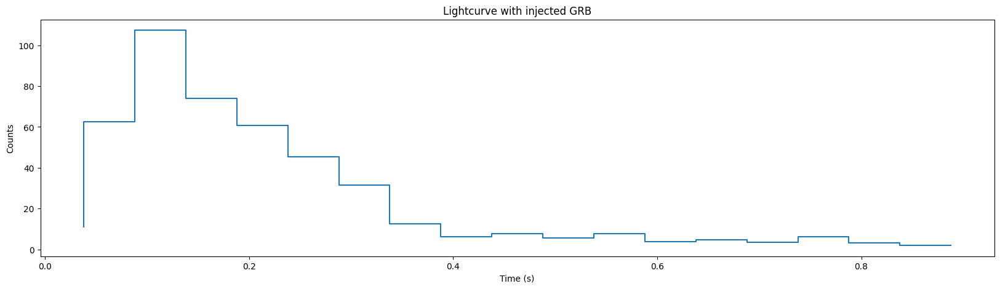

In [ ]:
# Chosen scaling method dividing by a scalar
scaled_counts = df_records['lc'][lc_idx]["counts"] / 10

plt.figure(figsize=(20, 5))
plt.step(lc_rebinned["time"], scaled_counts)
plt.xlabel("Time (s)")
plt.ylabel("Counts")
plt.title("Lightcurve with injected GRB")
plt.show()

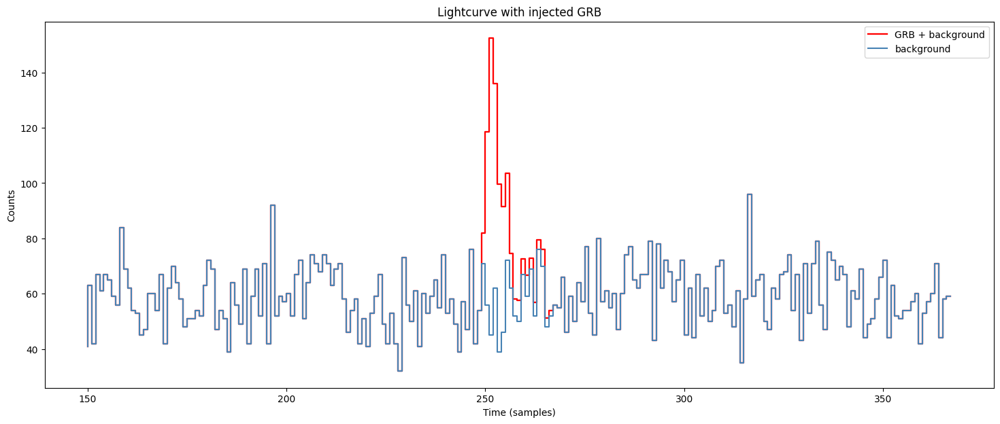

In [ ]:
# pick an example window
start = 250
end = start + len(lc_rebinned["counts"])
t = 100 # offset to enhance visualization
new_lc = satellite_data.copy()

# 2) INJECT THE GRB EXCESS COUNTS
signal_plus_bkg = satellite_data.iloc[start:end].values + scaled_counts
new_lc.iloc[start-t:start] = satellite_data.iloc[start-t:start].values # Corrected to use .iloc
new_lc.iloc[start:end] = signal_plus_bkg # Corrected to use .iloc
new_lc.iloc[end:end+t] = satellite_data.iloc[end:end+t].values # Corrected to use .iloc

# plot
plt.figure(figsize=(18, 7))
plt.step(np.arange(start-t, end+t), new_lc.iloc[start-t:end+t], label = "GRB + background", color = "red", linewidth=1.65)
plt.step(np.arange(start-t, end+t), satellite_data[start-t:end+t], label = "background", color = "steelblue")

plt.title("Lightcurve with injected GRB")
plt.xlabel("Time (samples)")
plt.ylabel("Counts")
plt.legend()
plt.show()

##### Scaling everything

In [ ]:
scaling_factor = 0.2

def add_scaled_counts(lc, scaling_factor):
    lc = lc.copy()
    lc["scaled_counts"] = lc["counts"].astype(float) * scaling_factor
    return lc

df_records["lc"] = df_records["lc"].apply(lambda lc: add_scaled_counts(lc, scaling_factor))

### Counting bins approach
Since our approach is a window-based one, we have to define a method that extracts a set of windows and another one that will compute a statistic onto it.

In [ ]:
def compute_windows(features_df, counts_df, window_size, model, scaler, n_det=6):
    windows = []
    n = len(counts_df)
    for start in range(0, n - window_size + 1, window_size):
        window_counts = counts_df.iloc[start:start + window_size]
        window_feats  = features_df.iloc[start:start + window_size]
        mu, sigma = predict_window(window_feats, model, scaler)  # both [W, n_det]
        w = {}
        for d in range(n_det):
            col = f"{target_count_str}{d+1}"
            counts = window_counts[col].values  # [W]
            w[f"det_{d+1}"] = {
                "counts": counts,
                "mu": mu[:, d],
                "sigma": sigma[:, d],
            }
        windows.append(w)
    return windows

# Predict mu and sigma for each window
def predict_window(window, model, scaler):
    window_scaled = scaler.transform(window)
    y_pred = model.predict(window_scaled, verbose=0)
    n_det = 6 # num. detectors
    mu    = y_pred[:, :n_det]
    sigma = tf.nn.softplus(tf.convert_to_tensor(y_pred[:, n_det:2*n_det])).numpy() + 1e-3
    return mu, sigma

In [ ]:
# Compute windows, a list of dict
# - for calibration set
calibration_windows = compute_windows(features_df = calibration_data,
                                      counts_df = calibration_labels,
                                      window_size = 100,
                                      model = skewnorm_regressor,
                                      scaler = scaler)
# - for injection set
background_windows = compute_windows(features_df = injection_data,
                                     counts_df = injection_labels,
                                     window_size = 100,
                                     model = skewnorm_regressor,
                                     scaler = scaler)

print(f"Num. of calibration windows: {len(calibration_windows)}")
print(f"Num. of injection windows: {len(background_windows)}")

Num. of calibration windows: 300
Num. of injection windows: 701


In [ ]:
# Chosen statistic
def compute_statistic(window, k):
    S_per_det = []
    for det_key, data in window.items():
        if not det_key.startswith("det_"):
            continue  # skip gt metadata
        counts = data["counts"]
        mu     = data["mu"]
        sigma  = data["sigma"]
        extreme = counts > (mu + k * sigma)
        S_per_det.append(extreme.sum())
    return max(S_per_det)   # OR logic

In [ ]:
stat_list = []
for i in range(len(calibration_windows)):
  stat = compute_statistic(calibration_windows[i], k=3)
  stat_list.append(stat)
print(sum(stat_list))

219


#### Calibration

Trying to estimate the empirical tail, that gives an estimate of $ℙ(S_T ≥ τ \ | \ \text{background} \ (H_0))$
where the $S_t ≥ τ$ is the trigger:

In [ ]:
S_bg = np.array(stat_list) # null distribution

plt.hist(S_bg, bins=30)
plt.xlabel(f"S_T (#bins above {k}σ)")
plt.ylabel("count")
plt.title("Null distribution of S_T")
plt.show()

# choose alpha (false alarm probability per window)
# - how often I tolerate false alarm
alpha = 1e-1

# empirical tail
values = np.unique(S_bg)
tail = np.array([(S_bg >= v).mean() for v in values]) # probability
tau = values[tail <= alpha][0] # min num of bins over thresh, s.t. the bg reaches that num. with a prob. under alpha
print(f"Empirical tail: {tau}")
print(tail)

> The empirical tail is the observed probability, from background data, that the statistic exceeds a given threshold
>
> By choosing α, we control the fraction of background windows that are expected to exceed the threshold and generate false alarms.

#### Inject GRBs

In [ ]:
import copy

window_size = 100
p_inj = 0.10 # percentage of anomalies to be injected
rng = np.random.default_rng(42)

N = len(background_windows)
n_inj_target = int(round(p_inj * N))
print(f"Num. of injected windows: {n_inj_target}")

if n_inj_target <= 0:
   injected_windows = copy.deepcopy(background_windows)
   for w in range(N):
       injected_windows[w]["gt_label"] = 0

if n_inj_target > len(df_records):
    raise ValueError(
        f"Need {n_inj_target} distinct GRBs but df_records has only {len(df_records)}."
    )

injected_windows = copy.deepcopy(background_windows)

# Default: background
for w in range(N):
    injected_windows[w]["gt_label"] = 0
    injected_windows[w]["gt_start"] = None
    injected_windows[w]["gt_end"]   = None
    injected_windows[w]["gt_grb"]   = None

# Choose which windows get an injection (no replacement)
inj_window_ids = rng.choice(N, size=n_inj_target, replace=False)

# Distinct GRB indices
grb_pool = list(rng.permutation(len(df_records))) # randomly sorted stack

for w in inj_window_ids:
    if not grb_pool:
        break
    lc_idx = grb_pool.pop() # in order to pick distinct grbs

    # randomly select a starting bin
    grb_anomaly = df_records.iloc[lc_idx]["lc"]["scaled_counts"].values.astype(float)
    L = len(grb_anomaly)
    start = np.random.randint(window_size - L + 1)
    end = start + L

    # for a single window, inject the same anomaly for each detector
    for det in range(6):
        det_num = f"det_{det+1}"
        injected_windows[w][det_num]["counts"][start:end] += grb_anomaly

    # append ground truth metadata
    injected_windows[w]["gt_start"] = start
    injected_windows[w]["gt_end"]   = end
    injected_windows[w]["gt_grb"]   = lc_idx
    injected_windows[w]["gt_label"] = 1  # anomaly or not

Num. of injected windows: 70


In [ ]:
anom_idxs = [i for i, w in enumerate(injected_windows) if w.get("gt_label", 0) == 1]
print(anom_idxs)

[30, 42, 45, 53, 54, 56, 60, 61, 83, 106, 111, 119, 128, 132, 150, 185, 227, 239, 242, 248, 254, 258, 264, 275, 278, 285, 293, 298, 302, 319, 326, 329, 332, 337, 341, 359, 368, 376, 414, 423, 445, 460, 463, 471, 472, 473, 489, 490, 508, 510, 512, 516, 518, 530, 542, 545, 546, 553, 573, 591, 606, 607, 627, 632, 638, 657, 660, 670, 672, 689]


#### Evaluation

In [ ]:
def detect_windows(windows, k, tau):
    scores = np.zeros(len(windows), dtype=int)  # #bins above threshold (OR score)
    y_pred = np.zeros(len(windows), dtype=int)

    for i, w in enumerate(windows):
        S = compute_statistic(w, k)
        scores[i] = S
        y_pred[i] = int(S >= tau)

    return y_pred, scores

def detect_for_ks(windows, ks, tau):
    out = {}  # k -> {"y_pred":..., "scores":...}
    for k in ks:
        y_pred, scores = detect_windows(windows, k, tau)
        out[k] = {"y_pred": y_pred, "scores": scores}
    return out

def evaluate_predictions(windows, y_pred):
    y_true = np.array([w.get("gt_label", 0) for w in windows], dtype=int)

    TP_idx = np.where((y_pred == 1) & (y_true == 1))[0]
    FP_idx = np.where((y_pred == 1) & (y_true == 0))[0]
    TN_idx = np.where((y_pred == 0) & (y_true == 0))[0]
    FN_idx = np.where((y_pred == 0) & (y_true == 1))[0]

    TP = int(TP_idx.size)
    FP = int(FP_idx.size)
    TN = int(TN_idx.size)
    FN = int(FN_idx.size)

    TPR = TP / (TP + FN + 1e-12)
    FPR = FP / (FP + TN + 1e-12)

    return {
        "TP": TP, "FP": FP, "TN": TN, "FN": FN,
        "TPR": TPR, "FPR": FPR,
        #"TP_idx": TP_idx, "FP_idx": FP_idx,
        #"TN_idx": TN_idx, "FN_idx": FN_idx,
    }


def evaluate_for_ks(windows, ks, tau):
    out = {}
    det_out = detect_for_ks(windows, ks, tau)

    for k in ks:
        y_pred = det_out[k]["y_pred"]
        scores = det_out[k]["scores"]

        m = evaluate_predictions(windows, y_pred)
        m["S_mean"]   = float(np.mean(scores))
        m["S_median"] = float(np.median(scores))
        m["S_max"]    = int(np.max(scores)) if len(scores) else 0

        out[k] = m

    return out, det_out

# Params
tau = 3      # num. bins over thresh
k_single = 5
ks_multi = [3, 4, 5]

# 1) Background-only test (single k)
y_pred_bg, scores_bg = detect_windows(background_windows, k_single, tau)
metrics_bg = evaluate_predictions(background_windows, y_pred_bg)
metrics_bg["S_mean"]   = float(np.mean(scores_bg))
metrics_bg["S_median"] = float(np.median(scores_bg))
metrics_bg["S_max"]    = int(np.max(scores_bg)) if len(scores_bg) else 0

print("BG TEST (k=5):", metrics_bg)
print("FPR on background test =", metrics_bg["FPR"])
print("False alarms (#triggered windows) =", metrics_bg["FP"])

# 2) Injected test (multiple k)
inj_metrics_by_k, scores = evaluate_for_ks(injected_windows, ks_multi, tau)

print("\nINJECTED (per k):")
for k in ks_multi:
    print(f"k={k}:", inj_metrics_by_k[k])


BG TEST (k=5): {'TP': 0, 'FP': 0, 'TN': 701, 'FN': 0, 'TPR': 0.0, 'FPR': 0.0, 'S_mean': 0.0, 'S_median': 0.0, 'S_max': 0}
FPR on background test = 0.0
False alarms (#triggered windows) = 0

INJECTED (per k):
k=3: {'TP': 69, 'FP': 44, 'TN': 587, 'FN': 1, 'TPR': 0.9857142857142717, 'FPR': 0.06973058637083983, 'S_mean': 2.1141226818830243, 'S_median': 1.0, 'S_max': 28}
k=4: {'TP': 61, 'FP': 0, 'TN': 631, 'FN': 9, 'TPR': 0.871428571428559, 'FPR': 0.0, 'S_mean': 0.7731811697574893, 'S_median': 0.0, 'S_max': 24}
k=5: {'TP': 51, 'FP': 0, 'TN': 631, 'FN': 19, 'TPR': 0.7285714285714182, 'FPR': 0.0, 'S_mean': 0.5748930099857347, 'S_median': 0.0, 'S_max': 20}


In [ ]:
from sklearn.metrics import roc_curve, auc

y_true = np.array([w.get("gt_label", 0) for w in injected_windows])

fpr, tpr, taus = roc_curve(y_true, scores[k_single]["scores"])
roc_auc = auc(fpr, tpr)

print("AUC:", roc_auc)

AUC: 0.9859154929577465


##### Visualize a random anomaly

In [ ]:
def _upper_tail_pvals(counts, mu, sigma, alpha=None, eps=1e-12):
    counts = np.asarray(counts, float)
    mu     = np.asarray(mu, float)
    sigma  = np.asarray(sigma, float)
    sigma  = np.clip(sigma, 1e-6, None)

    if alpha is None:
        p = norm.sf(counts, loc=mu, scale=sigma)
    else:
        alpha = np.asarray(alpha, float)
        p = skewnorm.sf(counts, a=alpha, loc=mu, scale=sigma)

    return np.clip(p, eps, 1.0)

def _find_runs(mask):
    mask = np.asarray(mask, dtype=bool)
    if mask.size == 0:
        return []
    diff = np.diff(mask.astype(int))
    starts = np.where(diff == 1)[0] + 1
    ends   = np.where(diff == -1)[0]
    if mask[0]:
        starts = np.r_[0, starts]
    if mask[-1]:
        ends = np.r_[ends, mask.size - 1]
    return list(zip(starts, ends))

def detect_anomaly_window_pvals(
    w,
    n_det=6,
    p_bin=1e-3,
    min_run=3,
    use_skew=True
):
    per_det = []
    for d in range(n_det):
        det_key = f"det_{d+1}"
        data = w[det_key]

        counts = np.asarray(data["counts"], float)
        mu     = np.asarray(data["mu"], float)
        sigma  = np.asarray(data["sigma"], float)

        alpha = None
        if use_skew and ("alpha" in data):
            alpha = np.asarray(data["alpha"], float)

        p = _upper_tail_pvals(counts, mu, sigma, alpha=alpha)
        s = -np.log(p)

        runs = _find_runs(p < p_bin)
        runs = [(a, b) for (a, b) in runs if (b - a + 1) >= min_run]

        # score = total surprisal inside detected runs
        if len(runs) == 0:
            score = 0.0
        else:
            idx = np.zeros_like(p, dtype=bool)
            for a, b in runs:
                idx[a:b+1] = True
            score = float(np.sum(s[idx]))

        per_det.append({"det_key": det_key, "pvals": p, "surprisal": s, "runs": runs, "score": score})

    best_det_i = int(np.argmax([d["score"] for d in per_det]))
    return {
        "per_det": per_det,
        "best_det": per_det[best_det_i]["det_key"],
        "best_score": per_det[best_det_i]["score"],
        "has_anomaly": any(len(d["runs"]) > 0 for d in per_det)
    }

def plot_window_detection_with_gt(
    windows,
    w_idx,
    k=3.0,               # for the sigma-threshold band μ → μ+kσ
    n_det=6,
    bin_ms=50,
    p_bin=1e-3,
    min_run=3,
    show_mu=True,
    use_skew=True
):
    w = windows[w_idx]
    W = len(w["det_1"]["counts"])
    x = np.arange(W) * bin_ms

    # detection (does NOT use GT)
    det_out = detect_anomaly_window_pvals(
        w, n_det=n_det, p_bin=p_bin, min_run=min_run, use_skew=use_skew
    )

    # GT boundaries (only for overlay)
    inj_start = w.get("gt_start", None)
    inj_end   = w.get("gt_end", None)
    has_gt = (inj_start is not None) and (inj_end is not None)

    fig, axes = plt.subplots(n_det, 1, figsize=(12, 2.2*n_det), sharex=True)
    if n_det == 1:
        axes = [axes]

    for d in range(n_det):
        det_key = f"det_{d+1}"
        data = w[det_key]
        runs = det_out["per_det"][d]["runs"]

        counts = np.asarray(data["counts"], float)
        mu     = np.asarray(data["mu"], float)
        sigma  = np.asarray(data["sigma"], float)
        thr    = mu + k * sigma

        ax = axes[d]

        ax.step(x, counts, where="post", label="counts")
        ax.step(x, thr, where="post", label=rf"$\mu + {k}\sigma$")
        if show_mu:
            ax.step(x, mu, where="post", label=r"$\mu$")

        # fill between mean and threshold (as requested)
        ax.fill_between(
            x, mu, thr,
            step="post",
            alpha=0.25,
            label=rf"band ($\mu \to \mu+{k}\sigma$)",
            color="orange"
        )

        # highlight detected runs (from p-values)
        for i, (a, b) in enumerate(runs):
            ax.axvspan(
                a*bin_ms, (b+1)*bin_ms,
                alpha=0.18,
                label="detected run" if i == 0 else None
            )

        # vertical lines for true anomaly boundaries (GT overlay)
        if has_gt:
            ax.axvline(inj_start * bin_ms, linestyle="--", linewidth=1, color="red",
                       label="GT start" if d == 0 else None)
            ax.axvline(inj_end   * bin_ms, linestyle="--", linewidth=1, color="red",
                       label="GT end" if d == 0 else None)

        ax.set_title(
            #f"Window {w_idx} - {det_names[det_key]} | tau={len(runs)} | score={det_out['per_det'][d]['score']:.2f}"
            f"Window {w_idx} - {det_names[det_key]} | n_anomalies={len(runs)}"
        )
        ax.set_ylabel("counts")
        ax.grid(True, alpha=0.3)
        ax.legend(loc="upper right")

    axes[-1].set_xlabel("time [ms]")
    plt.tight_layout()
    plt.show()

    print(f"Window {w_idx} detection summary (GT not used for detection):")
    print(f"  has_anomaly: {det_out['has_anomaly']}")
    print(f"  best_det: {det_out['best_det']}")
    print(f"  best_score: {det_out['best_score']:.2f}")
    print(f"  p_bin={p_bin}, min_run={min_run}, k={k}")
    if has_gt:
        print(f"  GT interval bins: [{inj_start}, {inj_end}]  -> ms: [{inj_start*bin_ms}, {inj_end*bin_ms}]")

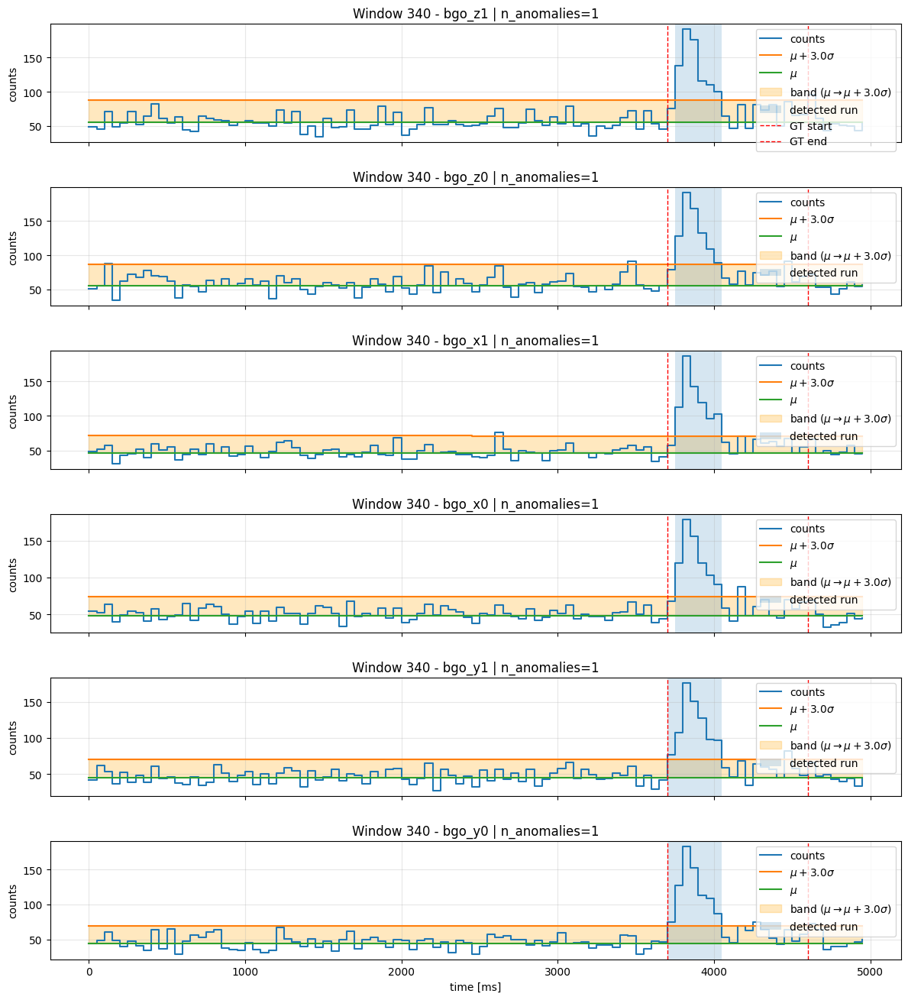

Window 340 detection summary (GT not used for detection):
  has_anomaly: True
  best_det: det_5
  best_score: 163.24
  p_bin=0.001, min_run=3, k=3.0
  GT interval bins: [74, 92]  -> ms: [3700, 4600]


In [ ]:
w_idx = np.random.choice(anom_idxs)
plot_window_detection_with_gt(injected_windows, w_idx, p_bin=1e-3, min_run=3, bin_ms=50, use_skew=True)


##### How many bins over thresh in general

In [ ]:
# How many bins are over the threhsold, in general?
full_bg_scaled = scaler.transform(X_test_contig)

y_pred = skewnorm_regressor.predict(full_bg_scaled)
n_det = 6 # num. detectors
mu    = y_pred[:, :n_det]
sigma = tf.nn.softplus(tf.convert_to_tensor(y_pred[:, n_det:2*n_det])).numpy() + 1e-3
alpha = y_pred[:, 2*n_det:]

bins_over_sigma = []
k = 3

for det in range(n_det):
  mu_det    = mu[:, det]
  sigma_det = sigma[:, det]
  alpha_det = alpha[:, det]
  y_pred_mean = mu_det
  q_low  = SIGMA_TO_QUANTILES[k]     # Gaussian -kσ
  q_high = 1 - q_low                 # Gaussian +kσ
  lower = skewnorm.ppf(q_low, a=alpha_det, loc=mu_det, scale=sigma_det)
  upper = skewnorm.ppf(q_high, a=alpha_det, loc=mu_det, scale=sigma_det)
  bins_over_sigma_det = np.sum(y_test_contig[f"{target_count_str}{det+1}"].values > upper)
  bins_over_sigma.append(bins_over_sigma_det)

print(f"Number of bins > {k}*sigma: {int(np.mean(bins_over_sigma))}")
print(f"Coverage: {int(np.mean(bins_over_sigma)) / len(y_test_contig) * 100:.3f}%")

2089/2089 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step


TypeError: unsupported operand type(s) for -: 'int' and 'tuple'

## TODO LIST
- Use **Spearman** for SHAP correlation matrix to inspect non-linear correlations
- **Collinearity**: SHAP and also KANs can share feature importance between correlated features
  - The **residual** trick: use this for strongly correlated pairs of features
    1. choose the main feature $F$ in a pair $(F, G)$
    2. fit a model such that $G ≈ h(F)$
    3. substitute G with the residual $R = G - h(F)$

    R will now contain just the info of G that are not explainable by F.
    It is just a try, it isn't meant to work.

- **Transforming** longitudinal variables using the $sin$ or the $cos$ function, since they are periodic variables (the KAN regressor shows a $sin/cos$ function in the final formula)

- More **pruning** for KAN

- **Anomaly detection**: compute metrics

  

> Although the sine/cosine encoding increases the input dimensionality, it reduces the functional degrees of freedom of the model by imposing strong geometric constraints on angular variables, preventing the model from wasting capacity to learn periodicity and artificial discontinuities.